# Real-Time Autonomous Driving Object Detection with YOLO on BDD100K

**An end-to-end perception pipeline: dataset engineering → transfer learning → evaluation → error analysis → robustness analysis → deployment-style inference.**

---

## What this notebook is

This notebook builds and rigorously evaluates a 2D object detector for autonomous-driving perception using
[BDD100K](https://www.bdd100k.com/) (Berkeley DeepDrive 100K) and a modern
[Ultralytics YOLO](https://docs.ultralytics.com/) model.

It is deliberately **not** a "train YOLO in 10 lines" tutorial. The emphasis is on the parts that
distinguish a real perception engineering effort from a demo:

| Stage | What is done here |
|---|---|
| **Dataset engineering** | Robust discovery of BDD100K on Drive/local disk, support for *both* the legacy and `det_20` label schemas, category-alias normalisation, corruption-safe conversion to YOLO format, cached annotation index |
| **Split design** | Official-split-aware, leakage-free three-way split with a genuinely held-out evaluation set |
| **Training** | Transfer learning from COCO-pretrained weights, mixed precision, early stopping, resumable + idempotent runs |
| **Evaluation** | mAP@50, mAP@50–95, per-class AP, precision/recall/F1, confusion matrix — all from real `model.val()` output |
| **Error analysis** | A custom IoU matcher producing a TIDE-style error taxonomy (background FP, localisation, class confusion, duplicates, misses), stratified by object size and scene condition |
| **Robustness analysis** | Per-condition evaluation across BDD100K's `timeofday` / `weather` / `scene` metadata |
| **Deployment realism** | Latency/FPS benchmarking with correct GPU synchronisation, image + video inference, honest discussion of real-time viability |

## Scope, stated honestly

This is an **autonomous-driving perception component** — specifically a monocular 2D object detector.
It is **not** a self-driving system. It has no depth or 3D reasoning, no temporal tracking, no
sensor fusion, no prediction, and no planning or control. See *Limitations* at the end.

## How to run it

1. Runtime → Change runtime type → **GPU** (T4 or better).
2. Run the cells top to bottom.
3. The only step that may require manual action is **obtaining BDD100K** (Section 6) — Berkeley
   requires registration, so this notebook cannot legally or reliably download it for you. Every
   other step is automated, and the notebook tells you exactly where to put the files.

All configuration lives in **one cell** (Section 5). You should not need to edit anything else.


## 2. Research questions

The experiments below are organised around five questions. Each is answered in
*Section 27: Answers to the research questions*, using only numbers produced by the actual runs.

**RQ1 — Accuracy.** How accurately can a modestly-sized YOLO detector localise and classify common
road users and traffic infrastructure in diverse real-world driving scenes?

**RQ2 — Class difficulty.** Which object categories are hardest, and *why* — is the difficulty driven by
class rarity, small object scale, or inter-class visual similarity?

**RQ3 — Robustness.** How much does detection quality degrade under adverse conditions (night, rain,
snow, fog) relative to clear daytime driving?

**RQ4 — Accuracy/latency trade-off.** What is the measured inference latency, and is it compatible with
the latency budget of a real perception stack?

**RQ5 — Failure modes.** Which error types dominate, and which of them actually matter for driving safety?
A missed distant traffic sign and a missed nearby pedestrian are both "one false negative" to mAP, but
they are not remotely equivalent on the road.


## 3. Environment setup

Ultralytics is the only package installed here; everything else (PyTorch, OpenCV, NumPy, pandas,
Matplotlib, PyYAML) ships with Colab. Installation is done with `subprocess` rather than `!pip` /
`%pip` magics so that every cell in this notebook is valid, statically-checkable Python.

The install is **skipped entirely** if a suitable Ultralytics version is already importable, so
re-running the notebook is cheap.


In [1]:
"""Install and verify dependencies. Safe to re-run: installs only what is missing."""

import importlib
import subprocess
import sys

# Minimum Ultralytics version that provides the YOLO26 model family and the
# per-image validation metrics used later in the error-analysis section.
MIN_ULTRALYTICS = (8, 3, 0)
FORCE_UPGRADE_ULTRALYTICS = False  # set True to force `pip install -U ultralytics`


def _version_tuple(version_string):
    """Parse a version string into a comparable tuple, ignoring non-numeric suffixes."""
    parts = []
    for chunk in str(version_string).split(".")[:3]:
        digits = "".join(ch for ch in chunk if ch.isdigit())
        parts.append(int(digits) if digits else 0)
    while len(parts) < 3:
        parts.append(0)
    return tuple(parts)


def _pip_install(args):
    """Run pip quietly and surface a readable error rather than a wall of output."""
    cmd = [sys.executable, "-m", "pip", "install", "-q", *args]
    print(f"$ {' '.join(cmd[2:])}")
    proc = subprocess.run(cmd, capture_output=True, text=True)
    if proc.returncode != 0:
        print("pip failed:\n", proc.stderr[-2000:])
    return proc.returncode == 0


def ensure_ultralytics():
    """Import ultralytics, installing or upgrading it only when necessary."""
    need_install = FORCE_UPGRADE_ULTRALYTICS
    if not need_install:
        try:
            import ultralytics  # noqa: F401
            if _version_tuple(ultralytics.__version__) < MIN_ULTRALYTICS:
                print(f"ultralytics {ultralytics.__version__} is older than required; upgrading.")
                need_install = True
        except ImportError:
            print("ultralytics not found; installing.")
            need_install = True

    if need_install:
        _pip_install(["-U", "ultralytics"])
        # Invalidate caches so a freshly installed package is importable in this session.
        importlib.invalidate_caches()
        for module in [m for m in list(sys.modules) if m.startswith("ultralytics")]:
            del sys.modules[module]

    import ultralytics
    return ultralytics


ultralytics = ensure_ultralytics()
print(f"ultralytics : {ultralytics.__version__}")

import cv2
import matplotlib
import numpy as np
import pandas as pd
import torch
import yaml

for name, mod in [("torch", torch), ("numpy", np), ("pandas", pd),
                  ("opencv", cv2), ("matplotlib", matplotlib), ("pyyaml", yaml)]:
    print(f"{name:<12}: {getattr(mod, '__version__', 'unknown')}")

print("\nNo runtime restart is required.")


ultralytics not found; installing.
$ pip install -q -U ultralytics
Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
ultralytics : 8.4.147
torch       : 2.11.0+cu128
numpy       : 2.1.3
pandas      : 2.2.3
opencv      : 5.0.0
matplotlib  : 3.10.0
pyyaml      : 6.0.3

No runtime restart is required.


In [2]:
"""Core imports and hardware report. Everything the notebook needs is imported here."""

import gzip
import json
import os
import platform
import random
import re
import shutil
import socket
import time
import warnings
from collections import Counter, defaultdict
from dataclasses import dataclass, field
from pathlib import Path

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image, ImageFile
from ultralytics import YOLO

# BDD100K contains a handful of images with truncated JPEG streams. Allowing PIL to load
# them lets the validation pass flag them explicitly instead of raising mid-pipeline.
ImageFile.LOAD_TRUNCATED_IMAGES = True
warnings.filterwarnings("ignore", category=UserWarning)

plt.rcParams.update({
    "figure.dpi": 110,
    "savefig.dpi": 150,
    "figure.facecolor": "white",
    "axes.grid": True,
    "grid.alpha": 0.25,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "font.size": 10,
})


def describe_environment():
    """Print a hardware/software report and return the torch device to use."""
    print("=" * 70)
    print("ENVIRONMENT")
    print("=" * 70)
    print(f"Python      : {platform.python_version()}")
    print(f"Platform    : {platform.platform()}")
    print(f"PyTorch     : {torch.__version__}")
    print(f"CUDA build  : {torch.version.cuda}")

    if torch.cuda.is_available():
        index = torch.cuda.current_device()
        props = torch.cuda.get_device_properties(index)
        total_gb = props.total_memory / (1024 ** 3)
        print(f"GPU         : {props.name}")
        print(f"GPU memory  : {total_gb:.1f} GiB")
        print(f"Capability  : sm_{props.major}{props.minor}")
        print(f"BF16 support: {torch.cuda.is_bf16_supported()}")
        device = "cuda:0"
    else:
        total_gb = 0.0
        print("GPU         : NOT DETECTED")
        print()
        print("WARNING: no CUDA GPU is visible.")
        print("  In Colab: Runtime -> Change runtime type -> Hardware accelerator -> GPU.")
        print("  Training on CPU is not practical for this dataset; evaluation and")
        print("  inference will still run, but very slowly.")
        device = "cpu"

    print("=" * 70)
    return device, total_gb


DEVICE, GPU_MEMORY_GB = describe_environment()

# Shared result registry. Later sections read from this so that skipping or re-running
# an individual section degrades gracefully instead of raising NameError.
STATE = {}


def have(*keys):
    """Return True only if every key has been populated in STATE.

    Prints a deliberately loud banner when a section is skipped: a quiet one-line
    notice is far too easy to scroll past in a long notebook, which makes a run that
    produced nothing look like a run that succeeded.
    """
    missing = [k for k in keys if STATE.get(k) is None]
    if missing:
        print("!" * 74)
        print("!!  SECTION SKIPPED - NOTHING WAS COMPUTED HERE")
        print("!" * 74)
        print(f"!!  Needs: {', '.join(missing)}")
        if not STATE.get("discovery"):
            print("!!  Cause: BDD100K was not found. See Section 6 for setup instructions.")
        else:
            print("!!  Cause: an earlier section did not complete. Re-run from the top.")
        print("!" * 74)
        return False
    return True


ENVIRONMENT
Python      : 3.13.15
Platform    : Linux-6.6.122+-x86_64-with-glibc2.39
PyTorch     : 2.11.0+cu128
CUDA build  : 12.8
GPU         : Tesla T4
GPU memory  : 14.6 GiB
Capability  : sm_75
BF16 support: True


## 4. Google Drive setup

Drive is used as the persistent store: Colab VMs are ephemeral, and losing a trained checkpoint to a
disconnect is avoidable. The layout below is created on first run and reused afterwards.

```text
bdd100k_yolo_project/
├── dataset/          # where you place the downloaded BDD100K archives / folders
├── cache/            # parsed annotation index + build manifests (avoids re-parsing)
├── models/           # trained weights (best.pt, last.pt) + pretrained checkpoints
├── results/          # metrics JSON/CSV, experiment summary, comparison table
├── predictions/      # annotated prediction images and video
├── evaluation/       # raw Ultralytics validation run directories
├── visualizations/   # all figures
└── logs/             # training logs and run configuration
```

**One important performance note.** Training writes thousands of small files and reads images
constantly. Drive is a network filesystem and is *slow* for that access pattern. So the pipeline
deliberately: builds the YOLO dataset on **local Colab disk**, trains to **local disk**, and then
**copies the durable artifacts** (weights, metrics, figures, logs) to Drive when each stage finishes.
You get persistence without paying Drive latency on every batch.


In [3]:
"""Mount Google Drive when running in Colab; fall back to a local directory otherwise."""

PROJECT_DIR_NAME = "bdd100k_yolo_project"


def setup_storage_root():
    """Mount Drive if available and return (project_root, in_colab, drive_mounted)."""
    in_colab = "google.colab" in sys.modules or os.path.isdir("/content")
    drive_mounted = False

    try:
        from google.colab import drive as colab_drive

        mount_point = Path("/content/drive")
        if not (mount_point / "MyDrive").exists():
            colab_drive.mount(str(mount_point))
        drive_mounted = (mount_point / "MyDrive").exists()
    except ImportError:
        pass
    except Exception as exc:  # user declined authorisation, transient mount failure, ...
        print(f"Drive mount did not complete ({type(exc).__name__}: {exc}).")

    if drive_mounted:
        root = Path("/content/drive/MyDrive") / PROJECT_DIR_NAME
        print(f"Google Drive mounted. Project root: {root}")
    elif in_colab:
        root = Path("/content") / PROJECT_DIR_NAME
        print("Google Drive is NOT mounted.")
        print(f"Falling back to ephemeral local storage: {root}")
        print("WARNING: files here are lost when the Colab runtime disconnects.")
    else:
        root = Path.cwd() / PROJECT_DIR_NAME
        print(f"Not running in Colab. Project root: {root}")

    return root, in_colab, drive_mounted


PROJECT_ROOT, IN_COLAB, DRIVE_MOUNTED = setup_storage_root()


Drive mount did not complete (ValueError: mount failed).
Google Drive is NOT mounted.
Falling back to ephemeral local storage: /content/bdd100k_yolo_project


## 5. Configuration

**Everything tunable lives in this one cell.** No other cell needs editing.

### Notes on the defaults

**`TRAIN_IMAGES = 12000`.** BDD100K's training split has 70,000 images. A full-split run at 640px on a
Colab T4 is roughly 25–35 minutes *per epoch*, which does not survive a Colab session limit. A
deterministic 12k subsample trains in ~3–4 minutes per epoch and still produces a genuinely useful
detector. This is a compute compromise, not a methodological one — set `TRAIN_IMAGES = None` to use
the full split if you have the runtime budget, and the entire pipeline scales unchanged.

**`MODEL_NAME = "yolo26s.pt"`.** Small enough for a T4, large enough to be a fair baseline. The loader
falls back through `yolo11s.pt` / `yolov8s.pt` if your Ultralytics version predates YOLO26, so the
notebook does not break on an older install.

**`IMAGE_SIZE = 640`.** BDD100K images are 1280×720, so 640 halves the linear resolution. This
disproportionately hurts small objects (distant traffic lights especially) and the error analysis
quantifies exactly that. `IMAGE_SIZE = 960` measurably improves small-object recall at roughly
2× the training cost — a worthwhile experiment if you have the time.

**`QUICK_TEST_MODE`.** Set `True` for a ~10 minute smoke test of the entire pipeline (tiny subsets,
3 epochs). Use it to verify the plumbing before committing to a real run. Metrics from a quick run
are *not* meaningful and the notebook labels them as such.

**`HALT_IF_DATASET_MISSING = True`.** If BDD100K cannot be found *and* cannot be downloaded, the
notebook stops immediately with a clear error rather than letting every downstream cell skip quietly. A
run that trains nothing should not be able to look like a successful one.

**`AUTO_DOWNLOAD = True`.** Tries each source in `DOWNLOAD_SOURCES` in turn until the dataset is
complete. See Section 6 — the availability situation for BDD100K is genuinely messy right now, and
that section explains which routes work and which have gone dark. Set `False` if you have already
placed the data yourself.

**`CACHE_ARCHIVES_ON_DRIVE = False`.** By default the ~6 GB of archives are downloaded to Colab's local
disk and discarded when the session ends, costing a re-download (~5–15 min) on each new session. Set
`True` to keep them on Drive instead — faster on subsequent sessions, but it consumes a large share of a
free 15 GB Drive quota.


In [4]:
"""Centralised experiment configuration. This is the only cell you should need to edit."""

QUICK_TEST_MODE = False  # True => tiny subsets + 3 epochs, for verifying the pipeline end to end


@dataclass
class Config:
    # ----- model ---------------------------------------------------------------
    MODEL_NAME: str = "yolo26s.pt"          # primary model (transfer learning from COCO weights)
    COMPARISON_MODEL_NAME: str = "yolo26n.pt"  # second model for the size/speed comparison
    RUN_MODEL_COMPARISON: bool = False      # True => also TRAIN the comparison model (doubles runtime)

    # ----- training ------------------------------------------------------------
    IMAGE_SIZE: int = 640
    BATCH_SIZE: int = 0                     # 0 => derive from GPU memory (see auto_batch_size)
    EPOCHS: int = 25
    LEARNING_RATE: float = 0.01             # lr0; the optimizer is auto-selected by Ultralytics
    PATIENCE: int = 8                       # early stopping: epochs without val improvement
    WORKERS: int = 4                        # Colab VMs typically expose 2-8 vCPUs
    OPTIMIZER: str = "auto"
    COS_LR: bool = True
    CLOSE_MOSAIC: int = 5                   # disable mosaic for the final N epochs
    AMP: bool = True                        # mixed precision (falls back automatically on CPU)
    FORCE_RETRAIN: bool = False             # True => ignore cached weights and retrain

    # Stop the notebook loudly if BDD100K is missing, instead of quietly skipping
    # every downstream cell. Set False if you want the cells to no-op instead.
    HALT_IF_DATASET_MISSING: bool = True

    # ----- dataset acquisition -------------------------------------------------
    # BDD100K is distributed by the ETH VIS Group from a direct, login-free mirror,
    # so the download can be fully automated. ~6 GB, once per session.
    AUTO_DOWNLOAD: bool = True
    # Sources are tried in order until the dataset is complete. Each is preflighted,
    # so a dead host costs seconds, not minutes of retries.
    # Kaggle first: the ETH mirror is currently down, and the Hugging Face image
    # mirror stores ~100k loose files with no labels, so it cannot finish the job alone.
    DOWNLOAD_SOURCES: tuple = ("manual_urls", "hf_10k", "kaggle", "ethz", "huggingface")

    # A public, ungated 10,000-image BDD100K release (~695 MB) curated by the ETH VIS
    # Group. No account of any kind. Smaller than the full 70k train split, but it
    # carries detections AND the weather/timeofday/scene attributes, so every analysis
    # in this notebook still runs.
    HF_10K_REPO: str = "dgural/bdd100k"

    # Paste direct download links here (see Section 6). This is the no-account route:
    # sign in to the BDD100K portal in your browser, copy the link behind each download
    # button, and paste it below. Colab fetches it at datacentre speed, so the data
    # never travels over your own connection.
    MANUAL_DOWNLOAD_URLS: tuple = (
        # Paste the images link here, in quotes, ending with a comma.
        # Paste the labels link here, in quotes, ending with a comma.
    )
    # The HF image mirror is ~100,000 individual files. Unauthenticated that is hours,
    # so it is opt-in rather than something you can stumble into.
    ALLOW_SLOW_HF_IMAGE_DOWNLOAD: bool = False
    DOWNLOAD_BASE_URL: str = "https://dl.cv.ethz.ch/bdd100k/data/"
    KAGGLE_DATASET: str = "solesensei/solesensei_bdd100k"
    HF_IMAGES_REPO: str = "karthik789338/BDD100K-Images"
    HF_LABELS_REPO: str = ""             # set if you know a repo hosting det_20 JSON
    DOWNLOAD_TEST_IMAGES: bool = False   # the test split is unlabelled; 1.6 GB we never use
    CACHE_ARCHIVES_ON_DRIVE: bool = False  # True => keep the ~6 GB of zips on Drive
    DOWNLOAD_RETRIES: int = 3

    # ----- inference / evaluation ---------------------------------------------
    CONFIDENCE_THRESHOLD: float = 0.25      # for qualitative output and deployment-style inference
    IOU_THRESHOLD: float = 0.7              # NMS IoU
    MAX_DET: int = 300
    EVAL_IOU_MATCH: float = 0.50            # IoU used by the custom error-analysis matcher

    # ----- dataset sizes -------------------------------------------------------
    # Drawn deterministically from the OFFICIAL splits. None => use the entire split.
    TRAIN_IMAGES: int = 12000               # from official train
    VAL_IMAGES: int = 2000                  # from official train, disjoint (model selection)
    TEST_IMAGES: int = 5000                 # from official val (held out for final evaluation)

    # ----- analysis sample sizes ----------------------------------------------
    ERROR_ANALYSIS_IMAGES: int = 500        # images fed through the custom error matcher
    QUALITATIVE_SAMPLES: int = 8
    MIN_IMAGES_PER_CONDITION: int = 150     # conditions rarer than this are not evaluated separately
    BENCHMARK_ITERATIONS: int = 60
    MAX_VIDEO_SECONDS: int = 20

    # ----- classes -------------------------------------------------------------
    # 'train' (the vehicle) exists in BDD100K but is vanishingly rare; the statistics cell
    # prints its real count. It is excluded so it cannot distort the class-averaged mAP.
    EXCLUDED_CATEGORIES: tuple = ("train",)

    # ----- reproducibility -----------------------------------------------------
    SEED: int = 42
    DETERMINISTIC: bool = True

    # ----- optional user inputs (leave as None to use built-in fallbacks) ------
    USER_IMAGE_PATH: str = None             # e.g. "/content/drive/MyDrive/my_dashcam_frame.jpg"
    USER_VIDEO_PATH: str = None             # e.g. "/content/drive/MyDrive/my_drive.mp4"

    # ----- paths (populated in __post_init__) ---------------------------------
    project_root: Path = None
    dataset_dir: Path = None
    cache_dir: Path = None
    models_dir: Path = None
    results_dir: Path = None
    predictions_dir: Path = None
    evaluation_dir: Path = None
    visualizations_dir: Path = None
    logs_dir: Path = None
    work_dir: Path = None                   # fast local scratch (NOT Drive)
    yolo_dataset_dir: Path = None
    runs_dir: Path = None

    def __post_init__(self):
        self.project_root = PROJECT_ROOT
        self.dataset_dir = self.project_root / "dataset"
        self.cache_dir = self.project_root / "cache"
        self.models_dir = self.project_root / "models"
        self.results_dir = self.project_root / "results"
        self.predictions_dir = self.project_root / "predictions"
        self.evaluation_dir = self.project_root / "evaluation"
        self.visualizations_dir = self.project_root / "visualizations"
        self.logs_dir = self.project_root / "logs"

        # Local scratch: image reads and checkpoint writes must not hit Drive.
        local_base = Path("/content") if Path("/content").exists() else Path.cwd()
        self.work_dir = local_base / "bdd100k_work"
        self.yolo_dataset_dir = self.work_dir / "yolo_dataset"
        self.runs_dir = self.work_dir / "runs"

    @property
    def drive_dirs(self):
        return [self.dataset_dir, self.cache_dir, self.models_dir, self.results_dir,
                self.predictions_dir, self.evaluation_dir, self.visualizations_dir, self.logs_dir]

    @property
    def run_name(self):
        tag = "quick" if QUICK_TEST_MODE else "full"
        stem = Path(self.MODEL_NAME).stem
        return f"bdd100k_{stem}_{self.IMAGE_SIZE}px_{tag}"

    def to_dict(self):
        out = {}
        for key, value in self.__dict__.items():
            out[key] = str(value) if isinstance(value, Path) else value
        out["run_name"] = self.run_name
        out["quick_test_mode"] = QUICK_TEST_MODE
        return out


CONFIG = Config()

if QUICK_TEST_MODE:
    CONFIG.EPOCHS = 3
    CONFIG.TRAIN_IMAGES = 600
    CONFIG.VAL_IMAGES = 150
    CONFIG.TEST_IMAGES = 300
    CONFIG.ERROR_ANALYSIS_IMAGES = 80
    CONFIG.MIN_IMAGES_PER_CONDITION = 20
    CONFIG.BENCHMARK_ITERATIONS = 20
    CONFIG.PATIENCE = 3
    print(">>> QUICK_TEST_MODE is ON. Metrics from this run are NOT meaningful. <<<\n")

print(f"Run name : {CONFIG.run_name}")
print(f"Model    : {CONFIG.MODEL_NAME}")
print(f"Image sz : {CONFIG.IMAGE_SIZE}")
print(f"Epochs   : {CONFIG.EPOCHS}")
print(f"Splits   : train={CONFIG.TRAIN_IMAGES}  val={CONFIG.VAL_IMAGES}  test={CONFIG.TEST_IMAGES}")
print(f"Drive    : {CONFIG.project_root}")
print(f"Scratch  : {CONFIG.work_dir}")


Run name : bdd100k_yolo26s_640px_full
Model    : yolo26s.pt
Image sz : 640
Epochs   : 25
Splits   : train=12000  val=2000  test=5000
Drive    : /content/bdd100k_yolo_project
Scratch  : /content/bdd100k_work


In [5]:
"""Create the directory tree and pin every random seed we control."""


def set_global_seeds(seed):
    """Seed Python, NumPy and PyTorch. Ultralytics is seeded separately via its `seed` argument."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)


def create_directories(config):
    """Create Drive and scratch directories idempotently."""
    for directory in config.drive_dirs:
        directory.mkdir(parents=True, exist_ok=True)
    for directory in [config.work_dir, config.yolo_dataset_dir, config.runs_dir]:
        directory.mkdir(parents=True, exist_ok=True)


set_global_seeds(CONFIG.SEED)
create_directories(CONFIG)

# Persist the exact configuration alongside the results for reproducibility.
CONFIG_SNAPSHOT_PATH = CONFIG.logs_dir / f"config_{CONFIG.run_name}.json"
with open(CONFIG_SNAPSHOT_PATH, "w") as handle:
    json.dump(CONFIG.to_dict(), handle, indent=2)

print(f"Seeds set to {CONFIG.SEED}.")
print("Directory tree ready:")
for directory in CONFIG.drive_dirs:
    print(f"  {directory}")
print(f"\nConfiguration snapshot written to {CONFIG_SNAPSHOT_PATH}")


Seeds set to 42.
Directory tree ready:
  /content/bdd100k_yolo_project/dataset
  /content/bdd100k_yolo_project/cache
  /content/bdd100k_yolo_project/models
  /content/bdd100k_yolo_project/results
  /content/bdd100k_yolo_project/predictions
  /content/bdd100k_yolo_project/evaluation
  /content/bdd100k_yolo_project/visualizations
  /content/bdd100k_yolo_project/logs

Configuration snapshot written to /content/bdd100k_yolo_project/logs/config_bdd100k_yolo26s_640px_full.json


## 6. BDD100K dataset acquisition

### The honest state of BDD100K availability

Getting BDD100K in 2026 is more awkward than it should be, so this section is explicit about what
works rather than optimistic about what is supposed to.

| Route | Status | Automatable? |
|---|---|---|
| **ETH Zurich mirror** (`dl.cv.ethz.ch`) — what the official docs point to | **Currently unreachable.** The whole `cv.ethz.ch` subdomain fails DNS resolution, and SysCV's own issue tracker carries reports of the same for their other datasets | Yes, when it returns |
| **Public 10k release** (`dgural/bdd100k` on Hugging Face) | Live | **Yes — no account of any kind** |
| **Kaggle mirror** | Live | Yes — one-time free credential setup |
| **Hugging Face mirrors** | Live, but the known image mirror stores ~100,000 *loose files* (hours to fetch) and carries **no labels** | Opt-in only |
| **Berkeley portal** (`bdd-data.berkeley.edu`) | Live, requires registration | No |

The notebook therefore tries **several sources in order** (`CONFIG.DOWNLOAD_SOURCES`) and stops as
soon as it has images plus labels. **If you have no accounts anywhere, Route 0 below runs
automatically and needs nothing from you.** Sources can contribute different pieces — one mirror may supply images and another the
labels — and the set is re-checked after each.

Every source is **preflighted** (DNS, then an HTTP `HEAD`) before any large transfer starts. A host
that does not resolve costs about a second and is skipped, rather than burning through three retries
with exponential backoff per archive.

A source is also skipped when it **cannot finish the job**. The Hugging Face image mirror has no
labels, and images without annotations train nothing — so it is not attempted unless labels are
already in hand, and the multi-hour loose-file download requires setting
`ALLOW_SLOW_HF_IMAGE_DOWNLOAD = True` explicitly. Spending hours on a source that cannot possibly
produce a trainable dataset is worse than failing immediately.

### Route 0 (nothing to sign up for): the public 10k release

`dgural/bdd100k` on the Hugging Face Hub is public and ungated — **no account, no token, no
registration**. It is curated by the ETH VIS Group, is about **695 MB**, and is tried automatically
before anything else. If you want the notebook to just work, do nothing and let this run.

**What you get:** 10,000 images with detection boxes *and* the `weather` / `timeofday` / `scene`
attributes — so every section of this notebook, including the robustness analysis, runs properly.

**The honest trade-off:** this is the BDD100K **validation** split, not the 70,000-image training
split. Two consequences worth stating in your write-up:

* Absolute mAP will be lower than a full-data run — roughly 7,500 training images instead of 12,000
  by default, and rare classes suffer most.
* The notebook splits these 10,000 images into its own train / val / test pools. They are disjoint
  (asserted in code, so there is no leakage), but they come from the same official split, so the
  evaluation does not carry the extra credibility of testing on a split the model never saw the
  distribution of.

Neither undermines the methodology — the split is still leakage-free and the test set is still
untouched during model selection. It is simply less data. If you later obtain the full dataset, set
`DOWNLOAD_SOURCES` to skip `hf_10k` and everything re-runs unchanged.

The download arrives in FiftyOne format (relative `[x, y, w, h]` boxes, classification-wrapped
attributes); the notebook converts it to the standard BDD100K JSON + directory layout, so the rest of
the pipeline is identical no matter which source supplied the data.

### Route 1 (no account needed): paste the download links

This is usually the least painful option, and it avoids downloading 6 GB to your own machine only to
upload it to Drive again.

1. Open the [BDD100K portal](https://bdd-data.berkeley.edu/) in your browser and sign in.
2. Find the **100K Images** and **Detection 2020 Labels** download buttons.
3. **Right-click each button → "Copy link address".** Do not click them.
4. Paste both links into `MANUAL_DOWNLOAD_URLS` in the configuration cell:

```python
MANUAL_DOWNLOAD_URLS: tuple = (
    "the images link you copied",
    "the labels link you copied",
)
```

5. Re-run the acquisition cell. Colab downloads directly from the portal at datacentre speed —
   typically minutes, and nothing travels over your home connection.

**If a link expires**, the download fails verification (portals return an HTML error page rather than
a zip, which the integrity check catches). Copy a fresh link and re-run — partial downloads resume
rather than restart.

### Route 2 (no account needed): download by hand

If the links will not copy, download both files in your browser and put them — unextracted — into:

```text
/content/drive/MyDrive/bdd100k_yolo_project/dataset/
```

Filename matching is fuzzy, so `bdd100k_images_100k (1).zip` is fine. Uploading 6 GB to Drive through
a browser is slow and prone to failing, which is why Route 1 is preferred. If you only want a single
session, uploading to `/content/` in Colab's file browser also works and is faster.

### Route 3: enable the Kaggle source

Kaggle is free — an account and a token file, not a paid API. This is the one route that is both live
and fully automatic, so it is worth the five minutes if you expect to re-run on fresh Colab sessions:

1. Create a free [Kaggle](https://www.kaggle.com/) account.
2. **Settings → API → Create New Token.** This downloads `kaggle.json`.
3. In Colab, click the **key icon** in the left sidebar and add two secrets:
   `KAGGLE_USERNAME` and `KAGGLE_KEY` (the values are inside `kaggle.json`).
   Alternatively, upload `kaggle.json` to `/content/`.
4. Re-run the next cell.

Mirror contents vary, so the notebook assumes nothing about layout. Whatever arrives is
auto-extracted, searched for both the modern `det_20` and legacy label schemas, and indexed
**recursively** — the Kaggle mirror in particular nests some images in `train/trainA/`,
`train/trainB/` and similar subfolders rather than placing them flat in `train/`, which a naive
non-recursive glob reports as zero images. Everything is then put through the full validation in
Section 7, so an incomplete mirror is reported rather than silently half-trained on.

The Kaggle mirror ships the **legacy** label schema (`bdd100k_labels_images_train.json`), which
carries the same `weather` / `timeofday` / `scene` attributes as `det_20` and is read natively by the
alias table in Section 8.

### Always works: the Berkeley portal

Register at [bdd-data.berkeley.edu](https://bdd-data.berkeley.edu/), download **100K Images** and
**Detection 2020 Labels**, and drop both zips (no need to extract) into:

```text
/content/drive/MyDrive/bdd100k_yolo_project/dataset/
```

Filename matching is fuzzy, so a browser-renamed `bdd100k_images_100k (1).zip` is still recognised.
Already-extracted trees are detected too:

```text
dataset/bdd100k/images/100k/{train,val}/*.jpg
dataset/bdd100k/labels/det_20/{det_train,det_val}.json
dataset/bdd100k_labels_images_{train,val}.json   # legacy schema, also supported
```

### Why the labels matter more than they look

It is tempting to grab any BDD100K mirror with pre-converted YOLO `.txt` labels and skip the JSON.
Don't. The `det_20` / legacy JSON carries per-image **`weather`, `timeofday` and `scene`** attributes,
and those drive the entire robustness analysis in Section 22 — the part of this project that
distinguishes it from a generic detection tutorial. Converted `.txt` labels throw that metadata away
and often use an undocumented class ordering.

### Download behaviour

* **Resumable** — dropped connections continue via HTTP `Range` rather than restarting.
* **Verified** — archives are checked against `Content-Length` for truncation and for zip integrity
  before being trusted; a corrupt file is deleted and re-fetched.
* **Fail-fast** — DNS failures abort a source immediately instead of retrying.
* **Idempotent** — already-extracted archives are skipped on re-run.
* **Disk-aware** — archives are deleted right after extraction; Colab's disk will not hold 6 GB of
  zips *and* the extracted images.

Archives go to local disk by default, so a new session re-downloads. Set
`CONFIG.CACHE_ARCHIVES_ON_DRIVE = True` to keep them on Drive, trading quota for faster startup. The
parsed annotation cache and trained weights always go to Drive regardless — small, and expensive to
recreate.

### If everything fails

The cell prints what is missing, an inventory of every location searched, both setup options, and
then **stops the notebook**. Stopping is deliberate: quietly skipping 25 downstream cells makes a run
that trained nothing look like one that succeeded.

**Licence.** BDD100K is free for research use; you agree to its licence by downloading. This notebook
redistributes no data and fetches only from third-party mirrors you choose to enable.


In [6]:
"""Locate BDD100K on Drive or local disk, extracting archives if needed."""

import zipfile

ARCHIVE_SUFFIXES = (".zip", ".tar", ".tar.gz", ".tgz")


def classify_archive(filename):
    """Guess what a BDD100K archive contains from its filename.

    Matching is deliberately fuzzy rather than an exact-name lookup: browsers rename
    duplicate downloads to 'bdd100k_images_100k (1).zip', and the portal has used
    several naming conventions over the years. Returns 'images', 'labels' or None.
    """
    name = filename.lower()
    if not name.endswith(ARCHIVE_SUFFIXES):
        return None
    if not any(token in name for token in ("bdd100k", "bdd", "100k", "det_20", "det20")):
        return None
    if "label" in name or "det_20" in name or "det20" in name or "det_" in name:
        return "labels"
    if "image" in name or "100k" in name:
        return "images"
    return None

TRAIN_LABEL_FILENAMES = ["det_train.json", "bdd100k_labels_images_train.json",
                         "det_v2_train_release.json", "bdd100k_labels_images_det_coco_train.json"]
VAL_LABEL_FILENAMES = ["det_val.json", "bdd100k_labels_images_val.json",
                       "det_v2_val_release.json", "bdd100k_labels_images_det_coco_val.json"]


def _search_roots(config):
    """Directories worth looking in, cheapest and most likely first."""
    roots = [config.dataset_dir, config.project_root]
    for extra in ["/content/bdd100k", "/content/dataset", "/content/datasets", "/content"]:
        roots.append(Path(extra))
    if DRIVE_MOUNTED:
        # Specific dataset locations only. The Drive ROOT is deliberately not searched:
        # it is full of unrelated personal files, and listing it in a diagnostic that
        # gets saved into notebook output is a privacy leak waiting to be committed to
        # a public repository. Anything outside these paths is found via AUTO_DOWNLOAD
        # or by pointing CONFIG.dataset_dir at it.
        drive = Path("/content/drive/MyDrive")
        roots += [drive / "bdd100k", drive / "datasets" / "bdd100k",
                  drive / "BDD100K", drive / "data" / "bdd100k"]
    seen, unique = set(), []
    for root in roots:
        key = str(root)
        if key not in seen and root.exists():
            seen.add(key)
            unique.append(root)
    return unique


def _find_archives(roots):
    """Return {kind: [paths]} for BDD100K-looking archives sitting in the search roots."""
    found = defaultdict(list)
    seen = set()
    for root in roots:
        try:
            entries = list(root.iterdir())
        except (PermissionError, OSError):
            continue
        for entry in entries:
            if not entry.is_file() or entry.resolve() in seen:
                continue
            kind = classify_archive(entry.name)
            if kind:
                seen.add(entry.resolve())
                found[kind].append(entry)
    return found


def _looks_dataset_related(name):
    """Whether a filename is worth showing in the diagnostic inventory."""
    lowered = name.lower()
    tokens = ("bdd", "100k", "det_20", "det20", "label", "image", "dataset", "data")
    return (lowered.endswith(ARCHIVE_SUFFIXES)
            or any(token in lowered for token in tokens))


def inventory_search_roots(roots, max_entries=15):
    """Show what is actually in each search location.

    This is the single most useful diagnostic when discovery fails: it makes an empty
    folder, a half-finished upload, or a file saved under an unexpected name obvious
    at a glance, instead of leaving you guessing why nothing was found.
    """
    print("\nContents of each location searched:")
    for root in roots:
        try:
            entries = sorted(root.iterdir())
        except (PermissionError, OSError) as exc:
            print(f"\n  {root}  -> unreadable ({type(exc).__name__})")
            continue

        print(f"\n  {root}")
        if not entries:
            print("      (empty)")
            continue

        # Only list dataset-relevant entries. Some search roots are the user's Drive
        # root, and printing its full contents into a notebook that may be committed
        # to a public repository would leak personal filenames for no diagnostic gain.
        inside_project = str(root).startswith(str(CONFIG.project_root))
        shown, hidden = 0, 0
        for entry in entries:
            relevant = inside_project or _looks_dataset_related(entry.name)
            if not relevant:
                hidden += 1
                continue
            if shown >= max_entries:
                hidden += 1
                continue
            shown += 1
            if entry.is_dir():
                print(f"      [dir ] {entry.name}/")
            else:
                size = entry.stat().st_size
                unit = f"{size / 1e9:.2f} GB" if size >= 1e9 else f"{size / 1e6:.1f} MB"
                kind = classify_archive(entry.name)
                tag = f"  <- looks like BDD100K {kind}" if kind else ""
                print(f"      [file] {entry.name}  ({unit}){tag}")
        if shown == 0:
            print(f"      (nothing dataset-related; {hidden} other entries not listed)")
        elif hidden:
            print(f"      ... and {hidden} other entries not listed")


def _extract_archive(archive_path, destination):
    """Extract a zip archive, skipping the work if it already looks extracted."""
    destination.mkdir(parents=True, exist_ok=True)
    marker = destination / f".extracted_{archive_path.name}"
    if marker.exists():
        print(f"  already extracted: {archive_path.name}")
        return True
    if archive_path.suffix.lower() != ".zip":
        print(f"  cannot auto-extract {archive_path.name} (only .zip is handled); "
              f"please extract it manually into {destination}")
        return False

    size_gb = archive_path.stat().st_size / (1024 ** 3)
    print(f"  extracting {archive_path.name} ({size_gb:.2f} GB) -> {destination}")
    print("  (this takes several minutes for the image archive)")
    try:
        with zipfile.ZipFile(archive_path) as zf:
            zf.extractall(destination)
        marker.touch()
        print(f"  done: {archive_path.name}")
        return True
    except (zipfile.BadZipFile, OSError) as exc:
        print(f"  FAILED to extract {archive_path.name}: {type(exc).__name__}: {exc}")
        print("  The download may be incomplete. Re-download and try again.")
        return False


BDD100K_DOWNLOADS = {
    "100k_images_train.zip": ("images", 5.3),
    "100k_images_val.zip": ("images", 0.8),
    "100k_images_test.zip": ("images", 1.6),
    "bdd100k_det_20_labels_trainval.zip": ("labels", 0.05),
}


def _format_bytes(n):
    return f"{n / 1e9:.2f} GB" if n >= 1e9 else f"{n / 1e6:.1f} MB"


def download_with_resume(url, destination, retries=3, chunk_size=1 << 20):
    """Stream a URL to disk, resuming a partial file via an HTTP Range request.

    Colab connections drop, and re-fetching 5 GB from scratch because of one blip is
    avoidable: a partial file is continued rather than restarted. Returns True on success.
    """
    import urllib.error
    import urllib.request

    destination.parent.mkdir(parents=True, exist_ok=True)

    for attempt in range(1, retries + 1):
        existing = destination.stat().st_size if destination.exists() else 0
        request = urllib.request.Request(url, headers={"User-Agent": "Mozilla/5.0"})
        if existing:
            request.add_header("Range", f"bytes={existing}-")

        try:
            with urllib.request.urlopen(request, timeout=60) as response:
                status = response.status
                if status == 206:
                    mode, downloaded = "ab", existing
                    total = existing + int(response.headers.get("Content-Length", 0))
                    print(f"    resuming at {_format_bytes(existing)}")
                else:
                    # The server ignored the Range header, so start over.
                    mode, downloaded, existing = "wb", 0, 0
                    total = int(response.headers.get("Content-Length", 0))

                last_report = time.time()
                started = time.time()
                with open(destination, mode) as handle:
                    while True:
                        block = response.read(chunk_size)
                        if not block:
                            break
                        handle.write(block)
                        downloaded += len(block)
                        now = time.time()
                        if now - last_report > 3:
                            rate = (downloaded - existing) / max(now - started, 1e-6)
                            if total:
                                pct = 100 * downloaded / total
                                eta = (total - downloaded) / max(rate, 1)
                                print(f"      {pct:5.1f}%  {_format_bytes(downloaded)}"
                                      f" / {_format_bytes(total)}"
                                      f"  {rate / 1e6:.1f} MB/s  ETA {eta / 60:.1f} min",
                                      end="\r")
                            else:
                                print(f"      {_format_bytes(downloaded)}"
                                      f"  {rate / 1e6:.1f} MB/s", end="\r")
                            last_report = now

            print(" " * 90, end="\r")
            if total and destination.stat().st_size < total * 0.999:
                raise IOError(f"truncated: {destination.stat().st_size} of {total} bytes")
            print(f"    downloaded {_format_bytes(destination.stat().st_size)}")
            return True

        except urllib.error.HTTPError as exc:
            if exc.code == 416:  # range beyond end of file => already complete
                print("    already complete")
                return True
            print(f"    HTTP {exc.code} on attempt {attempt}/{retries}: {exc.reason}")
        except urllib.error.URLError as exc:
            # A DNS failure is not transient in the way a dropped packet is: the host
            # does not exist from here, and retrying three times with backoff only
            # wastes the user's time. Abort this source immediately.
            if isinstance(exc.reason, socket.gaierror):
                print(f"    host cannot be resolved: {exc.reason}")
                return False
            print(f"    attempt {attempt}/{retries} failed: {type(exc).__name__}: {exc}")
        except (IOError, TimeoutError) as exc:
            print(f"    attempt {attempt}/{retries} failed: {type(exc).__name__}: {exc}")

        if attempt < retries:
            wait = 2 ** attempt
            print(f"    retrying in {wait}s (the partial file is kept and resumed)")
            time.sleep(wait)

    return False


def verify_archive(path):
    """Confirm a downloaded zip is structurally intact before trusting it."""
    try:
        with zipfile.ZipFile(path) as zf:
            if not zf.namelist():
                return False, "archive is empty"
        return True, "ok"
    except zipfile.BadZipFile as exc:
        return False, f"corrupt zip: {exc}"
    except OSError as exc:
        return False, f"unreadable: {exc}"


def preflight_url(url, timeout=15):
    """Check a host is resolvable and responding before committing to a large download.

    Returns (ok, reason). Distinguishing "host does not exist" from "server said no"
    matters: the first means try another source, the second may be worth a retry.
    """
    import urllib.error
    import urllib.request
    from urllib.parse import urlparse

    host = urlparse(url).hostname
    if not host:
        return False, "malformed URL"
    try:
        socket.getaddrinfo(host, 443, proto=socket.IPPROTO_TCP)
    except socket.gaierror as exc:
        return False, f"DNS lookup for {host} failed ({exc.args[0]}) - host appears to be down"

    try:
        request = urllib.request.Request(url, method="HEAD",
                                         headers={"User-Agent": "Mozilla/5.0"})
        with urllib.request.urlopen(request, timeout=timeout) as response:
            return True, f"HTTP {response.status}"
    except urllib.error.HTTPError as exc:
        # A 403/405 on HEAD is common and does not imply GET will fail.
        return (exc.code < 500), f"HTTP {exc.code}"
    except Exception as exc:
        return False, f"{type(exc).__name__}: {exc}"


def _filename_from_url(url, index):
    """Derive a sensible archive filename from a URL, ignoring query strings."""
    from urllib.parse import unquote, urlparse

    candidate = Path(unquote(urlparse(url).path)).name
    if candidate.lower().endswith(ARCHIVE_SUFFIXES):
        return candidate
    # Portal links are often signed and end in an opaque token rather than a filename.
    lowered = url.lower()
    if "det" in lowered and "label" in lowered:
        return "bdd100k_det_20_labels_trainval.zip"
    if "label" in lowered:
        return "bdd100k_labels_release.zip"
    if "100k" in lowered and "image" in lowered:
        return "bdd100k_images_100k.zip"
    return f"bdd100k_manual_{index}.zip"


def acquire_from_urls(config):
    """Download from links pasted into CONFIG.MANUAL_DOWNLOAD_URLS.

    This is the route for people who do not want a Kaggle account: sign in to the
    BDD100K portal in a browser, copy the link behind each download button, and paste
    it into the config. Colab fetches directly, so a 6 GB archive never has to travel
    down to your machine and back up to Drive.
    """
    urls = [u.strip() for u in config.MANUAL_DOWNLOAD_URLS if u and u.strip()]
    if not urls:
        print("  no URLs in CONFIG.MANUAL_DOWNLOAD_URLS - skipping this source.")
        print("  See Section 6 for how to get download links without an account.")
        return None

    archive_dir = (config.dataset_dir if config.CACHE_ARCHIVES_ON_DRIVE
                   else config.work_dir / "downloads")
    extract_dir = config.work_dir / "bdd100k_raw"
    archive_dir.mkdir(parents=True, exist_ok=True)
    print(f"  {len(urls)} URL(s) configured")

    succeeded = 0
    for index, url in enumerate(urls, start=1):
        name = _filename_from_url(url, index)
        destination = archive_dir / name
        print(f"\n  [{index}/{len(urls)}] {name}")

        marker = extract_dir / f".extracted_{name}"
        if marker.exists():
            print("    already extracted, skipping")
            succeeded += 1
            continue

        ok, reason = preflight_url(url)
        if not ok:
            print(f"    unreachable: {reason}")
            print("    Portal links often expire - re-copy it from the download page.")
            continue

        if destination.exists():
            valid, why = verify_archive(destination)
            if valid:
                print("    already downloaded and verified")
            else:
                print(f"    existing file unusable ({why}) - re-downloading")
                destination.unlink()

        if not destination.exists():
            if not download_with_resume(url, destination, retries=config.DOWNLOAD_RETRIES):
                print("    download failed")
                continue
            valid, why = verify_archive(destination)
            if not valid:
                print(f"    downloaded file failed verification ({why})")
                print("    If the link required a login, it may have returned an HTML")
                print("    error page instead of the archive. Re-copy a fresh link.")
                continue
            print("    verified")

        if _extract_archive(destination, extract_dir):
            succeeded += 1
            if not config.CACHE_ARCHIVES_ON_DRIVE:
                try:
                    destination.unlink()
                    print("    removed the archive to reclaim disk space")
                except OSError:
                    pass

    return extract_dir if succeeded else None


def _fiftyone_box_to_xyxy(bounding_box, width, height):
    """FiftyOne stores [top-left-x, top-left-y, w, h] as fractions of the image."""
    rx, ry, rw, rh = [float(v) for v in bounding_box[:4]]
    return [rx * width, ry * height, (rx + rw) * width, (ry + rh) * height]


def _classification_label(value):
    """FiftyOne classifications are dicts with a 'label'; tolerate plain strings too."""
    if isinstance(value, dict):
        return value.get("label", "undefined") or "undefined"
    if isinstance(value, str):
        return value or "undefined"
    return "undefined"


def _convert_fiftyone_samples(samples, image_lookup, destination, seed, val_fraction=0.25):
    """Convert FiftyOne-style samples into the BDD100K directory + JSON layout.

    Produces images/100k/{train,val} plus labels/det_20/{det_train,det_val}.json, so
    the rest of the pipeline is identical regardless of which source supplied the data.
    """
    rng = random.Random(seed)
    ordered = sorted(samples, key=lambda s: str(s.get("filepath", "")))
    rng.shuffle(ordered)
    cut = int(len(ordered) * (1 - val_fraction))
    assignment = [("train", ordered[:cut]), ("val", ordered[cut:])]

    counts = Counter()
    for split_name, subset in assignment:
        image_dir = destination / "bdd100k" / "images" / "100k" / split_name
        image_dir.mkdir(parents=True, exist_ok=True)
        frames = []

        for sample in subset:
            filepath = str(sample.get("filepath", ""))
            name = Path(filepath).name
            source = image_lookup.get(name)
            if source is None:
                counts["image_missing"] += 1
                continue

            target = image_dir / name
            if not target.exists():
                try:
                    os.symlink(source, target)
                except OSError:
                    shutil.copy2(source, target)

            try:
                with Image.open(target) as img:
                    width, height = img.size
            except Exception:
                counts["image_unreadable"] += 1
                continue

            detections = sample.get("detections") or {}
            if isinstance(detections, dict):
                detections = detections.get("detections") or []

            labels = []
            for detection in detections:
                if not isinstance(detection, dict):
                    continue
                box = detection.get("bounding_box")
                category = detection.get("label")
                if not box or not category or len(box) < 4:
                    counts["detection_malformed"] += 1
                    continue
                x1, y1, x2, y2 = _fiftyone_box_to_xyxy(box, width, height)
                labels.append({"category": category,
                               "box2d": {"x1": x1, "y1": y1, "x2": x2, "y2": y2}})
                counts["boxes"] += 1

            frames.append({
                "name": name,
                "attributes": {
                    "weather": _classification_label(sample.get("weather")),
                    "scene": _classification_label(sample.get("scene")),
                    "timeofday": _classification_label(sample.get("timeofday")),
                },
                "labels": labels,
            })
            counts[f"frames_{split_name}"] += 1

        label_dir = destination / "bdd100k" / "labels" / "det_20"
        label_dir.mkdir(parents=True, exist_ok=True)
        with open(label_dir / f"det_{split_name}.json", "w") as handle:
            json.dump(frames, handle)

    return counts


def _load_fiftyone_samples(root):
    """Find and parse the sample records in a FiftyOne-format HF repo.

    The on-disk layout of these exports varies, so several known shapes are tried and
    the one that actually parses is used, rather than assuming a single schema.
    """
    candidates = list(root.rglob("samples.json")) + list(root.rglob("metadata.json"))
    for path in candidates:
        try:
            with open(path) as handle:
                payload = json.load(handle)
        except (OSError, json.JSONDecodeError):
            continue
        if isinstance(payload, dict) and isinstance(payload.get("samples"), list):
            print(f"  parsed {len(payload['samples']):,} samples from {path.name}")
            return payload["samples"]
        if isinstance(payload, list) and payload and isinstance(payload[0], dict) \
                and "filepath" in payload[0]:
            print(f"  parsed {len(payload):,} samples from {path.name}")
            return payload
    return None


def acquire_from_hf_10k(config):
    """Fetch the public 10,000-image BDD100K release. No account required."""
    try:
        from huggingface_hub import snapshot_download
    except ImportError:
        print("  installing huggingface_hub")
        if not _pip_install(["huggingface_hub"]):
            return None
        from huggingface_hub import snapshot_download

    print(f"  repo: {config.HF_10K_REPO}  (~695 MB, no login needed)")
    raw = config.work_dir / "hf_10k_raw"
    try:
        snapshot_download(repo_id=config.HF_10K_REPO, repo_type="dataset",
                          local_dir=str(raw), max_workers=8)
    except Exception as exc:
        print(f"  download failed: {type(exc).__name__}: {exc}")
        return None

    image_lookup = {p.name: p for p in raw.rglob("*.jpg")}
    print(f"  found {len(image_lookup):,} images in the download")
    if not image_lookup:
        print("  no images found in the repository - cannot use this source.")
        return None

    samples = _load_fiftyone_samples(raw)
    if not samples:
        print("  could not locate sample/label records in this repository.")
        print("  The repository layout may have changed. Files present at the top level:")
        for entry in sorted(raw.iterdir())[:15]:
            print(f"    {entry.name}")
        return None

    destination = config.work_dir / "hf_10k_bdd"
    counts = _convert_fiftyone_samples(samples, image_lookup, destination, config.SEED)

    print(f"  converted: {counts.get('frames_train', 0):,} train frames, "
          f"{counts.get('frames_val', 0):,} val frames, {counts.get('boxes', 0):,} boxes")
    for problem in ["image_missing", "image_unreadable", "detection_malformed"]:
        if counts.get(problem):
            print(f"  note: {counts[problem]:,} {problem}")

    if not counts.get("boxes"):
        print("  WARNING: no bounding boxes were produced. Not usable for training.")
        return None

    print("\n  NOTE: this source provides 10,000 images (the BDD100K val split), not the")
    print("  full 70,000-image train split. It is split here into train/val pools so the")
    print("  rest of the pipeline is unchanged, but absolute metrics will be lower than a")
    print("  full-data run, and train/test come from the same official split.")
    return destination


def acquire_from_kaggle(config):
    """Fetch a BDD100K mirror from Kaggle. Requires Kaggle credentials.

    In Colab the easiest route is Secrets: add KAGGLE_USERNAME and KAGGLE_KEY in the
    key icon on the left sidebar, or upload kaggle.json to /content.
    """
    print(f"  dataset: {config.KAGGLE_DATASET}")
    try:
        import kagglehub
    except ImportError:
        print("  kagglehub is not installed; installing")
        if not _pip_install(["kagglehub"]):
            return None
        try:
            import kagglehub
        except ImportError:
            print("  kagglehub still unavailable")
            return None

    # Surface Colab secrets as the environment variables kagglehub expects.
    if not (os.environ.get("KAGGLE_USERNAME") and os.environ.get("KAGGLE_KEY")):
        try:
            from google.colab import userdata
            for key in ("KAGGLE_USERNAME", "KAGGLE_KEY"):
                value = userdata.get(key)
                if value:
                    os.environ[key] = value
        except Exception:
            pass

    has_credentials = bool(os.environ.get("KAGGLE_KEY")) or \
        Path.home().joinpath(".kaggle", "kaggle.json").exists() or \
        Path("/content/kaggle.json").exists()
    if Path("/content/kaggle.json").exists():
        target = Path.home() / ".kaggle" / "kaggle.json"
        target.parent.mkdir(parents=True, exist_ok=True)
        shutil.copy2("/content/kaggle.json", target)
        target.chmod(0o600)

    if not has_credentials:
        print("  no Kaggle credentials found - skipping this source.")
        print("  To enable: Colab sidebar -> key icon -> add KAGGLE_USERNAME and")
        print("  KAGGLE_KEY (from kaggle.com -> Settings -> Create New Token).")
        return None

    try:
        print("  downloading (this is several GB and may take a while) ...")
        path = kagglehub.dataset_download(config.KAGGLE_DATASET)
        print(f"  downloaded to {path}")
        return Path(path)
    except Exception as exc:
        print(f"  Kaggle download failed: {type(exc).__name__}: {exc}")
        return None


def acquire_from_huggingface(config, have_labels=False):
    """Fetch BDD100K mirrors from the Hugging Face Hub (no login for public repos).

    Images are only attempted when labels are already in hand. The known image mirror
    stores ~100,000 loose JPEGs rather than archives, and fetching those one at a time
    takes hours - which is wasted entirely if no label source exists, since images
    alone cannot train anything.
    """
    try:
        from huggingface_hub import snapshot_download
    except ImportError:
        print("  installing huggingface_hub")
        if not _pip_install(["huggingface_hub"]):
            return None
        from huggingface_hub import snapshot_download

    # An HF token lifts rate limits substantially on a 100k-file repo.
    if not os.environ.get("HF_TOKEN"):
        try:
            from google.colab import userdata
            token = userdata.get("HF_TOKEN")
            if token:
                os.environ["HF_TOKEN"] = token
                print("  using HF_TOKEN from Colab secrets (higher rate limits)")
        except Exception:
            pass

    destination = config.work_dir / "hf_bdd100k"
    destination.mkdir(parents=True, exist_ok=True)
    got_anything = False

    # --- labels first: they are small, and without them images are useless ---
    if config.HF_LABELS_REPO:
        print(f"  labels: {config.HF_LABELS_REPO}")
        try:
            snapshot_download(repo_id=config.HF_LABELS_REPO, repo_type="dataset",
                              local_dir=str(destination), max_workers=8)
            got_anything = True
        except Exception as exc:
            print(f"  failed: {type(exc).__name__}: {exc}")
    elif not have_labels:
        print("  no label repo is configured (CONFIG.HF_LABELS_REPO is empty).")

    if not (have_labels or got_anything):
        print("  Skipping the image download: no labels are available from any source,")
        print("  and images without annotations cannot train or evaluate anything.")
        print("  Enable the Kaggle source instead - see the instructions below.")
        return None

    if not config.HF_IMAGES_REPO:
        return destination if got_anything else None

    if not config.ALLOW_SLOW_HF_IMAGE_DOWNLOAD:
        print(f"  images: {config.HF_IMAGES_REPO}")
        print("  SKIPPED. This mirror stores ~100,000 individual files rather than")
        print("  archives; unauthenticated that typically takes several hours.")
        print("  Set CONFIG.ALLOW_SLOW_HF_IMAGE_DOWNLOAD = True to accept that cost,")
        print("  and add an HF_TOKEN Colab secret to speed it up considerably.")
        return destination if got_anything else None

    print(f"  images: {config.HF_IMAGES_REPO}")
    print("  WARNING: ~100,000 files. This will take a long time.")
    # Only the splits actually used; the test split is unlabelled and never touched.
    patterns = ["*/100k/train/*", "*/100k/val/*", "100k/train/*", "100k/val/*"]
    if config.DOWNLOAD_TEST_IMAGES:
        patterns += ["*/100k/test/*", "100k/test/*"]
    try:
        snapshot_download(repo_id=config.HF_IMAGES_REPO, repo_type="dataset",
                          local_dir=str(destination), max_workers=16,
                          allow_patterns=patterns)
        got_anything = True
    except Exception as exc:
        print(f"  failed: {type(exc).__name__}: {exc}")

    return destination if got_anything else None


def download_bdd100k(config):
    """Fetch BDD100K from the official ETH Zurich mirror and extract it.

    Returns the directory the archives were extracted into, or None on failure.
    """
    wanted = ["bdd100k_det_20_labels_trainval.zip",
              "100k_images_train.zip", "100k_images_val.zip"]
    if config.DOWNLOAD_TEST_IMAGES:
        wanted.append("100k_images_test.zip")

    archive_dir = (config.dataset_dir if config.CACHE_ARCHIVES_ON_DRIVE
                   else config.work_dir / "downloads")
    extract_dir = config.work_dir / "bdd100k_raw"
    archive_dir.mkdir(parents=True, exist_ok=True)

    total_gb = sum(BDD100K_DOWNLOADS[name][1] for name in wanted)
    print("=" * 74)
    print("DOWNLOADING BDD100K")
    print("=" * 74)
    print(f"  source     : {config.DOWNLOAD_BASE_URL}")
    print(f"  archives   : {len(wanted)}  (~{total_gb:.1f} GB total)")
    print(f"  saving to  : {archive_dir}")
    if not config.CACHE_ARCHIVES_ON_DRIVE:
        print("               (local disk - re-downloaded each session; set")
        print("                CONFIG.CACHE_ARCHIVES_ON_DRIVE = True to persist)")
    print("  By downloading you agree to the BDD100K license.")
    print("=" * 74)

    ok, reason = preflight_url(config.DOWNLOAD_BASE_URL)
    if not ok:
        print(f"\n  Source unreachable: {reason}")
        print("  Skipping this source and moving on to the next one.")
        return None
    print(f"\n  Source reachable ({reason}). Starting download.")

    for name in wanted:
        marker = extract_dir / f".extracted_{name}"
        if marker.exists():
            print(f"\n  {name}: already extracted, skipping")
            continue

        destination = archive_dir / name
        print(f"\n  {name}  (~{BDD100K_DOWNLOADS[name][1]:.1f} GB)")

        if destination.exists():
            ok, reason = verify_archive(destination)
            if ok:
                print("    already downloaded and verified")
            else:
                print(f"    existing file is unusable ({reason}) - re-downloading")
                destination.unlink()

        if not destination.exists():
            if not download_with_resume(config.DOWNLOAD_BASE_URL + name, destination,
                                        retries=config.DOWNLOAD_RETRIES):
                print(f"    FAILED to download {name}")
                return None
            ok, reason = verify_archive(destination)
            if not ok:
                print(f"    downloaded file failed verification ({reason})")
                return None
            print("    verified")

        if not _extract_archive(destination, extract_dir):
            return None

        if not config.CACHE_ARCHIVES_ON_DRIVE:
            # Free the disk immediately; Colab VMs have a limited local quota and the
            # image archive alone is 5 GB we no longer need once it is extracted.
            try:
                destination.unlink()
                print("    removed the archive to reclaim disk space")
            except OSError:
                pass

    print("\n" + "=" * 74)
    print("DOWNLOAD COMPLETE")
    print("=" * 74)
    return extract_dir


def _find_image_root(roots):
    """Find the directory that directly contains the train/ and val/ image folders."""
    relative_candidates = [
        Path("bdd100k/images/100k"), Path("images/100k"),
        Path("bdd100k/bdd100k/images/100k"), Path("images"), Path("bdd100k/images"),
    ]
    for root in roots:
        for relative in relative_candidates:
            candidate = root / relative
            if (candidate / "train").is_dir() and (candidate / "val").is_dir():
                return candidate
    # Bounded fallback scan: look for a directory literally named "100k".
    for root in roots:
        try:
            for candidate in list(root.glob("*/*/100k")) + list(root.glob("*/*/*/100k")):
                if (candidate / "train").is_dir() and (candidate / "val").is_dir():
                    return candidate
        except OSError:
            continue
    return None


def _find_label_file(roots, filenames):
    """Find a detection label JSON matching any of the accepted filenames."""
    relative_dirs = [
        Path("bdd100k/labels/det_20"), Path("labels/det_20"),
        Path("bdd100k/labels"), Path("labels"), Path("."),
        Path("bdd100k/bdd100k/labels/det_20"), Path("bdd100k_labels_release/bdd100k/labels"),
    ]
    for root in roots:
        for relative in relative_dirs:
            for filename in filenames:
                candidate = root / relative / filename
                if candidate.is_file():
                    return candidate
    for root in roots:
        for filename in filenames:
            try:
                matches = list(root.glob(f"*/{filename}")) + list(root.glob(f"*/*/{filename}"))
            except OSError:
                continue
            if matches:
                return matches[0]
    return None


def discover_bdd100k(config):
    """Locate images and labels, extracting archives when necessary.

    Returns a dict with keys: ready, image_root, train_labels, val_labels, notes.
    """
    print("Searching for BDD100K ...")
    roots = _search_roots(config)
    for root in roots:
        print(f"  looking in {root}")

    image_root = _find_image_root(roots)
    train_labels = _find_label_file(roots, TRAIN_LABEL_FILENAMES)
    val_labels = _find_label_file(roots, VAL_LABEL_FILENAMES)

    # If anything is missing, try extracting archives and search again.
    if image_root is None or train_labels is None or val_labels is None:
        archives = _find_archives(roots)
        if archives:
            print("\nFound archives that have not been extracted:")
            extract_target = config.work_dir / "bdd100k_raw"
            for kind, paths in archives.items():
                for path in paths:
                    print(f"  [{kind}] {path}")
                    _extract_archive(path, extract_target)
            roots = [extract_target] + roots
            image_root = image_root or _find_image_root(roots)
            train_labels = train_labels or _find_label_file(roots, TRAIN_LABEL_FILENAMES)
            val_labels = val_labels or _find_label_file(roots, VAL_LABEL_FILENAMES)

    # Still missing anything? Work through the configured sources in order. Each may
    # contribute part of what is needed (one mirror has images, another the labels),
    # so we re-check after every provider and stop as soon as the set is complete.
    ready = image_root is not None and train_labels is not None and val_labels is not None

    if not ready and config.AUTO_DOWNLOAD:
        providers = {
            "manual_urls": ("links you pasted into CONFIG.MANUAL_DOWNLOAD_URLS",
                            acquire_from_urls),
            "hf_10k": ("public 10k BDD100K release (no account needed)",
                       acquire_from_hf_10k),
            "ethz": ("official ETH Zurich mirror", download_bdd100k),
            "kaggle": ("Kaggle mirror", acquire_from_kaggle),
            "huggingface": ("Hugging Face Hub mirror", acquire_from_huggingface),
        }
        print("\nBDD100K is not present locally. Trying the configured sources.\n")

        for key in config.DOWNLOAD_SOURCES:
            if key not in providers:
                print(f"Unknown source '{key}' in CONFIG.DOWNLOAD_SOURCES - skipping.")
                continue
            label, provider = providers[key]
            print("\n" + "-" * 74)
            print(f"SOURCE: {label}  ({key})")
            print("-" * 74)
            try:
                if key == "huggingface":
                    acquired = provider(config,
                                        have_labels=train_labels is not None
                                        and val_labels is not None)
                else:
                    acquired = provider(config)
            except Exception as exc:
                print(f"  source raised {type(exc).__name__}: {exc}")
                acquired = None

            if acquired is None:
                print(f"  -> nothing obtained from {key}.")
                continue

            roots = [Path(acquired)] + roots
            # Mirrors often ship nested archives rather than extracted trees.
            for archive_kind, paths in _find_archives([Path(acquired)]).items():
                for archive in paths:
                    _extract_archive(archive, config.work_dir / "bdd100k_raw")
            roots = [config.work_dir / "bdd100k_raw"] + roots

            image_root = image_root or _find_image_root(roots)
            train_labels = train_labels or _find_label_file(roots, TRAIN_LABEL_FILENAMES)
            val_labels = val_labels or _find_label_file(roots, VAL_LABEL_FILENAMES)

            have_all = all(x is not None for x in (image_root, train_labels, val_labels))
            print(f"  -> after {key}: images={'yes' if image_root else 'no'}, "
                  f"train labels={'yes' if train_labels else 'no'}, "
                  f"val labels={'yes' if val_labels else 'no'}")
            if have_all:
                print(f"\nDataset completed using: {label}")
                break

    ready = image_root is not None and train_labels is not None and val_labels is not None
    return {"ready": ready, "image_root": image_root,
            "train_labels": train_labels, "val_labels": val_labels}


def print_setup_instructions(config, discovery, roots):
    """Explain precisely what is missing, what is actually on disk, and how to fix it."""
    banner = "BDD100K WAS NOT FOUND - NO MODEL WILL BE TRAINED"
    print("\n" + "!" * 74)
    print("!!" + " " * 70 + "!!")
    print("!!" + banner.center(70) + "!!")
    print("!!" + " " * 70 + "!!")
    print("!" * 74)
    print("Missing:")
    if discovery["image_root"] is None:
        print("  [ ] Images   : could not find a directory containing train/ and val/ image folders")
    else:
        print(f"  [x] Images   : {discovery['image_root']}")
    if discovery["train_labels"] is None:
        print("  [ ] Train lbl: could not find det_train.json / bdd100k_labels_images_train.json")
    else:
        print(f"  [x] Train lbl: {discovery['train_labels']}")
    if discovery["val_labels"] is None:
        print("  [ ] Val lbl  : could not find det_val.json / bdd100k_labels_images_val.json")
    else:
        print(f"  [x] Val lbl  : {discovery['val_labels']}")

    print("\nAutomatic sources did not yield the dataset. Options, best first:")
    print()
    print("  OPTION A - Paste download links (no account beyond the BDD100K portal)")
    print("    1. Sign in at https://bdd-data.berkeley.edu/ in your browser.")
    print("    2. RIGHT-CLICK the '100K Images' and 'Detection 2020 Labels' buttons")
    print("       and choose 'Copy link address' (do not click them).")
    print("    3. Paste both links into CONFIG.MANUAL_DOWNLOAD_URLS in the config cell.")
    print("    4. Re-run. Colab downloads directly - nothing goes via your connection.")
    print()
    print("  OPTION B - Download by hand and drop the zips in")
    print(f"    Put both zip files (unextracted) into:")
    print(f"      {config.dataset_dir}")
    print("    Then re-run. Filename matching is fuzzy, so '(1).zip' suffixes are fine.")
    print()
    print("  OPTION C - Kaggle (free account, fully automatic thereafter)")
    print("    1. Create a free Kaggle account, then Settings -> API ->")
    print("       Create New Token. This downloads kaggle.json.")
    print("    2. In Colab, click the key icon in the left sidebar and add two secrets,")
    print("       KAGGLE_USERNAME and KAGGLE_KEY, using the values inside kaggle.json.")
    print("       (Or simply upload kaggle.json to /content.)")
    print("    3. Re-run this cell. Everything after that is automatic.")
    print(f"       Mirror used: {config.KAGGLE_DATASET}")
    print("       It ships legacy-schema labels, which this notebook reads natively.")
    print()
    print("  OPTION D - Berkeley portal reference")
    print("    1. Register and sign in at https://bdd-data.berkeley.edu/")
    print("    2. Download '100K Images' and 'Detection 2020 Labels'.")
    print(f"    3. Put BOTH zip files (no need to extract) into:")
    print(f"         {config.dataset_dir}")
    print("    4. Re-run this cell. Extraction and everything downstream is automatic.")
    print()
    print("  NOTE: the ETH Zurich mirror (dl.cv.ethz.ch) that the BDD100K documentation")
    print("  points to has been unreachable; if its DNS does not resolve above, that is")
    print("  an outage on their side, not a problem with your Colab runtime.")
    print("\nAlready-extracted layouts that are recognised:")
    print(f"       {config.dataset_dir}/bdd100k/images/100k/{{train,val}}/*.jpg")
    print(f"       {config.dataset_dir}/bdd100k/labels/det_20/{{det_train,det_val}}.json")

    inventory_search_roots(roots)

    print("\n" + "=" * 74)
    print("If you see your archive listed above but it was not picked up, the filename")
    print("is unrecognised - rename it to bdd100k_images_100k.zip or")
    print("bdd100k_det_20_labels_trainval.zip and re-run this cell.")
    print("=" * 74)


DISCOVERY = discover_bdd100k(CONFIG)

if DISCOVERY["ready"]:
    print("\n" + "=" * 74)
    print("BDD100K FOUND")
    print("=" * 74)
    print(f"  Images     : {DISCOVERY['image_root']}")
    print(f"  Train label: {DISCOVERY['train_labels']}")
    print(f"  Val label  : {DISCOVERY['val_labels']}")
    print("=" * 74)
    STATE["discovery"] = DISCOVERY
else:
    print_setup_instructions(CONFIG, DISCOVERY, _search_roots(CONFIG))
    if CONFIG.HALT_IF_DATASET_MISSING:
        raise RuntimeError(
            "BDD100K not found - see the setup instructions printed above. "
            "This stops the notebook here on purpose, so a run that trains nothing "
            "cannot be mistaken for a successful one. Set "
            "CONFIG.HALT_IF_DATASET_MISSING = False to let the remaining cells no-op "
            "instead.")
    print("\nCONFIG.HALT_IF_DATASET_MISSING is False, so the remaining cells will")
    print("skip rather than stop. NOTHING WILL BE TRAINED until the dataset is present.")


Searching for BDD100K ...
  looking in /content/bdd100k_yolo_project/dataset
  looking in /content/bdd100k_yolo_project
  looking in /content

BDD100K is not present locally. Trying the configured sources.


--------------------------------------------------------------------------
SOURCE: links you pasted into CONFIG.MANUAL_DOWNLOAD_URLS  (manual_urls)
--------------------------------------------------------------------------
  no URLs in CONFIG.MANUAL_DOWNLOAD_URLS - skipping this source.
  See Section 6 for how to get download links without an account.
  -> nothing obtained from manual_urls.

--------------------------------------------------------------------------
SOURCE: public 10k BDD100K release (no account needed)  (hf_10k)
--------------------------------------------------------------------------
  repo: dgural/bdd100k  (~695 MB, no login needed)


Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 20006 files:   0%|          | 0/20006 [00:00<?, ?it/s]

  found 10,000 images in the download
  parsed 10,000 samples from samples.json
  converted: 7,500 train frames, 2,500 val frames, 186,033 boxes

  NOTE: this source provides 10,000 images (the BDD100K val split), not the
  full 70,000-image train split. It is split here into train/val pools so the
  rest of the pipeline is unchanged, but absolute metrics will be lower than a
  full-data run, and train/test come from the same official split.
  -> after hf_10k: images=yes, train labels=yes, val labels=yes

Dataset completed using: public 10k BDD100K release (no account needed)

BDD100K FOUND
  Images     : /content/bdd100k_work/hf_10k_bdd/bdd100k/images/100k
  Train label: /content/bdd100k_work/hf_10k_bdd/bdd100k/labels/det_20/det_train.json
  Val label  : /content/bdd100k_work/hf_10k_bdd/bdd100k/labels/det_20/det_val.json


## 7. Dataset validation

Finding paths is not the same as having usable data. This section confirms the images are readable,
counts what is actually on disk against the official split sizes (70,000 / 10,000 / 20,000), and
prints one raw annotation record so the schema in front of us is visible rather than assumed.

The last point matters: the whole conversion pipeline depends on the exact JSON shape, and the two
BDD100K label releases differ. Printing a real record is how we verify the parser's assumptions
instead of trusting a blog post.


In [7]:
"""Validate the discovered dataset: counts, readability, and the actual annotation schema."""

EXPECTED_SPLIT_SIZES = {"train": 70000, "val": 10000, "test": 20000}


def count_images(image_root):
    """Count .jpg files per split, recursively.

    Some community mirrors nest images in extra subfolders (trainA/, trainB/, ...)
    instead of placing them flat in train/. A non-recursive glob silently returns
    zero there, so every image count in this notebook is recursive.
    """
    counts = {}
    for split in ["train", "val", "test"]:
        split_dir = image_root / split
        counts[split] = sum(1 for _ in split_dir.rglob("*.jpg")) if split_dir.is_dir() else 0
    return counts


def check_image_readability(image_root, split, sample_size=25):
    """Open a small sample of images and report any that fail or have unexpected dimensions."""
    files = sorted((image_root / split).rglob("*.jpg"))[:sample_size]
    failures, sizes = [], Counter()
    for path in files:
        try:
            with Image.open(path) as img:
                img.verify()
            with Image.open(path) as img:
                sizes[img.size] += 1
        except Exception as exc:
            failures.append((path.name, f"{type(exc).__name__}: {exc}"))
    return failures, sizes


def inspect_label_schema(label_path, max_bytes_preview=None):
    """Load a label JSON and report its structure, without assuming which release it is."""
    print(f"Reading {label_path.name} ({label_path.stat().st_size / 1e6:.1f} MB) ...")
    started = time.time()
    with open(label_path) as handle:
        frames = json.load(handle)
    print(f"  loaded {len(frames):,} frame records in {time.time() - started:.1f}s")

    if not isinstance(frames, list) or not frames:
        raise ValueError(f"{label_path} is not a non-empty list of frame records.")

    # Find a frame that actually has labels, so the printed sample is informative.
    sample = next((f for f in frames if f.get("labels")), frames[0])
    print(f"\n  Frame-level keys : {sorted(sample.keys())}")
    print(f"  Frame attributes : {sample.get('attributes')}")
    label_sample = (sample.get('labels') or [{}])[0]
    print(f"  Label-level keys : {sorted(label_sample.keys())}")
    print(f"  Example label    : {json.dumps(label_sample, indent=2)[:400]}")

    categories = Counter()
    geometry = Counter()
    for frame in frames:
        for label in frame.get("labels") or []:
            categories[label.get("category")] += 1
            if "box2d" in label and label["box2d"]:
                geometry["box2d"] += 1
            elif "poly2d" in label:
                geometry["poly2d (drivable area / lane - not a detection box)"] += 1
            else:
                geometry["no geometry"] += 1

    print(f"\n  Categories present ({len(categories)}):")
    for name, count in categories.most_common():
        print(f"    {str(name):<18} {count:>9,}")
    print("\n  Geometry types:")
    for name, count in geometry.most_common():
        print(f"    {name:<50} {count:>9,}")

    schema = "det_20" if "pedestrian" in categories else "legacy"
    print(f"\n  => Detected label schema: {schema}")
    return frames, categories, schema


def run_validation(config, discovery):
    """Full validation pass. Returns a dict of validation findings."""
    image_root = discovery["image_root"]

    print("=" * 74)
    print("IMAGE COUNTS")
    print("=" * 74)
    counts = count_images(image_root)
    for split, count in counts.items():
        expected = EXPECTED_SPLIT_SIZES[split]
        if count == 0:
            status = "MISSING" if split != "test" else "absent (optional - unlabelled split)"
        elif count == expected:
            status = "matches official split"
        else:
            status = f"differs from official {expected:,} (partial download or custom subset)"
        print(f"  {split:<6} {count:>7,} images   {status}")

    if counts["train"] == 0 or counts["val"] == 0:
        raise RuntimeError("train/ or val/ image directory is empty - re-check the download.")

    print("\n" + "=" * 74)
    print("IMAGE READABILITY (sampled)")
    print("=" * 74)
    for split in ["train", "val"]:
        failures, sizes = check_image_readability(image_root, split)
        print(f"  {split}: {len(failures)} unreadable of the sample; "
              f"resolutions seen: {dict(sizes)}")
        for name, reason in failures:
            print(f"    CORRUPT: {name} -> {reason}")

    print("\n" + "=" * 74)
    print("TRAIN ANNOTATION SCHEMA")
    print("=" * 74)
    train_frames, train_categories, schema = inspect_label_schema(discovery["train_labels"])

    return {"counts": counts, "schema": schema,
            "train_categories": train_categories, "train_frames": train_frames}


if STATE.get("discovery"):
    VALIDATION = run_validation(CONFIG, DISCOVERY)
    STATE["validation"] = VALIDATION
    STATE["label_schema"] = VALIDATION["schema"]
else:
    print("[skipped] Dataset not available - see Section 6.")


IMAGE COUNTS
  train    7,500 images   differs from official 70,000 (partial download or custom subset)
  val      2,500 images   differs from official 10,000 (partial download or custom subset)
  test         0 images   absent (optional - unlabelled split)

IMAGE READABILITY (sampled)
  train: 0 unreadable of the sample; resolutions seen: {(1280, 720): 25}
  val: 0 unreadable of the sample; resolutions seen: {(1280, 720): 25}

TRAIN ANNOTATION SCHEMA
Reading det_train.json (17.1 MB) ...
  loaded 7,500 frame records in 0.6s

  Frame-level keys : ['attributes', 'labels', 'name']
  Frame attributes : {'weather': 'partly cloudy', 'scene': 'highway', 'timeofday': 'daytime'}
  Label-level keys : ['box2d', 'category']
  Example label    : {
  "category": "traffic sign",
  "box2d": {
    "x1": 607.3750676209928,
    "y1": 154.752632,
    "x2": 776.065254,
    "y2": 206.66307965704888
  }
}

  Categories present (13):
    car                   76,957
    traffic sign          26,201
    traffi

## 8. Class mapping

The requirement is explicit: *do not blindly assume category IDs*. So the mapping is built from what
is actually in the annotation file rather than from a hard-coded assumption.

Two things need reconciling:

1. **The two label releases use different names for the same objects.** `det_20` says `pedestrian`,
   `motorcycle`, `bicycle`; the legacy release says `person`, `motor`, `bike`. Both refer to the same
   annotated objects. An alias table maps every known spelling onto one canonical name.

2. **Not every annotated category is a detection target.** The legacy files also carry `drivable area`
   and `lane` annotations, which are `poly2d` polygons, not boxes. They are filtered out by geometry,
   not by name, so an unexpected polygon category cannot silently leak into the box labels.

**On dropping `train`.** The vehicle class `train` is included in the alias table but excluded from
the model's class set by default. It is orders of magnitude rarer than the other classes — the
statistics cell below prints its real count from your copy of the data. With so few instances its AP
is dominated by noise, and because mAP is a *mean over classes*, one noisy near-empty class visibly
moves the headline number without saying anything about detector quality. Excluding it is a
methodological choice, stated openly, not a way to inflate the score. Set
`CONFIG.EXCLUDED_CATEGORIES = ()` to keep it.

The final class set is the nine categories that matter for driving perception:

`car, bus, truck, pedestrian, rider, bicycle, motorcycle, traffic light, traffic sign`


In [8]:
"""Build an explicit, verified mapping from BDD100K categories to contiguous YOLO class IDs."""

# Every spelling seen across BDD100K releases -> one canonical name.
CATEGORY_ALIASES = {
    "car": "car",
    "bus": "bus",
    "truck": "truck",
    "person": "pedestrian",          # legacy name
    "pedestrian": "pedestrian",      # det_20 name
    "rider": "rider",
    "bike": "bicycle",               # legacy name
    "bicycle": "bicycle",            # det_20 name
    "motor": "motorcycle",           # legacy name
    "motorcycle": "motorcycle",      # det_20 name
    "traffic light": "traffic light",
    "traffic sign": "traffic sign",
    "train": "train",                # rare vehicle class; excluded by default
}

# Categories that exist in the legacy label files as polygons, not boxes. They are
# expected and are filtered by geometry; listing them keeps the report honest about
# which "unmapped" categories are known and which genuinely need investigation.
POLYGON_CATEGORIES = {"drivable area", "lane", "area/drivable", "area/alternative"}

# Canonical detection classes, in the order used for YOLO class IDs.
CANONICAL_CLASS_ORDER = [
    "car", "bus", "truck", "pedestrian", "rider",
    "bicycle", "motorcycle", "traffic light", "traffic sign", "train",
]


def build_class_mapping(config, observed_categories):
    """Derive the class list from categories actually present, minus exclusions.

    Returns (class_names, class_to_id, unmapped_categories).
    """
    excluded = {c.lower() for c in config.EXCLUDED_CATEGORIES}
    observed_canonical, unmapped = set(), []

    for raw_category in observed_categories:
        key = str(raw_category).strip().lower()
        canonical = CATEGORY_ALIASES.get(key)
        if canonical is None:
            if key not in POLYGON_CATEGORIES:
                unmapped.append(raw_category)
        else:
            observed_canonical.add(canonical)

    class_names = [name for name in CANONICAL_CLASS_ORDER
                   if name in observed_canonical and name not in excluded]
    class_to_id = {name: index for index, name in enumerate(class_names)}
    return class_names, class_to_id, unmapped


def report_class_mapping(class_names, class_to_id, observed_categories, unmapped, config):
    print("=" * 74)
    print("BDD100K CATEGORY  ->  CANONICAL NAME  ->  YOLO CLASS ID")
    print("=" * 74)
    excluded = {c.lower() for c in config.EXCLUDED_CATEGORIES}
    for raw_category, count in observed_categories.most_common():
        key = str(raw_category).strip().lower()
        canonical = CATEGORY_ALIASES.get(key)
        if canonical is None and key in POLYGON_CATEGORIES:
            verdict = "not a detection target (polygon annotation)"
        elif canonical is None:
            verdict = "IGNORED (unrecognised - inspect this)"
        elif canonical in excluded:
            verdict = "EXCLUDED by CONFIG.EXCLUDED_CATEGORIES"
        elif canonical in class_to_id:
            verdict = f"class id {class_to_id[canonical]}"
        else:
            verdict = "not present in final class set"
        arrow = canonical if canonical else "-"
        print(f"  {str(raw_category):<16} ({count:>8,})  ->  {arrow:<16}  ->  {verdict}")

    if unmapped:
        print(f"\n  WARNING: genuinely unrecognised categories: {sorted(set(unmapped))}")
        print("  These are not in the alias table and not known polygon annotations.")
        print("  They are filtered by geometry as well, so they cannot leak into the box")
        print("  labels, but check whether they should be added to CATEGORY_ALIASES.")

    print("\n" + "=" * 74)
    print(f"FINAL CLASS SET ({len(class_names)} classes)")
    print("=" * 74)
    for name, index in class_to_id.items():
        print(f"  {index}: {name}")
    print("=" * 74)


if STATE.get("validation"):
    CLASS_NAMES, CLASS_TO_ID, UNMAPPED = build_class_mapping(
        CONFIG, STATE["validation"]["train_categories"])
    report_class_mapping(CLASS_NAMES, CLASS_TO_ID,
                         STATE["validation"]["train_categories"], UNMAPPED, CONFIG)
    STATE["class_names"] = CLASS_NAMES
    STATE["class_to_id"] = CLASS_TO_ID
else:
    print("[skipped] Dataset not available - see Section 6.")


BDD100K CATEGORY  ->  CANONICAL NAME  ->  YOLO CLASS ID
  car              (  76,957)  ->  car               ->  class id 0
  traffic sign     (  26,201)  ->  traffic sign      ->  class id 8
  traffic light    (  20,497)  ->  traffic light     ->  class id 7
  pedestrian       (  10,256)  ->  pedestrian        ->  class id 3
  truck            (   3,277)  ->  truck             ->  class id 2
  bus              (   1,282)  ->  bus               ->  class id 1
  bicycle          (     769)  ->  bicycle           ->  class id 5
  rider            (     498)  ->  rider             ->  class id 4
  motorcycle       (     323)  ->  motorcycle        ->  class id 6
  other vehicle    (      65)  ->  -                 ->  IGNORED (unrecognised - inspect this)
  train            (      11)  ->  train             ->  EXCLUDED by CONFIG.EXCLUDED_CATEGORIES
  other person     (       1)  ->  -                 ->  IGNORED (unrecognised - inspect this)
  trailer          (       1)  ->  -          

## 9. Annotation parsing and caching

The train label file is a ~200 MB JSON array. Parsing it takes a while, so it is parsed **once** into
a compact index and cached to Drive as gzipped JSON. Subsequent runs — including on a fresh Colab VM
after a disconnect — load the cache in seconds.

The index stores, per image: the box list in absolute pixel `xyxy`, and the frame's `weather`, `scene`
and `timeofday` attributes. Keeping the attributes here is what makes the robustness analysis in
Section 21 possible without touching the raw JSON again.

Coordinates are kept in **pixels** at this stage and normalised later, at label-writing time, against
each image's *actual* measured dimensions. BDD100K is nominally uniform at 1280×720, but assuming that
would be exactly the kind of unverified assumption that produces silently misaligned boxes.


In [9]:
"""Parse BDD100K detection JSON into a compact cached index."""

CACHE_FORMAT_VERSION = 3  # bump to invalidate caches after changing the parser


def parse_bdd_annotations(label_path, class_to_id, preloaded_frames=None):
    """Convert a BDD100K detection JSON into {image_name: {boxes, attributes}}.

    Boxes are [class_id, x1, y1, x2, y2] in absolute pixels. Returns (index, stats).
    """
    if preloaded_frames is not None:
        frames = preloaded_frames
    else:
        with open(label_path) as handle:
            frames = json.load(handle)

    index = {}
    stats = Counter()

    for frame in frames:
        name = frame.get("name")
        if not name:
            stats["frame_without_name"] += 1
            continue

        attributes = frame.get("attributes") or {}
        boxes = []
        for label in frame.get("labels") or []:
            box2d = label.get("box2d")
            if not box2d:
                # poly2d (drivable area / lane markings) or a malformed record.
                stats["skipped_no_box2d"] += 1
                continue

            canonical = CATEGORY_ALIASES.get(str(label.get("category", "")).strip().lower())
            if canonical is None:
                stats["skipped_unknown_category"] += 1
                continue
            if canonical not in class_to_id:
                stats["skipped_excluded_class"] += 1
                continue

            try:
                x1, y1 = float(box2d["x1"]), float(box2d["y1"])
                x2, y2 = float(box2d["x2"]), float(box2d["y2"])
            except (KeyError, TypeError, ValueError):
                stats["skipped_malformed_box"] += 1
                continue

            if x2 <= x1 or y2 <= y1:
                stats["skipped_degenerate_box"] += 1
                continue

            boxes.append([class_to_id[canonical], x1, y1, x2, y2])
            stats["boxes_kept"] += 1

        index[name] = {
            "boxes": boxes,
            "attributes": {
                "weather": attributes.get("weather", "undefined"),
                "scene": attributes.get("scene", "undefined"),
                "timeofday": attributes.get("timeofday", "undefined"),
            },
        }
        stats["frames"] += 1
        if not boxes:
            stats["frames_with_zero_boxes"] += 1

    return index, stats


def load_or_build_index(config, split, label_path, class_to_id, preloaded_frames=None):
    """Return the annotation index for a split, using the Drive cache when valid."""
    cache_path = config.cache_dir / f"bdd_index_{split}_v{CACHE_FORMAT_VERSION}.json.gz"

    if cache_path.exists():
        try:
            with gzip.open(cache_path, "rt", encoding="utf-8") as handle:
                payload = json.load(handle)
            if payload.get("class_names") == list(class_to_id.keys()):
                print(f"  [{split}] loaded cached index: {len(payload['index']):,} frames "
                      f"({cache_path.name})")
                return payload["index"], Counter(payload.get("stats", {}))
            print(f"  [{split}] cache exists but class set changed - rebuilding.")
        except (OSError, json.JSONDecodeError, KeyError) as exc:
            print(f"  [{split}] cache unreadable ({type(exc).__name__}) - rebuilding.")

    print(f"  [{split}] parsing {label_path.name} ...")
    started = time.time()
    index, stats = parse_bdd_annotations(label_path, class_to_id, preloaded_frames)
    print(f"  [{split}] parsed {len(index):,} frames in {time.time() - started:.1f}s")

    with gzip.open(cache_path, "wt", encoding="utf-8") as handle:
        json.dump({"class_names": list(class_to_id.keys()), "index": index,
                   "stats": dict(stats)}, handle)
    print(f"  [{split}] cached to {cache_path}")
    return index, stats


def report_parse_stats(split, stats):
    kept = stats.get("boxes_kept", 0)
    skipped_class = stats.get("skipped_excluded_class", 0) + stats.get("skipped_unknown_category", 0)
    dropped_bad = (stats.get("skipped_malformed_box", 0) + stats.get("skipped_degenerate_box", 0))
    print(f"\n  [{split}] frames                 : {stats.get('frames', 0):,}")
    print(f"  [{split}] frames with zero boxes : {stats.get('frames_with_zero_boxes', 0):,} "
          f"(kept - they are valid negatives)")
    print(f"  [{split}] boxes kept             : {kept:,}")
    print(f"  [{split}] skipped: no box2d      : {stats.get('skipped_no_box2d', 0):,} "
          f"(drivable-area / lane polygons)")
    print(f"  [{split}] skipped: excluded class: {skipped_class:,}")
    print(f"  [{split}] skipped: malformed     : {dropped_bad:,}")
    if kept and dropped_bad / max(kept, 1) > 0.01:
        print(f"  [{split}] WARNING: >1% of boxes were malformed. Inspect the annotations.")


def build_annotation_indices(config, discovery, validation, class_to_id):
    print("=" * 74)
    print("PARSING ANNOTATIONS")
    print("=" * 74)
    train_index, train_stats = load_or_build_index(
        config, "train", discovery["train_labels"], class_to_id,
        preloaded_frames=validation.get("train_frames"))
    val_index, val_stats = load_or_build_index(
        config, "val", discovery["val_labels"], class_to_id)

    report_parse_stats("train", train_stats)
    report_parse_stats("val", val_stats)
    print("=" * 74)
    return train_index, val_index


if have("discovery", "class_to_id"):
    TRAIN_INDEX, VAL_INDEX = build_annotation_indices(
        CONFIG, DISCOVERY, STATE["validation"], STATE["class_to_id"])
    STATE["train_index"] = TRAIN_INDEX
    STATE["val_index"] = VAL_INDEX
    # The raw frame list is large; release it now that the compact index exists.
    STATE["validation"]["train_frames"] = None


PARSING ANNOTATIONS
  [train] parsing det_train.json ...
  [train] parsed 7,500 frames in 0.6s
  [train] cached to /content/bdd100k_yolo_project/cache/bdd_index_train_v3.json.gz
  [val] parsing det_val.json ...
  [val] parsed 2,500 frames in 0.3s
  [val] cached to /content/bdd100k_yolo_project/cache/bdd_index_val_v3.json.gz

  [train] frames                 : 7,500
  [train] frames with zero boxes : 0 (kept - they are valid negatives)
  [train] boxes kept             : 140,060
  [train] skipped: no box2d      : 0 (drivable-area / lane polygons)
  [train] skipped: excluded class: 78
  [train] skipped: malformed     : 0

  [val] frames                 : 2,500
  [val] frames with zero boxes : 0 (kept - they are valid negatives)
  [val] boxes kept             : 45,870
  [val] skipped: no box2d      : 0 (drivable-area / lane polygons)
  [val] skipped: excluded class: 25
  [val] skipped: malformed     : 0


## 10. Train / validation / test split design

### The constraint BDD100K imposes

BDD100K ships three official splits: **train (70,000)**, **val (10,000)** and **test (20,000)**. The
test split's images are public but **its labels are not** — they are held back for the public
benchmark server. There is no way to compute mAP on it locally.

Papers routinely work around this by reporting numbers on the official `val` split. That is the
honest option, but it creates a trap: if `val` is used both for per-epoch model selection *and* as
the final reported number, the reported number is optimistically biased. The checkpoint was chosen
*because* it scored well on exactly that data.

### The split used here

| Role | Source | Used for | Seen during model selection? |
|---|---|---|---|
| **train** | official `train`, subsample A | gradient updates | — |
| **val** | official `train`, subsample B (disjoint from A) | per-epoch validation, early stopping, best-checkpoint selection | yes |
| **test** | official `val` | final reported metrics, error analysis, robustness analysis | **no** |

Model selection happens entirely against a slice carved out of the official training split. The
official `val` split is opened exactly once, after training is finished, and every headline number in
this notebook comes from it. That makes the reported mAP an honest held-out estimate.

### Leakage control

Splitting is done on **image filenames**, with a seeded shuffle, and the disjointness is asserted in
code. BDD100K keyframes are one frame per 40-second video clip, so there is no near-duplicate frame
leakage of the kind you get when naively splitting video datasets frame-by-frame. Because train and
val here come from the same official split, they share the same underlying distribution — which is
exactly what you want from a model-selection set.

### Directory layout produced

```text
/content/bdd100k_work/yolo_dataset/
├── images/{train,val,test}/*.jpg     -> symlinks to the original images (no copying)
├── labels/{train,val,test}/*.txt     -> YOLO format: class cx cy w h  (normalised 0-1)
└── bdd100k.yaml
```

Images are **symlinked**, not copied: materialising 19,000 images would otherwise duplicate several
gigabytes for no benefit. Ultralytics derives label paths by substituting `/images/` with `/labels/`
in the image path, so this layout is exactly what it expects.


In [10]:
"""Build the YOLO-format dataset: deterministic splits, symlinked images, converted labels."""

SPLIT_MANIFEST_VERSION = 3


def make_splits(config, train_index, val_index):
    """Deterministically split images into train / val / test image-name lists."""
    rng = random.Random(config.SEED)

    official_train = sorted(train_index.keys())
    rng.shuffle(official_train)

    n_train = len(official_train) if config.TRAIN_IMAGES is None else config.TRAIN_IMAGES
    n_val = 0 if config.VAL_IMAGES is None else config.VAL_IMAGES

    if n_train + n_val > len(official_train):
        # Preserve the requested ratio if the caller asked for more than exists.
        scale = len(official_train) / float(n_train + n_val)
        n_train, n_val = int(n_train * scale), int(n_val * scale)
        print(f"  Requested more images than the official train split holds; "
              f"scaled to train={n_train}, val={n_val}.")

    train_names = official_train[:n_train]
    val_names = official_train[n_train:n_train + n_val]

    official_val = sorted(val_index.keys())
    rng.shuffle(official_val)
    test_names = official_val if config.TEST_IMAGES is None else official_val[:config.TEST_IMAGES]

    # Assert disjointness rather than trusting the slicing.
    assert not set(train_names) & set(val_names), "train/val overlap - leakage!"
    assert not set(train_names) & set(test_names), "train/test overlap - leakage!"
    assert not set(val_names) & set(test_names), "val/test overlap - leakage!"

    return {"train": train_names, "val": val_names, "test": test_names}


def write_yolo_label(destination, boxes, image_width, image_height):
    """Write one YOLO label file. Returns (written, clipped, dropped)."""
    lines, clipped, dropped = [], 0, 0
    for class_id, x1, y1, x2, y2 in boxes:
        cx1, cy1 = max(0.0, x1), max(0.0, y1)
        cx2, cy2 = min(float(image_width), x2), min(float(image_height), y2)
        if (cx1, cy1, cx2, cy2) != (x1, y1, x2, y2):
            clipped += 1
        width, height = cx2 - cx1, cy2 - cy1
        if width < 1.0 or height < 1.0:
            # Sub-pixel after clipping: entirely outside the frame or a degenerate annotation.
            dropped += 1
            continue
        cx = (cx1 + cx2) / 2.0 / image_width
        cy = (cy1 + cy2) / 2.0 / image_height
        nw, nh = width / image_width, height / image_height
        lines.append(f"{int(class_id)} {cx:.6f} {cy:.6f} {nw:.6f} {nh:.6f}")

    destination.write_text("\n".join(lines) + ("\n" if lines else ""))
    return len(lines), clipped, dropped


def build_image_lookup(source_image_dir):
    """Map image filename -> actual path, searching recursively.

    Mirrors disagree about layout: the official release puts images flat in
    100k/train/, while some Kaggle mirrors nest them in train/trainA/, train/trainB/
    and so on. Resolving names through a lookup built once makes the rest of the
    pipeline indifferent to which layout arrived.
    """
    lookup = {}
    duplicates = 0
    for path in source_image_dir.rglob("*.jpg"):
        if path.name in lookup:
            duplicates += 1
            continue
        lookup[path.name] = path
    return lookup, duplicates


def materialise_split(config, split_name, image_names, annotation_index, source_image_dir,
                      image_lookup=None):
    """Create symlinked images plus converted YOLO labels for one split."""
    image_dir = config.yolo_dataset_dir / "images" / split_name
    label_dir = config.yolo_dataset_dir / "labels" / split_name
    image_dir.mkdir(parents=True, exist_ok=True)
    label_dir.mkdir(parents=True, exist_ok=True)

    counters = Counter()
    resolutions = Counter()
    missing_examples, corrupt_examples = [], []

    for name in image_names:
        source = (image_lookup or {}).get(name)
        if source is None:
            source = source_image_dir / name
        if not source.exists():
            counters["image_missing"] += 1
            if len(missing_examples) < 5:
                missing_examples.append(name)
            continue

        try:
            with Image.open(source) as img:
                width, height = img.size
        except Exception as exc:
            counters["image_corrupt"] += 1
            if len(corrupt_examples) < 5:
                corrupt_examples.append(f"{name}: {type(exc).__name__}")
            continue

        if width <= 0 or height <= 0:
            counters["image_corrupt"] += 1
            continue
        resolutions[(width, height)] += 1

        link = image_dir / name
        if not link.exists():
            try:
                os.symlink(source, link)
            except OSError:
                # Filesystems without symlink support (rare in Colab) fall back to copying.
                shutil.copy2(source, link)

        record = annotation_index.get(name, {"boxes": []})
        written, clipped, dropped = write_yolo_label(
            label_dir / (Path(name).stem + ".txt"), record["boxes"], width, height)

        counters["images_written"] += 1
        counters["boxes_written"] += written
        counters["boxes_clipped"] += clipped
        counters["boxes_dropped"] += dropped
        if written == 0:
            counters["images_without_objects"] += 1

    counters["_resolutions"] = resolutions
    counters["_missing_examples"] = missing_examples
    counters["_corrupt_examples"] = corrupt_examples
    return counters


def build_dataset_yaml(config, class_names):
    """Write the Ultralytics dataset YAML and return its path."""
    yaml_path = config.yolo_dataset_dir / "bdd100k.yaml"
    spec = {
        "path": str(config.yolo_dataset_dir),
        "train": "images/train",
        "val": "images/val",
        "test": "images/test",
        "names": {index: name for index, name in enumerate(class_names)},
    }
    with open(yaml_path, "w") as handle:
        yaml.safe_dump(spec, handle, sort_keys=False)
    return yaml_path


def build_yolo_dataset(config, discovery, train_index, val_index, class_names):
    """Full dataset build, skipped if a matching build already exists."""
    splits = make_splits(config, train_index, val_index)
    manifest_path = config.cache_dir / f"dataset_manifest_v{SPLIT_MANIFEST_VERSION}.json"
    signature = {
        "version": SPLIT_MANIFEST_VERSION,
        "seed": config.SEED,
        "classes": class_names,
        "sizes": {k: len(v) for k, v in splits.items()},
        "source": str(discovery["image_root"]),
    }

    existing = None
    if manifest_path.exists():
        try:
            existing = json.loads(manifest_path.read_text())
        except json.JSONDecodeError:
            existing = None

    counts_on_disk = {
        split: len(list((config.yolo_dataset_dir / "labels" / split).glob("*.txt")))
        for split in splits
    }
    already_built = (
        existing is not None
        and existing.get("signature") == signature
        and all(counts_on_disk[s] >= signature["sizes"][s] * 0.98 for s in splits)
    )

    if already_built:
        print("Dataset already built with an identical configuration - reusing it.")
        print(f"  label files on disk: {counts_on_disk}")
        yaml_path = build_dataset_yaml(config, class_names)
        return splits, existing.get("report", {}), yaml_path

    # A previous build with different settings may have left files behind. Rebuilding
    # into a dirty directory would silently merge the two, so clear the splits first.
    for split_name in splits:
        for kind in ["images", "labels"]:
            stale = config.yolo_dataset_dir / kind / split_name
            if stale.exists():
                shutil.rmtree(stale)
    if existing is not None:
        print("A previous build exists with different settings; clearing it first.")

    print("Building YOLO dataset (symlinking images, converting labels) ...")

    lookups = {}
    for source_split in ["train", "val"]:
        source_dir = discovery["image_root"] / source_split
        lookup, duplicates = build_image_lookup(source_dir)
        lookups[source_split] = lookup
        nested = any(path.parent != source_dir for path in lookup.values())
        print(f"  indexed {len(lookup):,} images under {source_split}/"
              f"{' (nested subfolders detected and handled)' if nested else ''}")
        if duplicates:
            print(f"    note: {duplicates:,} duplicate filenames ignored")

    report = {}
    for split_name, names in splits.items():
        source_dir = discovery["image_root"] / ("train" if split_name in ("train", "val") else "val")
        started = time.time()
        source_split = "train" if split_name in ("train", "val") else "val"
        counters = materialise_split(
            config, split_name, names,
            train_index if split_name in ("train", "val") else val_index,
            source_dir, image_lookup=lookups.get(source_split))
        elapsed = time.time() - started

        requested = len(names)
        written = counters["images_written"]
        print(f"\n  [{split_name}] requested {requested:,} -> wrote {written:,} "
              f"in {elapsed:.1f}s")
        print(f"    boxes written        : {counters['boxes_written']:,}")
        print(f"    boxes clipped to edge: {counters['boxes_clipped']:,}")
        print(f"    boxes dropped (<1px) : {counters['boxes_dropped']:,}")
        print(f"    images with 0 objects: {counters['images_without_objects']:,} "
              f"(kept as negatives)")
        print(f"    resolutions          : "
              f"{dict(list(counters['_resolutions'].most_common(3)))}")

        if counters["image_missing"]:
            print(f"    WARNING: {counters['image_missing']:,} images referenced by the "
                  f"annotations were not found on disk.")
            print(f"      examples: {counters['_missing_examples']}")
        if counters["image_corrupt"]:
            print(f"    WARNING: {counters['image_corrupt']:,} images could not be opened.")
            print(f"      examples: {counters['_corrupt_examples']}")

        loss_rate = 1.0 - (written / max(requested, 1))
        if loss_rate > 0.02:
            print(f"    WARNING: {loss_rate:.1%} of requested images were lost. "
                  f"This is above the 2% tolerance - investigate before trusting results.")

        report[split_name] = {k: v for k, v in counters.items() if not k.startswith("_")}

    manifest_path.write_text(json.dumps({"signature": signature, "report": report}, indent=2))
    yaml_path = build_dataset_yaml(config, class_names)
    print(f"\nDataset YAML: {yaml_path}")
    return splits, report, yaml_path


if have("discovery", "train_index", "val_index", "class_names"):
    SPLITS, BUILD_REPORT, DATA_YAML = build_yolo_dataset(
        CONFIG, DISCOVERY, STATE["train_index"], STATE["val_index"], STATE["class_names"])
    STATE["splits"] = SPLITS
    STATE["data_yaml"] = DATA_YAML
    STATE["build_report"] = BUILD_REPORT

    print("\n" + "=" * 74)
    print("SPLIT SUMMARY")
    print("=" * 74)
    print(f"  train : {len(SPLITS['train']):>6,} images  (official train)         -> fitting")
    print(f"  val   : {len(SPLITS['val']):>6,} images  (official train, disjoint) -> model selection")
    print(f"  test  : {len(SPLITS['test']):>6,} images  (official val)             -> HELD OUT")
    print("  The official BDD100K test split is unlabelled and cannot be scored locally.")
    print("=" * 74)


  Requested more images than the official train split holds; scaled to train=6428, val=1071.
Building YOLO dataset (symlinking images, converting labels) ...
  indexed 7,500 images under train/
  indexed 2,500 images under val/

  [train] requested 6,428 -> wrote 6,428 in 3.0s
    boxes written        : 119,865
    boxes clipped to edge: 0
    boxes dropped (<1px) : 0
    images with 0 objects: 0 (kept as negatives)
    resolutions          : {(1280, 720): 6428}

  [val] requested 1,071 -> wrote 1,071 in 0.3s
    boxes written        : 20,166
    boxes clipped to edge: 0
    boxes dropped (<1px) : 0
    images with 0 objects: 0 (kept as negatives)
    resolutions          : {(1280, 720): 1071}

  [test] requested 2,500 -> wrote 2,500 in 0.8s
    boxes written        : 45,870
    boxes clipped to edge: 0
    boxes dropped (<1px) : 0
    images with 0 objects: 0 (kept as negatives)
    resolutions          : {(1280, 720): 2500}

Dataset YAML: /content/bdd100k_work/yolo_dataset/bdd100k.ya

## 11. Label verification

Converting coordinates between formats is where detection pipelines quietly break, and a normalisation
bug produces a model that trains without complaint and evaluates at near-zero mAP. So the generated
labels are checked independently of the code that wrote them:

* every value is inside `[0, 1]`
* every class ID is inside the declared class range
* the box counts round-trip against the source annotation index
* boxes re-projected back to pixels land where the original annotation said they would

This is cheap insurance against the single most common failure mode in custom-dataset detection work.


In [11]:
"""Independently verify the generated YOLO labels against the source annotations."""


def verify_labels(config, splits, train_index, val_index, class_names, sample_size=300):
    """Re-read generated labels and check ranges, class IDs, and round-trip consistency."""
    print("=" * 74)
    print("LABEL VERIFICATION")
    print("=" * 74)
    all_ok = True
    rng = random.Random(config.SEED)

    for split_name, names in splits.items():
        label_dir = config.yolo_dataset_dir / "labels" / split_name
        source_index = train_index if split_name in ("train", "val") else val_index

        sample = rng.sample(names, min(sample_size, len(names)))
        issues = Counter()
        max_coord_error = 0.0
        checked_boxes = 0

        for name in sample:
            label_path = label_dir / (Path(name).stem + ".txt")
            if not label_path.exists():
                issues["missing_label_file"] += 1
                continue

            lines = [ln for ln in label_path.read_text().splitlines() if ln.strip()]
            expected = source_index.get(name, {}).get("boxes", [])

            # Count check: written boxes may be fewer than source boxes only via the
            # documented <1px drop rule, never more.
            if len(lines) > len(expected):
                issues["more_boxes_than_source"] += 1

            image_path = config.yolo_dataset_dir / "images" / split_name / name
            try:
                with Image.open(image_path) as img:
                    width, height = img.size
            except Exception:
                issues["unreadable_image"] += 1
                continue

            expected_by_class = defaultdict(list)
            for class_id, x1, y1, x2, y2 in expected:
                expected_by_class[int(class_id)].append((x1, y1, x2, y2))

            for line in lines:
                parts = line.split()
                if len(parts) != 5:
                    issues["malformed_line"] += 1
                    continue
                class_id = int(parts[0])
                cx, cy, nw, nh = (float(p) for p in parts[1:])
                checked_boxes += 1

                if not 0 <= class_id < len(class_names):
                    issues["class_id_out_of_range"] += 1
                if not all(0.0 <= v <= 1.0 for v in (cx, cy, nw, nh)):
                    issues["coordinate_out_of_unit_range"] += 1
                if nw <= 0 or nh <= 0:
                    issues["non_positive_size"] += 1

                # Round-trip: reproject to pixels and find the nearest source box of that class.
                px1 = (cx - nw / 2) * width
                py1 = (cy - nh / 2) * height
                candidates = expected_by_class.get(class_id, [])
                if candidates:
                    error = min(abs(px1 - sx1) + abs(py1 - sy1)
                                for sx1, sy1, _, _ in candidates)
                    max_coord_error = max(max_coord_error, error)

        status = "OK" if not issues else "PROBLEMS FOUND"
        print(f"\n  [{split_name}] sampled {len(sample)} images / {checked_boxes:,} boxes -> {status}")
        print(f"    max reprojection error vs source annotation: {max_coord_error:.2f} px "
              f"(clipping at the frame edge accounts for small values)")
        for issue, count in issues.items():
            print(f"    {issue}: {count}")
            all_ok = False

    print("\n" + "=" * 74)
    print("VERDICT:", "labels look correct." if all_ok else "investigate the issues above.")
    print("=" * 74)
    return all_ok


if have("splits", "train_index", "val_index", "class_names"):
    LABELS_OK = verify_labels(CONFIG, STATE["splits"], STATE["train_index"],
                              STATE["val_index"], STATE["class_names"])
    STATE["labels_verified"] = LABELS_OK


LABEL VERIFICATION

  [train] sampled 300 images / 5,517 boxes -> OK
    max reprojection error vs source annotation: 0.00 px (clipping at the frame edge accounts for small values)

  [val] sampled 300 images / 5,832 boxes -> OK
    max reprojection error vs source annotation: 0.00 px (clipping at the frame edge accounts for small values)

  [test] sampled 300 images / 5,356 boxes -> OK
    max reprojection error vs source annotation: 0.00 px (clipping at the frame edge accounts for small values)

VERDICT: labels look correct.


## 12. Dataset statistics

Before training anything, it is worth understanding what the data actually looks like — because the
shape of the dataset predicts the shape of the errors.

Three things to watch for in the plots below:

1. **Class imbalance.** BDD100K is dominated by `car`. Rare classes (`rider`, `motorcycle`, `bus`) get
   far less gradient signal, and their AP will reflect that. This is a property of real driving data,
   not a defect — cars really are that much more common — but it means class-averaged mAP understates
   performance on what the model actually sees most.

2. **Object scale.** A large fraction of BDD100K boxes are *tiny* in absolute pixels: distant traffic
   lights and signs are often under 20×20 px in a 1280×720 frame. After resizing to 640, they shrink
   further. The size histogram sets expectations for the small-object failures found in Section 20.

3. **Condition coverage.** The `timeofday` / `weather` / `scene` distributions determine which
   robustness comparisons are statistically meaningful. Conditions with too few images are excluded
   from Section 21 rather than reported as noise.


CLASS DISTRIBUTION (object instances)
  class                  train         val        test   train %
  car                   65,859      11,084      25,880   54.94%
  bus                    1,090         192         378    0.91%
  truck                  2,807         470         966    2.34%
  pedestrian             8,858       1,398       3,169    7.39%
  rider                    431          67         160    0.36%
  bicycle                  640         129         270    0.53%
  motorcycle               290          33         137    0.24%
  traffic light         17,555       2,933       6,387   14.65%
  traffic sign          22,335       3,860       8,523   18.63%
  TOTAL                119,865      20,166      45,870

  Excluded categories and their real counts in the full official train split:
    train                   11 instances -> excluded (too rare for a stable per-class AP)

OBJECT SIZE DISTRIBUTION (train split, at native 1280x720)
  small (<32^2 px)           66,553  

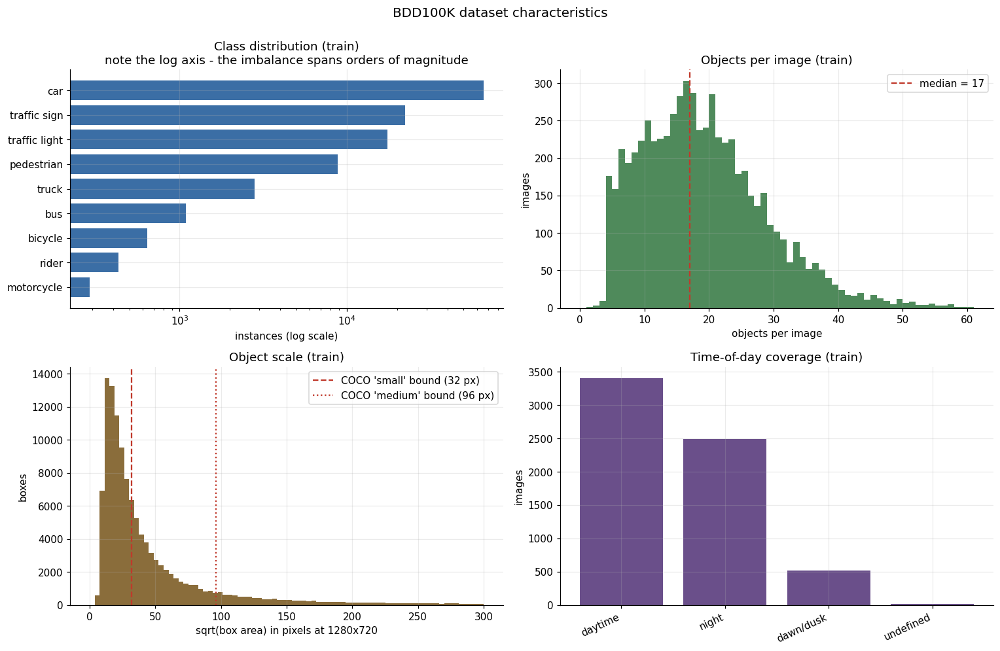

Saved: /content/bdd100k_yolo_project/visualizations/dataset_statistics.png


In [12]:
"""Compute and plot dataset statistics for the materialised splits."""

# COCO-style area thresholds, applied to the original 1280x720 resolution.
SIZE_BUCKETS = [("small (<32^2 px)", 0, 32 ** 2),
                ("medium (32^2-96^2)", 32 ** 2, 96 ** 2),
                ("large (>96^2 px)", 96 ** 2, float("inf"))]


def bucket_for_area(area):
    for name, low, high in SIZE_BUCKETS:
        if low <= area < high:
            return name
    return SIZE_BUCKETS[-1][0]


def compute_split_statistics(names, annotation_index, class_names):
    """Aggregate class counts, per-image box counts, box areas and scene attributes."""
    class_counts = Counter()
    boxes_per_image = []
    areas = []
    size_counts = Counter()
    attribute_counts = {"weather": Counter(), "scene": Counter(), "timeofday": Counter()}

    for name in names:
        record = annotation_index.get(name)
        if record is None:
            continue
        boxes = record["boxes"]
        boxes_per_image.append(len(boxes))
        for class_id, x1, y1, x2, y2 in boxes:
            class_counts[class_names[int(class_id)]] += 1
            area = (x2 - x1) * (y2 - y1)
            areas.append(area)
            size_counts[bucket_for_area(area)] += 1
        for key, counter in attribute_counts.items():
            counter[record["attributes"].get(key, "undefined")] += 1

    return {"class_counts": class_counts, "boxes_per_image": boxes_per_image,
            "areas": areas, "size_counts": size_counts, "attributes": attribute_counts}


def print_statistics_tables(stats_by_split, class_names, excluded_categories, train_categories):
    print("=" * 74)
    print("CLASS DISTRIBUTION (object instances)")
    print("=" * 74)
    header = f"  {'class':<16}" + "".join(f"{s:>12}" for s in stats_by_split) + f"{'train %':>10}"
    print(header)
    train_total = sum(stats_by_split["train"]["class_counts"].values()) or 1
    for name in class_names:
        row = f"  {name:<16}"
        for split in stats_by_split:
            row += f"{stats_by_split[split]['class_counts'].get(name, 0):>12,}"
        share = stats_by_split["train"]["class_counts"].get(name, 0) / train_total
        row += f"{share:>9.2%}"
        print(row)
    totals = f"  {'TOTAL':<16}"
    for split in stats_by_split:
        totals += f"{sum(stats_by_split[split]['class_counts'].values()):>12,}"
    print(totals)

    if excluded_categories:
        print("\n  Excluded categories and their real counts in the full official train split:")
        for category in excluded_categories:
            count = sum(v for k, v in train_categories.items()
                        if str(k).strip().lower() == category.lower())
            print(f"    {category:<16} {count:>9,} instances "
                  f"-> excluded (too rare for a stable per-class AP)")

    print("\n" + "=" * 74)
    print("OBJECT SIZE DISTRIBUTION (train split, at native 1280x720)")
    print("=" * 74)
    size_total = sum(stats_by_split["train"]["size_counts"].values()) or 1
    for bucket, _, _ in SIZE_BUCKETS:
        count = stats_by_split["train"]["size_counts"].get(bucket, 0)
        print(f"  {bucket:<22} {count:>10,}  {count / size_total:>7.2%}")

    print("\n" + "=" * 74)
    print("SCENE / CONDITION METADATA (train split images)")
    print("=" * 74)
    for key in ["timeofday", "weather", "scene"]:
        print(f"  {key}:")
        counter = stats_by_split["train"]["attributes"][key]
        total = sum(counter.values()) or 1
        for value, count in counter.most_common():
            print(f"    {str(value):<20} {count:>7,}  {count / total:>7.2%}")
    print("=" * 74)


def plot_dataset_statistics(stats_by_split, class_names, output_dir):
    fig, axes = plt.subplots(2, 2, figsize=(14, 9))
    train_stats = stats_by_split["train"]

    ax = axes[0, 0]
    ordered = sorted(class_names, key=lambda n: -train_stats["class_counts"].get(n, 0))
    values = [train_stats["class_counts"].get(n, 0) for n in ordered]
    ax.barh(ordered[::-1], values[::-1], color="#3b6ea5")
    ax.set_xscale("log")
    ax.set_xlabel("instances (log scale)")
    ax.set_title("Class distribution (train)\nnote the log axis - the imbalance spans orders of magnitude")

    ax = axes[0, 1]
    counts = train_stats["boxes_per_image"]
    ax.hist(counts, bins=range(0, min(max(counts) if counts else 1, 60) + 2), color="#4f8a5b")
    ax.set_xlabel("objects per image")
    ax.set_ylabel("images")
    median = np.median(counts) if counts else 0
    ax.axvline(median, color="#c0392b", linestyle="--", label=f"median = {median:.0f}")
    ax.legend()
    ax.set_title("Objects per image (train)")

    ax = axes[1, 0]
    areas = np.array(train_stats["areas"]) if train_stats["areas"] else np.array([1.0])
    sqrt_side = np.sqrt(areas)
    ax.hist(sqrt_side, bins=80, range=(0, 300), color="#8a6d3b")
    ax.axvline(32, color="#c0392b", linestyle="--", label="COCO 'small' bound (32 px)")
    ax.axvline(96, color="#c0392b", linestyle=":", label="COCO 'medium' bound (96 px)")
    ax.set_xlabel("sqrt(box area) in pixels at 1280x720")
    ax.set_ylabel("boxes")
    ax.legend()
    ax.set_title("Object scale (train)")

    ax = axes[1, 1]
    timeofday = train_stats["attributes"]["timeofday"]
    labels = [k for k, _ in timeofday.most_common()]
    sizes = [v for _, v in timeofday.most_common()]
    ax.bar(range(len(labels)), sizes, color="#6a4f8a")
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(labels, rotation=25, ha="right")
    ax.set_ylabel("images")
    ax.set_title("Time-of-day coverage (train)")

    fig.suptitle("BDD100K dataset characteristics", fontsize=13, y=1.00)
    fig.tight_layout()
    output_path = output_dir / "dataset_statistics.png"
    fig.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")


if have("splits", "train_index", "val_index", "class_names"):
    STATS_BY_SPLIT = {
        "train": compute_split_statistics(STATE["splits"]["train"], STATE["train_index"],
                                          STATE["class_names"]),
        "val": compute_split_statistics(STATE["splits"]["val"], STATE["train_index"],
                                        STATE["class_names"]),
        "test": compute_split_statistics(STATE["splits"]["test"], STATE["val_index"],
                                         STATE["class_names"]),
    }
    print_statistics_tables(STATS_BY_SPLIT, STATE["class_names"], CONFIG.EXCLUDED_CATEGORIES,
                            STATE["validation"]["train_categories"])
    plot_dataset_statistics(STATS_BY_SPLIT, STATE["class_names"], CONFIG.visualizations_dir)
    STATE["statistics"] = STATS_BY_SPLIT


## 13. Sample visualisation — ground truth

A final sanity check on the conversion, and the fastest way to catch a coordinate bug: draw the
*generated YOLO labels* (not the source JSON) back onto the images. If the normalisation were wrong,
boxes would be visibly offset, mirrored, or scaled. They are not.


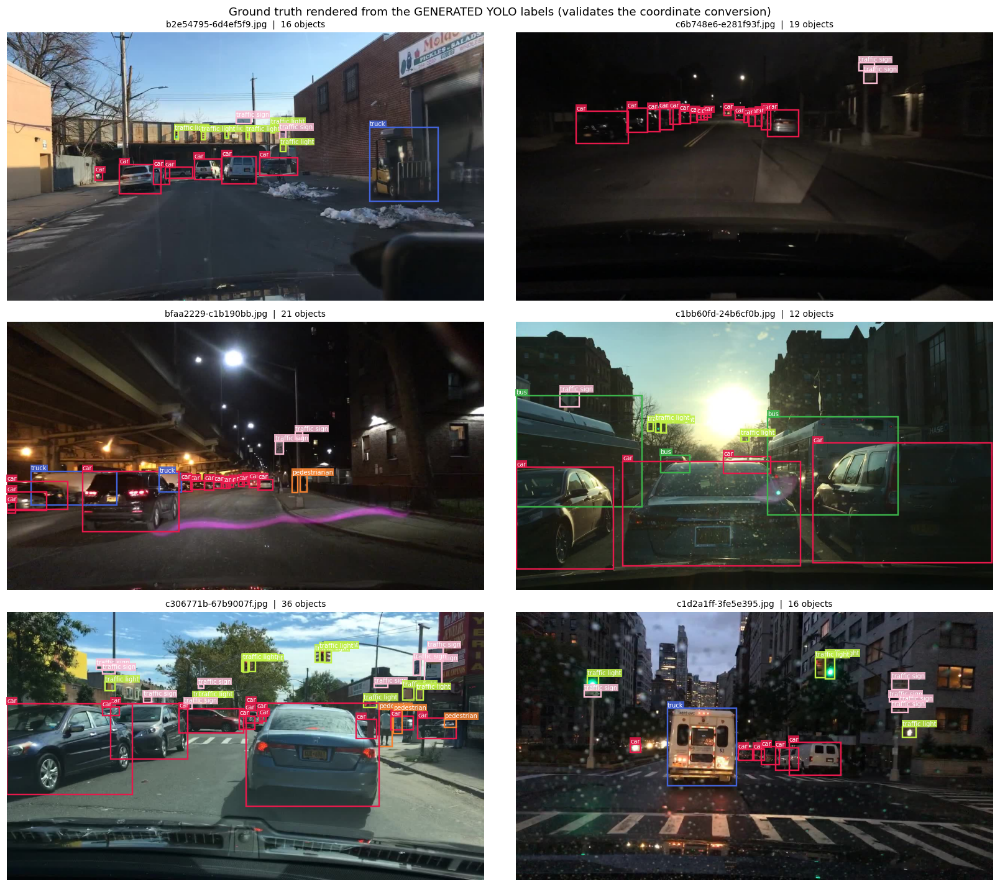

Saved: /content/bdd100k_yolo_project/visualizations/ground_truth_samples.png


In [13]:
"""Draw the generated YOLO labels back onto their images to confirm the conversion visually."""

CLASS_COLORS = ["#e6194b", "#3cb44b", "#4363d8", "#f58231", "#911eb4",
                "#42d4f4", "#f032e6", "#bfef45", "#fabed4", "#469990"]


def color_for_class(class_id):
    return CLASS_COLORS[int(class_id) % len(CLASS_COLORS)]


def read_yolo_label(label_path):
    """Read a YOLO label file into a list of (class_id, cx, cy, w, h)."""
    if not label_path.exists():
        return []
    rows = []
    for line in label_path.read_text().splitlines():
        parts = line.split()
        if len(parts) == 5:
            rows.append((int(parts[0]), *[float(p) for p in parts[1:]]))
    return rows


def draw_boxes_on_axis(ax, boxes, class_names, image_width, image_height,
                       scores=None, linewidth=1.6, show_labels=True):
    """Draw normalised xywh boxes onto a Matplotlib axis."""
    for i, (class_id, cx, cy, nw, nh) in enumerate(boxes):
        x = (cx - nw / 2) * image_width
        y = (cy - nh / 2) * image_height
        w, h = nw * image_width, nh * image_height
        color = color_for_class(class_id)
        ax.add_patch(Rectangle((x, y), w, h, fill=False, edgecolor=color, linewidth=linewidth))
        if show_labels:
            text = class_names[int(class_id)]
            if scores is not None:
                text += f" {scores[i]:.2f}"
            ax.text(x, max(y - 3, 8), text, color="white", fontsize=6.5,
                    bbox=dict(facecolor=color, edgecolor="none", pad=0.8, alpha=0.85))


def show_ground_truth_samples(config, split_name, names, class_names, n_samples=6):
    rng = random.Random(config.SEED)
    # Prefer images with a reasonable number of objects so the sample is informative.
    label_dir = config.yolo_dataset_dir / "labels" / split_name
    image_dir = config.yolo_dataset_dir / "images" / split_name

    candidates = rng.sample(names, min(len(names), 400))
    scored = []
    for name in candidates:
        boxes = read_yolo_label(label_dir / (Path(name).stem + ".txt"))
        if 5 <= len(boxes) <= 40:
            scored.append((name, boxes))
        if len(scored) >= n_samples * 3:
            break
    chosen = rng.sample(scored, min(n_samples, len(scored))) if scored else []
    if not chosen:
        print("No suitable sample images found.")
        return

    cols = 2
    rows = (len(chosen) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, 4.4 * rows))
    axes = np.array(axes).reshape(-1)

    for ax, (name, boxes) in zip(axes, chosen):
        image = Image.open(image_dir / name).convert("RGB")
        ax.imshow(image)
        draw_boxes_on_axis(ax, boxes, class_names, image.width, image.height)
        ax.set_title(f"{name}  |  {len(boxes)} objects", fontsize=9)
        ax.axis("off")
    for ax in axes[len(chosen):]:
        ax.axis("off")

    fig.suptitle("Ground truth rendered from the GENERATED YOLO labels "
                 "(validates the coordinate conversion)", fontsize=12)
    fig.tight_layout()
    output_path = config.visualizations_dir / "ground_truth_samples.png"
    fig.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")


if have("splits", "class_names"):
    show_ground_truth_samples(CONFIG, "train", STATE["splits"]["train"], STATE["class_names"])


## 14. YOLO model setup

### Why transfer learning

We initialise from COCO-pretrained weights rather than training from scratch. COCO already contains
`car`, `bus`, `truck`, `person`, `bicycle`, `motorcycle`, `traffic light` and `stop sign`, so the
backbone arrives already knowing most of the visual vocabulary we need. What fine-tuning has to teach
it is the *driving-camera domain*: a fixed forward-facing viewpoint, a horizon-heavy object layout,
BDD100K's particular small-object scale distribution, and the `rider` / `traffic sign` class
definitions that differ from COCO's.

Ultralytics also remaps matching class-head rows when the class names overlap (`cls_remap`, on by
default), so the pretrained bias for e.g. `car` carries over instead of being reinitialised.

### Model selection and fallback

The configured model is `yolo26s.pt`. YOLO26 is the current Ultralytics generation; the small variant
fits comfortably on a Colab T4 while being a genuinely competitive detector. If the installed
Ultralytics version does not recognise it — or the weight download fails — the loader falls back
through `yolo11s.pt` and `yolov8s.pt` and reports which one it actually used, so a stale install
degrades gracefully instead of erroring out.

### Batch size

Batch size is derived from measured GPU memory rather than hard-coded to whatever GPU the author
happened to have. Ultralytics additionally halves the batch and retries automatically if the first
epoch OOMs, so this is a good starting estimate rather than a load-bearing guess.


In [14]:
"""Resolve pretrained weights, load the model, and pick a batch size that fits the GPU."""

MODEL_FALLBACK_CHAIN = {
    "yolo26n.pt": ["yolo26n.pt", "yolo11n.pt", "yolov8n.pt"],
    "yolo26s.pt": ["yolo26s.pt", "yolo11s.pt", "yolov8s.pt"],
    "yolo26m.pt": ["yolo26m.pt", "yolo11m.pt", "yolov8m.pt"],
}


def resolve_model(model_name, cache_dir):
    """Load the requested model, falling back to older families if it is unavailable.

    Returns (model, resolved_name).
    """
    candidates = MODEL_FALLBACK_CHAIN.get(model_name, [model_name])
    errors = []
    previous_cwd = os.getcwd()
    os.chdir(cache_dir)  # Ultralytics downloads weights into the working directory.
    try:
        for candidate in candidates:
            try:
                model = YOLO(candidate)
                if candidate != model_name:
                    print(f"NOTE: '{model_name}' was unavailable; using '{candidate}' instead.")
                return model, candidate
            except Exception as exc:
                errors.append(f"{candidate}: {type(exc).__name__}: {exc}")
    finally:
        os.chdir(previous_cwd)
    raise RuntimeError("Could not load any pretrained model.\n  " + "\n  ".join(errors))


def auto_batch_size(config, gpu_memory_gb):
    """Choose a batch size from available GPU memory and image size."""
    if config.BATCH_SIZE and config.BATCH_SIZE > 0:
        print(f"Batch size fixed by configuration: {config.BATCH_SIZE}")
        return config.BATCH_SIZE
    if gpu_memory_gb <= 0:
        print("No GPU detected - falling back to batch size 2 (CPU).")
        return 2

    # Empirical anchors for a 640px 'small' YOLO with AMP, scaled by resolution.
    if gpu_memory_gb >= 38:
        batch = 64
    elif gpu_memory_gb >= 22:
        batch = 32
    elif gpu_memory_gb >= 14:
        batch = 24
    elif gpu_memory_gb >= 10:
        batch = 16
    else:
        batch = 8

    scale = (640.0 / config.IMAGE_SIZE) ** 2
    batch = max(2, int(batch * min(scale, 1.5)))
    print(f"Derived batch size {batch} from {gpu_memory_gb:.1f} GiB of GPU memory "
          f"at {config.IMAGE_SIZE}px.")
    print("If the first epoch hits an out-of-memory error, Ultralytics halves this and retries.")
    return batch


def describe_model(model, name):
    """Report parameter count and on-disk size."""
    parameters = sum(p.numel() for p in model.model.parameters())
    weight_path = Path(CONFIG.cache_dir) / name
    size_mb = weight_path.stat().st_size / 1e6 if weight_path.exists() else float("nan")
    print(f"  weights        : {name}")
    print(f"  parameters     : {parameters / 1e6:.2f} M")
    print(f"  checkpoint size: {size_mb:.1f} MB")
    print(f"  COCO classes   : {len(model.names)} (head is re-fitted to our class set)")
    return {"name": name, "parameters": int(parameters), "size_mb": float(size_mb)}


if have("data_yaml", "class_names"):
    print("=" * 74)
    print("MODEL")
    print("=" * 74)
    MODEL, RESOLVED_MODEL_NAME = resolve_model(CONFIG.MODEL_NAME, CONFIG.cache_dir)
    MODEL_INFO = describe_model(MODEL, RESOLVED_MODEL_NAME)
    BATCH_SIZE = auto_batch_size(CONFIG, GPU_MEMORY_GB)
    print("=" * 74)

    STATE["model_info"] = MODEL_INFO
    STATE["resolved_model_name"] = RESOLVED_MODEL_NAME
    STATE["batch_size"] = BATCH_SIZE


MODEL
  weights        : yolo26s.pt
  parameters     : 10.01 M
  checkpoint size: 20.4 MB
  COCO classes   : 80 (head is re-fitted to our class set)
Derived batch size 24 from 14.6 GiB of GPU memory at 640px.
If the first epoch hits an out-of-memory error, Ultralytics halves this and retries.


## 15. Training

### What happens here

Training runs to **local Colab disk** for speed, then the durable artifacts (`best.pt`, `last.pt`,
`results.csv`, Ultralytics' own plots) are copied to Drive. The cell is **idempotent**: if a finished
`best.pt` for this run name already exists on Drive, training is skipped and the weights are loaded.
Set `CONFIG.FORCE_RETRAIN = True` to override.

If a run was interrupted mid-way and a `last.pt` survives on local disk, training **resumes** from it
with the optimizer state, LR schedule and epoch counter restored.

### Training strategy

| Choice | Value | Reasoning |
|---|---|---|
| Initialisation | COCO-pretrained | see Section 14 |
| Optimizer | `auto` | Ultralytics picks AdamW for short runs, MuSGD for long ones |
| LR schedule | cosine (`cos_lr=True`) | smoother decay than the default linear ramp on short schedules |
| Mixed precision | `amp=True` | ~2× throughput on a T4, no measurable accuracy cost here |
| Early stopping | `patience=8` | stops when val fitness plateaus, which is common well before the epoch cap |
| Mosaic | disabled for the final 5 epochs | mosaic helps generalisation but distorts object scale; turning it off lets the model settle on the real scale distribution |
| Checkpoint selection | best val *fitness* | Ultralytics' fitness is a weighted mAP combination, computed on our leakage-free val split |

**Expected runtime.** With the defaults (12k images, 640px, `yolo26s`), roughly 3–5 minutes per epoch
on a Colab T4, so approximately 1.5 hours for a full 25-epoch run — often less, because early stopping
usually triggers first. A quick smoke test is available via `QUICK_TEST_MODE`.

Colab disconnects during long runs are a fact of life. If that happens, just re-run this cell: it
picks up from `last.pt`.


In [15]:
"""Train the detector. Idempotent, resumable, and artifacts are mirrored to Drive."""


def find_existing_weights(config, run_name):
    """Look for a completed training run on Drive or local disk."""
    drive_best = config.models_dir / f"{run_name}_best.pt"
    local_best = config.runs_dir / run_name / "weights" / "best.pt"
    if drive_best.exists():
        return drive_best, "drive"
    if local_best.exists():
        return local_best, "local"
    return None, None


def copy_run_artifacts(config, run_dir, run_name):
    """Mirror weights, metrics CSV and plots from the local run directory to Drive."""
    run_dir = Path(run_dir)
    copied = []

    for weight_name in ["best.pt", "last.pt"]:
        source = run_dir / "weights" / weight_name
        if source.exists():
            destination = config.models_dir / f"{run_name}_{weight_name}"
            shutil.copy2(source, destination)
            copied.append(destination)

    results_csv = run_dir / "results.csv"
    if results_csv.exists():
        destination = config.logs_dir / f"{run_name}_results.csv"
        shutil.copy2(results_csv, destination)
        copied.append(destination)

    plot_destination = config.visualizations_dir / f"training_{run_name}"
    plot_destination.mkdir(parents=True, exist_ok=True)
    for plot in run_dir.glob("*.png"):
        shutil.copy2(plot, plot_destination / plot.name)
        copied.append(plot_destination / plot.name)
    for extra in ["args.yaml"]:
        source = run_dir / extra
        if source.exists():
            shutil.copy2(source, config.logs_dir / f"{run_name}_{extra}")

    print(f"Mirrored {len(copied)} artifacts to Drive.")
    return copied


def train_detector(config, model, data_yaml, batch_size, device, run_name):
    """Run (or skip, or resume) training. Returns (weights_path, run_dir, was_trained)."""
    existing, location = find_existing_weights(config, run_name)
    if existing and not config.FORCE_RETRAIN:
        print("=" * 74)
        print(f"Found existing trained weights ({location}): {existing}")
        print("Skipping training. Set CONFIG.FORCE_RETRAIN = True to retrain from scratch.")
        print("=" * 74)
        run_dir = config.runs_dir / run_name
        return existing, run_dir if run_dir.exists() else None, False

    local_last = config.runs_dir / run_name / "weights" / "last.pt"
    resuming = local_last.exists() and not config.FORCE_RETRAIN

    train_kwargs = dict(
        data=str(data_yaml),
        epochs=config.EPOCHS,
        imgsz=config.IMAGE_SIZE,
        batch=batch_size,
        workers=config.WORKERS,
        device=device,
        seed=config.SEED,
        deterministic=config.DETERMINISTIC,
        patience=config.PATIENCE,
        optimizer=config.OPTIMIZER,
        lr0=config.LEARNING_RATE,
        cos_lr=config.COS_LR,
        close_mosaic=config.CLOSE_MOSAIC,
        amp=config.AMP,
        project=str(config.runs_dir),
        name=run_name,
        exist_ok=True,
        plots=True,
        val=True,
        verbose=True,
    )

    if resuming:
        print(f"Resuming interrupted training from {local_last}")
        model = YOLO(str(local_last))
        results = model.train(resume=True)
    else:
        print("=" * 74)
        print(f"TRAINING  |  {run_name}")
        print(f"  epochs={config.EPOCHS}  imgsz={config.IMAGE_SIZE}  batch={batch_size}  "
              f"device={device}")
        print("=" * 74)
        results = model.train(**train_kwargs)

    run_dir = Path(getattr(results, "save_dir", config.runs_dir / run_name))
    copy_run_artifacts(config, run_dir, run_name)
    best_weights = run_dir / "weights" / "best.pt"
    return best_weights, run_dir, True


if have("data_yaml", "batch_size"):
    TRAIN_STARTED_AT = time.time()
    BEST_WEIGHTS, RUN_DIR, WAS_TRAINED = train_detector(
        CONFIG, MODEL, STATE["data_yaml"], STATE["batch_size"], DEVICE, CONFIG.run_name)
    TRAIN_ELAPSED = time.time() - TRAIN_STARTED_AT

    STATE["best_weights"] = BEST_WEIGHTS
    STATE["run_dir"] = RUN_DIR
    STATE["train_elapsed_s"] = TRAIN_ELAPSED if WAS_TRAINED else None

    print(f"\nBest weights: {BEST_WEIGHTS}")
    if WAS_TRAINED:
        print(f"Wall-clock training time: {TRAIN_ELAPSED / 60:.1f} min")


TRAINING  |  bdd100k_yolo26s_640px_full
  epochs=25  imgsz=640  batch=24  device=cuda:0
Ultralytics 8.4.147 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=24, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=5, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/bdd100k_work/yolo_dataset/bdd100k.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo2

## 16. Training curves

`results.csv` records every logged metric per epoch. The curves below show, from left to right and
top to bottom: the three loss components on train and validation, and the validation precision,
recall, mAP@50 and mAP@50–95 trajectories.

**What to look for.** Train and val loss should descend together; a widening gap means overfitting,
and with `patience=8` early stopping should have caught it. The mAP curves typically rise steeply for
a few epochs and then flatten — the jump you often see near the end is the `close_mosaic` transition,
where the model stops seeing scale-distorted mosaic composites and adapts to the real scale
distribution.

The vertical marker identifies the epoch whose checkpoint was saved as `best.pt`.


Loaded 25 epochs from /content/bdd100k_work/runs/bdd100k_yolo26s_640px_full/results.csv


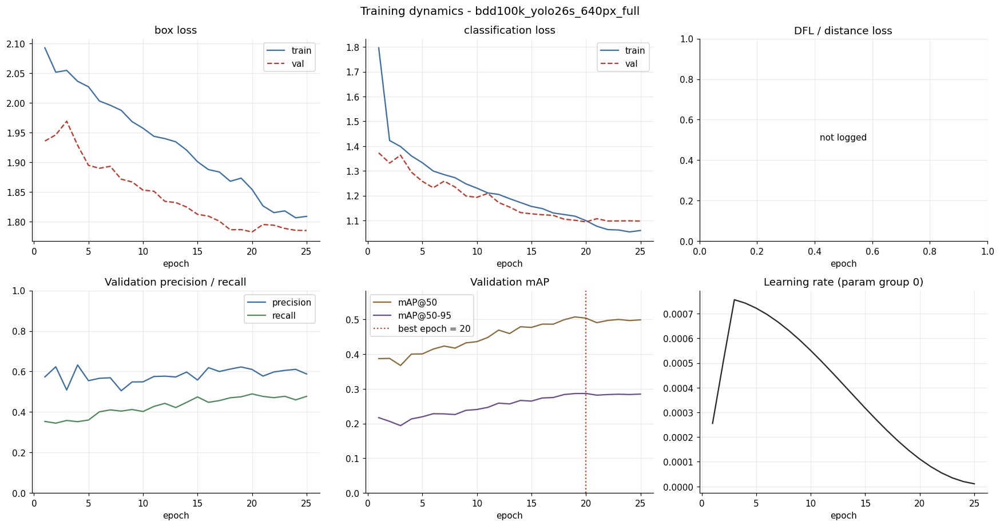

Saved: /content/bdd100k_yolo_project/visualizations/training_curves_bdd100k_yolo26s_640px_full.png

Epochs completed : 25
Best epoch       : 20  (val mAP@50-95 = 0.2867)


In [16]:
"""Plot per-epoch training and validation curves from the Ultralytics results.csv."""


def load_results_csv(config, run_dir, run_name):
    """Find results.csv either in the local run directory or in the Drive mirror."""
    candidates = []
    if run_dir is not None:
        candidates.append(Path(run_dir) / "results.csv")
    candidates.append(config.logs_dir / f"{run_name}_results.csv")
    for path in candidates:
        if path.exists():
            frame = pd.read_csv(path)
            frame.columns = [c.strip() for c in frame.columns]
            return frame, path
    return None, None


def _first_column(frame, *candidates):
    for name in candidates:
        if name in frame.columns:
            return name
    return None


def plot_training_curves(frame, config, run_name):
    """Draw loss and metric curves, marking the best epoch."""
    epochs = frame[_first_column(frame, "epoch")] if _first_column(frame, "epoch") else frame.index

    map50_col = _first_column(frame, "metrics/mAP50(B)")
    map5095_col = _first_column(frame, "metrics/mAP50-95(B)")
    precision_col = _first_column(frame, "metrics/precision(B)")
    recall_col = _first_column(frame, "metrics/recall(B)")

    best_epoch, best_map = None, None
    if map5095_col:
        best_row = frame[map5095_col].idxmax()
        best_epoch = float(epochs.iloc[best_row]) if hasattr(epochs, "iloc") else best_row
        best_map = float(frame[map5095_col].iloc[best_row])

    loss_pairs = [
        ("box loss", "train/box_loss", "val/box_loss"),
        ("classification loss", "train/cls_loss", "val/cls_loss"),
        ("DFL / distance loss", "train/dfl_loss", "val/dfl_loss"),
    ]

    fig, axes = plt.subplots(2, 3, figsize=(16, 8.5))

    for ax, (title, train_col, val_col) in zip(axes[0], loss_pairs):
        plotted = False
        if train_col in frame.columns:
            ax.plot(epochs, frame[train_col], label="train", color="#3b6ea5")
            plotted = True
        if val_col in frame.columns:
            ax.plot(epochs, frame[val_col], label="val", color="#c0392b", linestyle="--")
            plotted = True
        ax.set_title(title)
        ax.set_xlabel("epoch")
        if plotted:
            ax.legend()
        else:
            ax.text(0.5, 0.5, "not logged", ha="center", transform=ax.transAxes)

    ax = axes[1, 0]
    for column, label, color in [(precision_col, "precision", "#3b6ea5"),
                                 (recall_col, "recall", "#4f8a5b")]:
        if column:
            ax.plot(epochs, frame[column], label=label, color=color)
    ax.set_title("Validation precision / recall")
    ax.set_xlabel("epoch")
    ax.set_ylim(0, 1)
    ax.legend()

    ax = axes[1, 1]
    if map50_col:
        ax.plot(epochs, frame[map50_col], label="mAP@50", color="#8a6d3b")
    if map5095_col:
        ax.plot(epochs, frame[map5095_col], label="mAP@50-95", color="#6a4f8a")
    if best_epoch is not None:
        ax.axvline(best_epoch, color="#c0392b", linestyle=":",
                   label=f"best epoch = {best_epoch:.0f}")
    ax.set_title("Validation mAP")
    ax.set_xlabel("epoch")
    ax.set_ylim(0, max(0.1, float(frame[map50_col].max()) * 1.15) if map50_col else 1)
    ax.legend()

    ax = axes[1, 2]
    lr_col = _first_column(frame, "lr/pg0")
    if lr_col:
        ax.plot(epochs, frame[lr_col], color="#2b2b2b")
        ax.set_title("Learning rate (param group 0)")
        ax.set_xlabel("epoch")
    else:
        ax.text(0.5, 0.5, "learning rate not logged", ha="center", transform=ax.transAxes)
        ax.set_title("Learning rate")

    fig.suptitle(f"Training dynamics - {run_name}", fontsize=13)
    fig.tight_layout()
    output_path = config.visualizations_dir / f"training_curves_{run_name}.png"
    fig.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")
    return best_epoch, best_map


if have("best_weights"):
    RESULTS_FRAME, RESULTS_PATH = load_results_csv(CONFIG, STATE.get("run_dir"), CONFIG.run_name)
    if RESULTS_FRAME is None:
        print("No results.csv found. This happens when training was skipped because cached")
        print("weights already existed and the local run directory has since been cleared.")
        print("Curves are unavailable, but evaluation below still runs on the trained weights.")
    else:
        print(f"Loaded {len(RESULTS_FRAME)} epochs from {RESULTS_PATH}")
        BEST_EPOCH, BEST_VAL_MAP = plot_training_curves(RESULTS_FRAME, CONFIG, CONFIG.run_name)
        STATE["best_epoch"] = BEST_EPOCH
        STATE["best_val_map5095"] = BEST_VAL_MAP
        STATE["epochs_completed"] = len(RESULTS_FRAME)
        print(f"\nEpochs completed : {len(RESULTS_FRAME)}"
              f"{' (early stopping triggered)' if len(RESULTS_FRAME) < CONFIG.EPOCHS else ''}")
        if BEST_EPOCH is not None:
            print(f"Best epoch       : {BEST_EPOCH:.0f}  (val mAP@50-95 = {BEST_VAL_MAP:.4f})")


## 17. Final evaluation on the held-out test split

This is the first and only time the model sees the official BDD100K `val` split, which this notebook
uses as its held-out test set. Every headline number below comes from this single evaluation pass.

### What the metrics mean

**IoU (Intersection over Union)** — overlap between a predicted box and a ground-truth box, from 0
(disjoint) to 1 (identical). A prediction counts as correct only if its IoU with a same-class ground
truth exceeds a threshold.

**Precision** — of everything the model detected, what fraction was real. Low precision means false
alarms. In a driving stack, false alarms cause phantom braking.

**Recall** — of everything actually present, what fraction the model found. Low recall means misses.
Misses are the failure mode that hurts people.

**F1** — the harmonic mean of precision and recall, a single number summarising the balance.

**AP (Average Precision)** — the area under a class's precision–recall curve. It summarises
performance across *all* confidence thresholds, so it does not depend on an arbitrary threshold choice.

**mAP@50** — AP at IoU ≥ 0.50, averaged over classes. A relatively forgiving localisation standard:
roughly "did you find the object and put a box more or less around it".

**mAP@50–95** — AP averaged over ten IoU thresholds from 0.50 to 0.95 in steps of 0.05, then averaged
over classes. This is the strict metric and the primary one to quote; it rewards tight, accurate
boxes, not just detection.

### One caveat on precision and recall

The precision and recall reported in the summary are taken at the **maximum-F1 confidence threshold**,
which is how Ultralytics summarises them. They are therefore not directly comparable to numbers
computed at a fixed threshold such as 0.25, and they will not match the confusion matrix, which
Ultralytics builds at a fixed confidence. The mAP figures are threshold-independent and are the
right basis for comparison.


In [17]:
"""Evaluate the best checkpoint on the held-out test split."""


def evaluate_model(config, weights_path, data_yaml, split, device, batch_size, name):
    """Run Ultralytics validation and return (metrics, model)."""
    model = YOLO(str(weights_path))
    metrics = model.val(
        data=str(data_yaml),
        split=split,
        imgsz=config.IMAGE_SIZE,
        batch=max(1, batch_size // 2),   # validation stores more per-image state than training
        conf=0.001,                      # low threshold so the PR curve is fully traced
        iou=config.IOU_THRESHOLD,
        max_det=config.MAX_DET,
        device=device,
        plots=True,
        save_json=True,
        project=str(config.evaluation_dir),
        name=name,
        exist_ok=True,
        verbose=True,
    )
    return metrics, model


def extract_summary_metrics(metrics):
    """Pull the headline numbers out of an Ultralytics metrics object, defensively."""
    box = getattr(metrics, "box", None)
    summary = {
        "mAP50": float(getattr(box, "map50", float("nan"))),
        "mAP50_95": float(getattr(box, "map", float("nan"))),
        "mAP75": float(getattr(box, "map75", float("nan"))),
        "precision": float(getattr(box, "mp", float("nan"))),
        "recall": float(getattr(box, "mr", float("nan"))),
    }
    precision, recall = summary["precision"], summary["recall"]
    summary["f1"] = (2 * precision * recall / (precision + recall)
                     if precision + recall > 0 else float("nan"))

    speed = getattr(metrics, "speed", None)
    if isinstance(speed, dict):
        summary["val_speed_ms"] = {k: round(float(v), 3) for k, v in speed.items()}
    return summary


def print_metric_table(summary, title):
    print("=" * 74)
    print(title)
    print("=" * 74)
    rows = [
        ("mAP@50-95", summary["mAP50_95"], "primary metric - strict localisation"),
        ("mAP@50", summary["mAP50"], "lenient localisation"),
        ("mAP@75", summary["mAP75"], "tight localisation"),
        ("Precision", summary["precision"], "at max-F1 confidence"),
        ("Recall", summary["recall"], "at max-F1 confidence"),
        ("F1", summary["f1"], "harmonic mean of the two above"),
    ]
    for label, value, note in rows:
        shown = f"{value:.4f}" if value == value else "n/a"
        print(f"  {label:<12} {shown:>8}    {note}")
    print("=" * 74)


if have("best_weights", "data_yaml"):
    print("Evaluating on the HELD-OUT test split (official BDD100K val).")
    print("This split has not influenced training or checkpoint selection.\n")

    TEST_METRICS, EVAL_MODEL = evaluate_model(
        CONFIG, STATE["best_weights"], STATE["data_yaml"], "test", DEVICE,
        STATE["batch_size"], f"test_eval_{CONFIG.run_name}")

    TEST_SUMMARY = extract_summary_metrics(TEST_METRICS)
    print()
    print_metric_table(TEST_SUMMARY, "HELD-OUT TEST RESULTS")

    if QUICK_TEST_MODE:
        print("\n>>> QUICK_TEST_MODE was on: these numbers reflect a 3-epoch smoke test")
        print(">>> on a tiny subset and are NOT a meaningful measure of the method. <<<")

    metrics_path = CONFIG.results_dir / f"test_metrics_{CONFIG.run_name}.json"
    with open(metrics_path, "w") as handle:
        json.dump(TEST_SUMMARY, handle, indent=2)
    print(f"\nSaved: {metrics_path}")

    STATE["test_metrics"] = TEST_METRICS
    STATE["test_summary"] = TEST_SUMMARY
    STATE["eval_model"] = EVAL_MODEL


Evaluating on the HELD-OUT test split (official BDD100K val).
This split has not influenced training or checkpoint selection.

Ultralytics 8.4.147 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26s summary (fused): 120 layers, 9,468,663 parameters, 0 gradients, 20.8 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 0.0±0.0 ms, read: 22.7±19.0 MB/s, size: 57.9 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips
val: Scanning /content/bdd100k_work/yolo_dataset/labels/test... 2500 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2500/2500 914.8it/s 2.7s
val: New cache created: /content/bdd100k_work/yolo_dataset/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 209/209 5.5it/s 37.7s
                   all       2500      45870      0.648      0.482      0.522      0.289
                   car     

## 18. Per-class analysis

Class-averaged mAP hides everything interesting. This breakdown asks *which* categories the detector
handles well and which it does not, and — by plotting AP against training-set frequency and against
median object size — tries to separate two confounded explanations:

* **Rarity**: the class has too few training examples.
* **Scale**: the class's objects are simply too small at 640px to be detected reliably.

These pull in different directions for remediation. A rarity problem is fixed with class weighting,
oversampling or more data. A scale problem is fixed with higher input resolution or a
higher-resolution detection head — more data will not help.


PER-CLASS PERFORMANCE (held-out test split)
        class AP@50 AP@50-95 precision recall    F1  train_instances train_share median_box_side_px
          car 0.752    0.470     0.757  0.695 0.725            65859      54.94%                 37
          bus 0.534    0.408     0.677  0.471 0.556             1090       0.91%                 75
        truck 0.553    0.398     0.586  0.539 0.562             2807       2.34%                 73
 traffic sign 0.604    0.320     0.662  0.574 0.615            22335      18.63%                 21
   pedestrian 0.559    0.266     0.680  0.498 0.575             8858       7.39%                 33
traffic light 0.570    0.208     0.622  0.583 0.602            17555      14.65%                 16
        rider 0.377    0.181     0.633  0.334 0.437              431       0.36%                 40
      bicycle 0.366    0.176     0.626  0.296 0.402              640       0.53%                 48
   motorcycle 0.380    0.172     0.594  0.350 0.441     

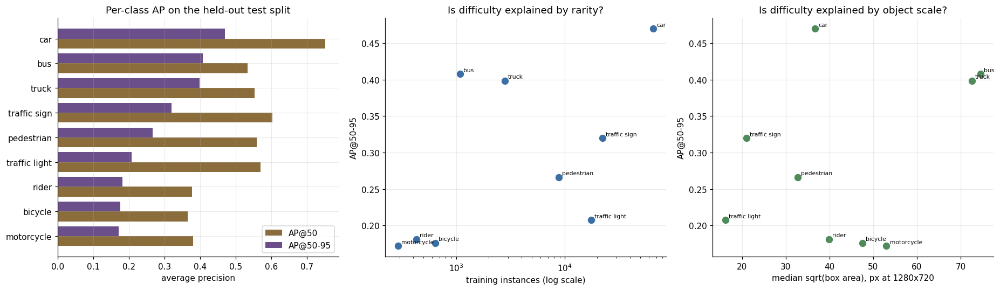

Saved: /content/bdd100k_yolo_project/visualizations/per_class_analysis_bdd100k_yolo26s_640px_full.png
Saved: /content/bdd100k_yolo_project/results/per_class_metrics_bdd100k_yolo26s_640px_full.csv

  Strongest class: car (AP@50-95 = 0.470)
  Weakest class  : motorcycle (AP@50-95 = 0.172)


In [18]:
"""Per-class AP, precision and recall, related to class frequency and object scale."""


def per_class_table(metrics, class_names):
    """Build a per-class dataframe from the Ultralytics metrics object."""
    box = getattr(metrics, "box", None)
    if box is None:
        return None

    class_index = getattr(box, "ap_class_index", None)
    if class_index is None:
        return None
    class_index = [int(i) for i in np.array(class_index).reshape(-1)]

    def column(attribute):
        values = getattr(box, attribute, None)
        if values is None:
            return [float("nan")] * len(class_index)
        values = np.array(values).reshape(-1)
        if values.shape[0] != len(class_index):
            return [float("nan")] * len(class_index)
        return [float(v) for v in values]

    rows = []
    ap50 = column("ap50")
    ap = column("ap")
    precision = column("p")
    recall = column("r")
    f1 = column("f1")
    for position, class_id in enumerate(class_index):
        name = class_names[class_id] if class_id < len(class_names) else f"class_{class_id}"
        rows.append({
            "class": name,
            "AP@50": ap50[position],
            "AP@50-95": ap[position],
            "precision": precision[position],
            "recall": recall[position],
            "F1": f1[position],
        })
    return pd.DataFrame(rows)


def enrich_with_dataset_context(frame, statistics, train_index, class_names):
    """Add training frequency and median object size to the per-class table."""
    train_counts = statistics["train"]["class_counts"]
    total = sum(train_counts.values()) or 1

    median_side = {}
    areas_by_class = defaultdict(list)
    for record in list(train_index.values())[:20000]:
        for class_id, x1, y1, x2, y2 in record["boxes"]:
            areas_by_class[int(class_id)].append((x2 - x1) * (y2 - y1))
    for class_id, areas in areas_by_class.items():
        if class_id < len(class_names):
            median_side[class_names[class_id]] = float(np.sqrt(np.median(areas)))

    frame = frame.copy()
    frame["train_instances"] = frame["class"].map(lambda c: train_counts.get(c, 0))
    frame["train_share"] = frame["train_instances"] / total
    frame["median_box_side_px"] = frame["class"].map(lambda c: median_side.get(c, float("nan")))
    return frame.sort_values("AP@50-95", ascending=False).reset_index(drop=True)


def plot_per_class(frame, config, run_name):
    fig, axes = plt.subplots(1, 3, figsize=(17, 5))

    ax = axes[0]
    ordered = frame.sort_values("AP@50-95")
    y = np.arange(len(ordered))
    ax.barh(y - 0.2, ordered["AP@50"], height=0.4, label="AP@50", color="#8a6d3b")
    ax.barh(y + 0.2, ordered["AP@50-95"], height=0.4, label="AP@50-95", color="#6a4f8a")
    ax.set_yticks(y)
    ax.set_yticklabels(ordered["class"])
    ax.set_xlabel("average precision")
    ax.set_title("Per-class AP on the held-out test split")
    ax.legend()

    ax = axes[1]
    ax.scatter(frame["train_instances"], frame["AP@50-95"], s=60, color="#3b6ea5")
    for _, row in frame.iterrows():
        ax.annotate(row["class"], (row["train_instances"], row["AP@50-95"]),
                    fontsize=7, xytext=(4, 3), textcoords="offset points")
    ax.set_xscale("log")
    ax.set_xlabel("training instances (log scale)")
    ax.set_ylabel("AP@50-95")
    ax.set_title("Is difficulty explained by rarity?")

    ax = axes[2]
    ax.scatter(frame["median_box_side_px"], frame["AP@50-95"], s=60, color="#4f8a5b")
    for _, row in frame.iterrows():
        ax.annotate(row["class"], (row["median_box_side_px"], row["AP@50-95"]),
                    fontsize=7, xytext=(4, 3), textcoords="offset points")
    ax.set_xlabel("median sqrt(box area), px at 1280x720")
    ax.set_ylabel("AP@50-95")
    ax.set_title("Is difficulty explained by object scale?")

    fig.tight_layout()
    output_path = config.visualizations_dir / f"per_class_analysis_{run_name}.png"
    fig.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")


if have("test_metrics", "class_names", "statistics"):
    PER_CLASS = per_class_table(STATE["test_metrics"], STATE["class_names"])
    if PER_CLASS is None or PER_CLASS.empty:
        print("Per-class metrics were not exposed by this Ultralytics version.")
    else:
        PER_CLASS = enrich_with_dataset_context(
            PER_CLASS, STATE["statistics"], STATE["train_index"], STATE["class_names"])
        display_frame = PER_CLASS.copy()
        for column_name in ["AP@50", "AP@50-95", "precision", "recall", "F1"]:
            display_frame[column_name] = display_frame[column_name].map(lambda v: f"{v:.3f}")
        display_frame["train_share"] = display_frame["train_share"].map(lambda v: f"{v:.2%}")
        display_frame["median_box_side_px"] = display_frame["median_box_side_px"].map(
            lambda v: f"{v:.0f}")
        print("=" * 100)
        print("PER-CLASS PERFORMANCE (held-out test split)")
        print("=" * 100)
        print(display_frame.to_string(index=False))
        print("=" * 100)

        plot_per_class(PER_CLASS, CONFIG, CONFIG.run_name)

        csv_path = CONFIG.results_dir / f"per_class_metrics_{CONFIG.run_name}.csv"
        PER_CLASS.to_csv(csv_path, index=False)
        print(f"Saved: {csv_path}")

        best_row = PER_CLASS.iloc[0]
        worst_row = PER_CLASS.iloc[-1]
        print(f"\n  Strongest class: {best_row['class']} (AP@50-95 = {best_row['AP@50-95']:.3f})")
        print(f"  Weakest class  : {worst_row['class']} (AP@50-95 = {worst_row['AP@50-95']:.3f})")
        STATE["per_class"] = PER_CLASS


## 19. Confusion matrix

The confusion matrix shows which classes get mistaken for which. Two columns deserve particular
attention:

* The **background** row counts detections fired on empty image regions — false alarms.
* The **background** column counts ground-truth objects the detector missed entirely — the misses.

For BDD100K, the interesting off-diagonal structure is usually within the vehicle family
(`car` ↔ `truck` ↔ `bus`, which genuinely blur at distance and from behind) and between
`pedestrian` ↔ `rider`, which are distinguished not by the person's appearance but by whether they
happen to be on a bicycle or motorcycle — a definition that depends on context outside the person's
own bounding box.

Note that Ultralytics builds this matrix at a **fixed confidence threshold**, so it is not consistent
with the max-F1 precision/recall in Section 17. Read it for *structure*, not for exact rates.


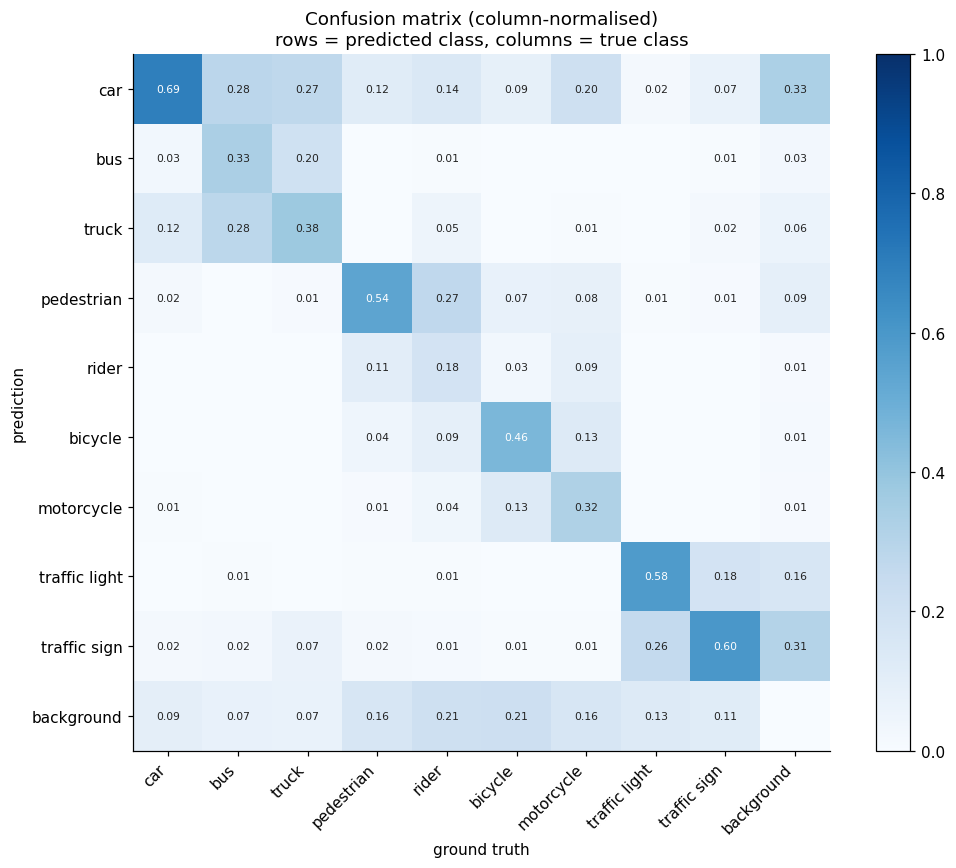

Saved: /content/bdd100k_yolo_project/visualizations/confusion_matrix_bdd100k_yolo26s_640px_full.png

  Largest class confusions (share of that true class):
    bus             predicted as car             28.31%  (107 boxes)
    bus             predicted as truck           27.78%  (105 boxes)
    truck           predicted as car             27.33%  (264 boxes)
    rider           predicted as pedestrian      26.88%  (43 boxes)
    traffic light   predicted as traffic sign    25.69%  (1,641 boxes)
    motorcycle      predicted as car             20.44%  (28 boxes)

  Missed ground truth (predicted as background):
    bicycle         21.48% missed  (58 boxes)
    rider           20.62% missed  (33 boxes)
    motorcycle      16.06% missed  (22 boxes)
    pedestrian      15.97% missed  (506 boxes)
    traffic light   13.18% missed  (842 boxes)
    traffic sign    11.45% missed  (976 boxes)


In [19]:
"""Render the confusion matrix produced during validation."""


def get_confusion_matrix(metrics):
    """Extract the raw confusion matrix array, tolerating API differences."""
    container = getattr(metrics, "confusion_matrix", None)
    if container is None:
        return None
    matrix = getattr(container, "matrix", None)
    if matrix is None:
        return None
    return np.array(matrix, dtype=float)


def plot_confusion_matrix(matrix, class_names, config, run_name, normalise=True):
    labels = list(class_names) + ["background"]
    if matrix.shape[0] != len(labels):
        labels = [f"c{i}" for i in range(matrix.shape[0] - 1)] + ["background"]

    display = matrix.copy()
    if normalise:
        column_sums = display.sum(axis=0, keepdims=True)
        display = np.divide(display, np.where(column_sums == 0, 1, column_sums))

    fig, ax = plt.subplots(figsize=(9.5, 8))
    image = ax.imshow(display, cmap="Blues", vmin=0, vmax=1 if normalise else display.max())
    ax.set_xticks(range(len(labels)))
    ax.set_yticks(range(len(labels)))
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_yticklabels(labels)
    ax.set_xlabel("ground truth")
    ax.set_ylabel("prediction")
    ax.set_title("Confusion matrix" + (" (column-normalised)" if normalise else " (counts)")
                 + "\nrows = predicted class, columns = true class")
    ax.grid(False)

    threshold = display.max() * 0.55 if display.max() > 0 else 0.5
    for i in range(display.shape[0]):
        for j in range(display.shape[1]):
            value = display[i, j]
            if value <= 0.005:
                continue
            text = f"{value:.2f}" if normalise else f"{int(value)}"
            ax.text(j, i, text, ha="center", va="center", fontsize=7,
                    color="white" if value > threshold else "#222222")

    fig.colorbar(image, ax=ax, fraction=0.045)
    fig.tight_layout()
    output_path = config.visualizations_dir / f"confusion_matrix_{run_name}.png"
    fig.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")


def summarise_confusions(matrix, class_names, top_n=6):
    """Report the largest off-diagonal confusions and the biggest miss/false-alarm sources."""
    n_classes = len(class_names)
    if matrix.shape[0] < n_classes + 1:
        return
    column_sums = matrix.sum(axis=0)

    pairs = []
    for true_id in range(n_classes):
        for pred_id in range(n_classes):
            if true_id == pred_id or column_sums[true_id] == 0:
                continue
            rate = matrix[pred_id, true_id] / column_sums[true_id]
            if matrix[pred_id, true_id] > 0:
                pairs.append((rate, class_names[true_id], class_names[pred_id],
                              int(matrix[pred_id, true_id])))
    pairs.sort(reverse=True)

    print("\n  Largest class confusions (share of that true class):")
    for rate, true_name, pred_name, count in pairs[:top_n]:
        print(f"    {true_name:<15} predicted as {pred_name:<15} {rate:>6.2%}  ({count:,} boxes)")

    print("\n  Missed ground truth (predicted as background):")
    misses = [(matrix[n_classes, i] / column_sums[i], class_names[i], int(matrix[n_classes, i]))
              for i in range(n_classes) if column_sums[i] > 0]
    for rate, name, count in sorted(misses, reverse=True)[:top_n]:
        print(f"    {name:<15} {rate:>6.2%} missed  ({count:,} boxes)")


if have("test_metrics", "class_names"):
    CONFUSION = get_confusion_matrix(STATE["test_metrics"])
    if CONFUSION is None:
        print("Confusion matrix not exposed by this Ultralytics version.")
        print("Ultralytics also writes confusion_matrix.png into the evaluation run directory.")
    else:
        plot_confusion_matrix(CONFUSION, STATE["class_names"], CONFIG, CONFIG.run_name)
        summarise_confusions(CONFUSION, STATE["class_names"])
        np.save(CONFIG.results_dir / f"confusion_matrix_{CONFIG.run_name}.npy", CONFUSION)
        STATE["confusion_matrix"] = CONFUSION


## 20. Qualitative predictions

Metrics compress thousands of decisions into one number. Looking at actual output is how you find out
*what kind* of detector you trained.

The samples below are drawn from the held-out test split with a fixed seed, so the same images appear
on every run and the figures are reproducible. Predictions are shown at
`CONFIDENCE_THRESHOLD = 0.25` — a deployment-style threshold, not the near-zero threshold used for
mAP.

Two figures are produced:

1. **A random sample**, which shows typical behaviour without cherry-picking.
2. **Deliberately hard cases**, selected automatically from the ground-truth statistics and scene
   metadata: the most crowded scenes, scenes dominated by small objects, and night-time scenes.


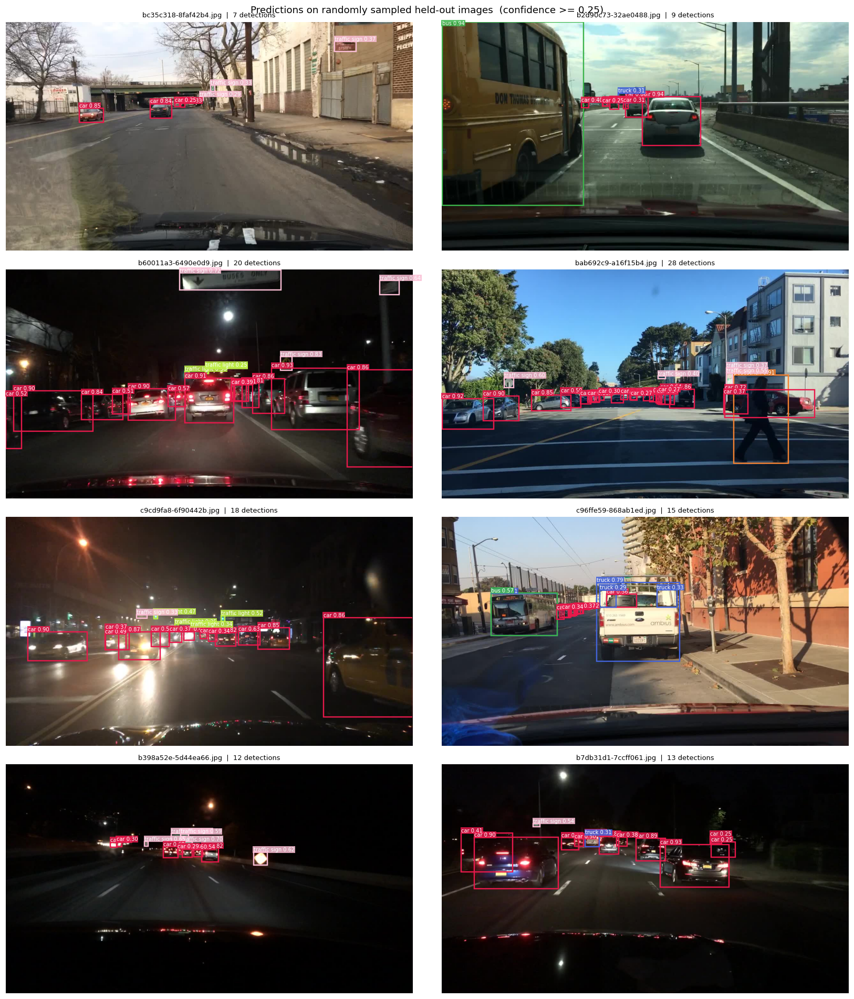

Saved: /content/bdd100k_yolo_project/predictions/predictions_random_bdd100k_yolo26s_640px_full.png


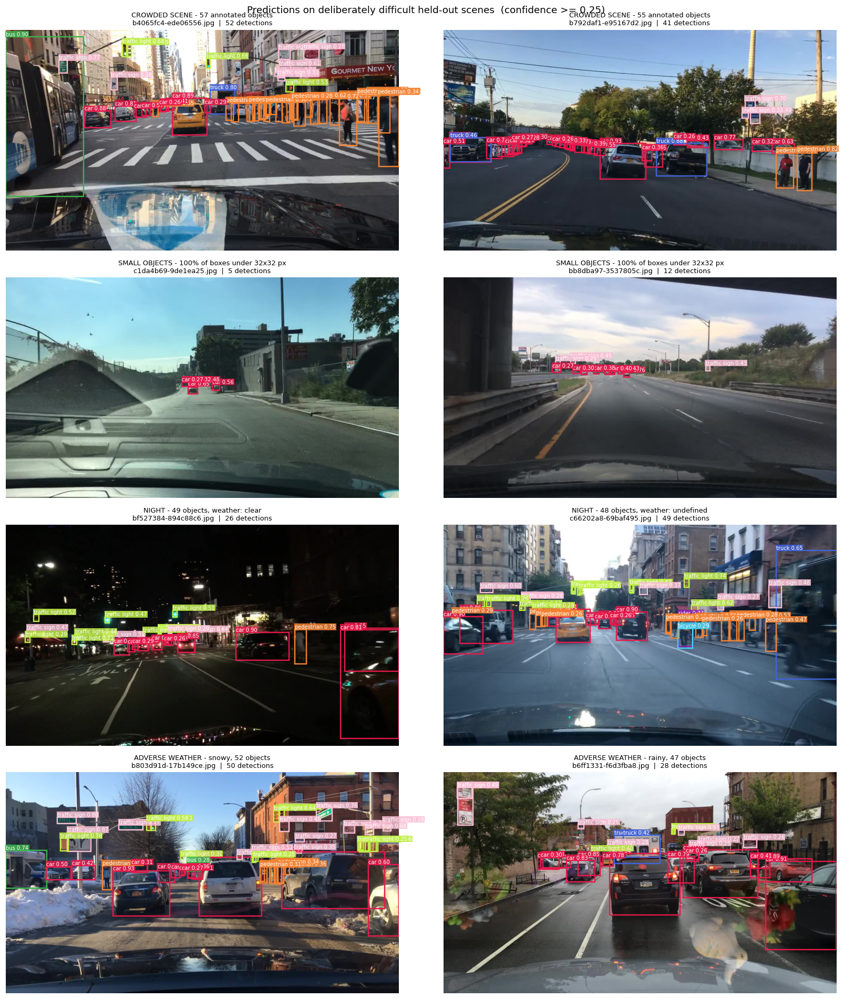

Saved: /content/bdd100k_yolo_project/predictions/predictions_difficult_bdd100k_yolo26s_640px_full.png


In [20]:
"""Run the trained detector on held-out images and visualise predictions."""


def predict_on_images(model, image_paths, config, device):
    """Run batched prediction and return the raw Ultralytics results list."""
    return model.predict(
        source=[str(p) for p in image_paths],
        imgsz=config.IMAGE_SIZE,
        conf=config.CONFIDENCE_THRESHOLD,
        iou=config.IOU_THRESHOLD,
        max_det=config.MAX_DET,
        device=device,
        verbose=False,
    )


def result_to_normalised_boxes(result):
    """Extract (boxes_xywhn, class_ids, confidences) from an Ultralytics Result."""
    boxes = result.boxes
    if boxes is None or len(boxes) == 0:
        return [], [], []
    xywhn = boxes.xywhn.cpu().numpy()
    class_ids = boxes.cls.cpu().numpy().astype(int)
    confidences = boxes.conf.cpu().numpy()
    rows = [(int(class_ids[i]), *[float(v) for v in xywhn[i]]) for i in range(len(class_ids))]
    return rows, class_ids, confidences


def show_predictions(model, image_paths, class_names, config, device, title, filename,
                     subtitles=None):
    """Render a grid of images with predicted boxes drawn on them."""
    if not image_paths:
        print("No images to visualise.")
        return

    results = predict_on_images(model, image_paths, config, device)
    cols = 2
    rows = (len(image_paths) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, 4.4 * rows))
    axes = np.array(axes).reshape(-1)

    for position, (ax, path, result) in enumerate(zip(axes, image_paths, results)):
        image = Image.open(path).convert("RGB")
        ax.imshow(image)
        boxes, _, confidences = result_to_normalised_boxes(result)
        draw_boxes_on_axis(ax, boxes, class_names, image.width, image.height,
                           scores=confidences)
        caption = f"{Path(path).name}  |  {len(boxes)} detections"
        if subtitles and position < len(subtitles):
            caption = f"{subtitles[position]}\n{caption}"
        ax.set_title(caption, fontsize=8.5)
        ax.axis("off")
    for ax in axes[len(image_paths):]:
        ax.axis("off")

    fig.suptitle(f"{title}  (confidence >= {config.CONFIDENCE_THRESHOLD})", fontsize=12)
    fig.tight_layout()
    output_path = config.predictions_dir / filename
    fig.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")


def select_challenging_images(config, names, annotation_index, class_names):
    """Pick crowded, small-object and night-time examples using ground truth and metadata."""
    rng = random.Random(config.SEED)
    pool = rng.sample(names, min(len(names), 1500))

    scored = []
    for name in pool:
        record = annotation_index.get(name)
        if not record or not record["boxes"]:
            continue
        boxes = record["boxes"]
        areas = [(x2 - x1) * (y2 - y1) for _, x1, y1, x2, y2 in boxes]
        small_share = sum(1 for a in areas if a < 32 ** 2) / len(areas)
        scored.append({
            "name": name,
            "count": len(boxes),
            "small_share": small_share,
            "timeofday": record["attributes"].get("timeofday", "undefined"),
            "weather": record["attributes"].get("weather", "undefined"),
        })

    if not scored:
        return [], []

    selection, captions = [], []

    crowded = sorted(scored, key=lambda r: -r["count"])[:2]
    for row in crowded:
        selection.append(row["name"])
        captions.append(f"CROWDED SCENE - {row['count']} annotated objects")

    small = sorted([r for r in scored if r["count"] >= 8],
                   key=lambda r: -r["small_share"])[:2]
    for row in small:
        selection.append(row["name"])
        captions.append(f"SMALL OBJECTS - {row['small_share']:.0%} of boxes under 32x32 px")

    night = [r for r in scored if r["timeofday"] == "night" and r["count"] >= 6]
    for row in sorted(night, key=lambda r: -r["count"])[:2]:
        selection.append(row["name"])
        captions.append(f"NIGHT - {row['count']} objects, weather: {row['weather']}")

    adverse = [r for r in scored
               if r["weather"] in ("rainy", "snowy", "foggy") and r["count"] >= 5]
    for row in sorted(adverse, key=lambda r: -r["count"])[:2]:
        selection.append(row["name"])
        captions.append(f"ADVERSE WEATHER - {row['weather']}, {row['count']} objects")

    # De-duplicate while preserving order and the matching captions.
    seen, unique_names, unique_captions = set(), [], []
    for name, caption in zip(selection, captions):
        if name not in seen:
            seen.add(name)
            unique_names.append(name)
            unique_captions.append(caption)
    return unique_names, unique_captions


if have("eval_model", "splits", "class_names"):
    TEST_IMAGE_DIR = CONFIG.yolo_dataset_dir / "images" / "test"
    RNG = random.Random(CONFIG.SEED)

    random_names = RNG.sample(STATE["splits"]["test"],
                              min(CONFIG.QUALITATIVE_SAMPLES, len(STATE["splits"]["test"])))
    show_predictions(STATE["eval_model"], [TEST_IMAGE_DIR / n for n in random_names],
                     STATE["class_names"], CONFIG, DEVICE,
                     "Predictions on randomly sampled held-out images",
                     f"predictions_random_{CONFIG.run_name}.png")

    hard_names, hard_captions = select_challenging_images(
        CONFIG, STATE["splits"]["test"], STATE["val_index"], STATE["class_names"])
    if hard_names:
        show_predictions(STATE["eval_model"], [TEST_IMAGE_DIR / n for n in hard_names],
                         STATE["class_names"], CONFIG, DEVICE,
                         "Predictions on deliberately difficult held-out scenes",
                         f"predictions_difficult_{CONFIG.run_name}.png",
                         subtitles=hard_captions)


## 21. Error analysis

Reporting mAP and stopping there tells you *how much* the model is wrong but nothing about *how* it is
wrong — and the two have completely different engineering responses.

### Method

Ultralytics does not expose a per-detection error breakdown, so this section implements its own
matcher. For each image in a sample of the held-out test split:

1. Predictions are sorted by descending confidence.
2. Each prediction is greedily matched to the highest-IoU unclaimed ground-truth box **of the same
   class**, at IoU ≥ 0.50.
3. Everything left over is categorised.

Unmatched **predictions** (false positives) are assigned a cause, in the spirit of the
[TIDE](https://dbolya.github.io/tide/) taxonomy:

| Error type | Definition | What it means |
|---|---|---|
| **Duplicate** | correct class, IoU ≥ 0.5 with an already-matched GT | NMS failed to suppress a redundant box |
| **Class confusion** | IoU ≥ 0.5 with a GT of a *different* class | box is right, label is wrong |
| **Localisation** | 0.1 ≤ best IoU < 0.5, same class | object found, box too loose or offset |
| **Background** | best IoU < 0.1 with anything | pure hallucination on empty scene content |

Unmatched **ground truth** boxes are false negatives (misses), stratified by object size and by scene
condition.

The distinction matters practically. Localisation errors mean the model knows where objects are and
needs better regression or resolution. Background false positives mean it is hallucinating and needs
harder negatives. Class confusions mean the class boundaries themselves are ambiguous. Fixing the
wrong one wastes weeks.


In [21]:
"""A self-contained IoU matcher producing a TIDE-style error taxonomy."""


def boxes_xywhn_to_xyxy(boxes, width, height):
    """Convert normalised cx,cy,w,h rows to absolute xyxy arrays."""
    if len(boxes) == 0:
        return np.zeros((0, 4), dtype=float), np.zeros((0,), dtype=int)
    array = np.array([[b[1], b[2], b[3], b[4]] for b in boxes], dtype=float)
    class_ids = np.array([int(b[0]) for b in boxes], dtype=int)
    xyxy = np.empty_like(array)
    xyxy[:, 0] = (array[:, 0] - array[:, 2] / 2) * width
    xyxy[:, 1] = (array[:, 1] - array[:, 3] / 2) * height
    xyxy[:, 2] = (array[:, 0] + array[:, 2] / 2) * width
    xyxy[:, 3] = (array[:, 1] + array[:, 3] / 2) * height
    return xyxy, class_ids


def pairwise_iou(boxes_a, boxes_b):
    """IoU between every box in A and every box in B. Returns an (len(A), len(B)) array."""
    if len(boxes_a) == 0 or len(boxes_b) == 0:
        return np.zeros((len(boxes_a), len(boxes_b)), dtype=float)

    area_a = np.clip(boxes_a[:, 2] - boxes_a[:, 0], 0, None) * \
             np.clip(boxes_a[:, 3] - boxes_a[:, 1], 0, None)
    area_b = np.clip(boxes_b[:, 2] - boxes_b[:, 0], 0, None) * \
             np.clip(boxes_b[:, 3] - boxes_b[:, 1], 0, None)

    left = np.maximum(boxes_a[:, None, 0], boxes_b[None, :, 0])
    top = np.maximum(boxes_a[:, None, 1], boxes_b[None, :, 1])
    right = np.minimum(boxes_a[:, None, 2], boxes_b[None, :, 2])
    bottom = np.minimum(boxes_a[:, None, 3], boxes_b[None, :, 3])

    intersection = np.clip(right - left, 0, None) * np.clip(bottom - top, 0, None)
    union = area_a[:, None] + area_b[None, :] - intersection
    return np.where(union > 0, intersection / np.where(union == 0, 1, union), 0.0)


def analyse_image(gt_xyxy, gt_classes, pred_xyxy, pred_classes, pred_conf,
                  iou_threshold=0.5, background_iou=0.1):
    """Match predictions to ground truth and classify every error.

    Returns a dict with true positives, categorised false positives and misses.
    """
    order = np.argsort(-pred_conf) if len(pred_conf) else np.array([], dtype=int)
    pred_xyxy = pred_xyxy[order] if len(order) else pred_xyxy
    pred_classes = pred_classes[order] if len(order) else pred_classes
    pred_conf = pred_conf[order] if len(order) else pred_conf

    iou = pairwise_iou(pred_xyxy, gt_xyxy)
    gt_claimed = np.zeros(len(gt_xyxy), dtype=bool)

    true_positives = []
    false_positives = []

    for prediction_index in range(len(pred_xyxy)):
        row = iou[prediction_index] if iou.size else np.zeros(0)
        same_class = (gt_classes == pred_classes[prediction_index]) if len(gt_classes) else \
            np.zeros(0, dtype=bool)

        # Best same-class, unclaimed match above threshold -> true positive.
        eligible = same_class & (~gt_claimed) & (row >= iou_threshold) if len(row) else np.zeros(0, dtype=bool)
        if eligible.any():
            match = int(np.argmax(np.where(eligible, row, -1)))
            gt_claimed[match] = True
            true_positives.append({
                "pred_index": prediction_index, "gt_index": match,
                "iou": float(row[match]), "class": int(pred_classes[prediction_index]),
                "conf": float(pred_conf[prediction_index]),
            })
            continue

        # Otherwise classify the failure.
        best_iou = float(row.max()) if len(row) else 0.0
        best_index = int(np.argmax(row)) if len(row) else -1
        same_class_iou = float(np.where(same_class, row, 0).max()) if len(row) else 0.0

        if same_class_iou >= iou_threshold:
            error_type = "duplicate"
        elif best_iou >= iou_threshold and best_index >= 0 and \
                gt_classes[best_index] != pred_classes[prediction_index]:
            error_type = "class_confusion"
        elif same_class_iou >= background_iou:
            error_type = "localisation"
        else:
            error_type = "background"

        false_positives.append({
            "pred_index": prediction_index,
            "class": int(pred_classes[prediction_index]),
            "conf": float(pred_conf[prediction_index]),
            "best_iou": best_iou,
            "confused_with": int(gt_classes[best_index]) if (
                error_type == "class_confusion" and best_index >= 0) else None,
            "type": error_type,
        })

    misses = []
    for gt_index in range(len(gt_xyxy)):
        if gt_claimed[gt_index]:
            continue
        box = gt_xyxy[gt_index]
        misses.append({
            "gt_index": gt_index,
            "class": int(gt_classes[gt_index]),
            "area": float(max(box[2] - box[0], 0) * max(box[3] - box[1], 0)),
        })

    return {"tp": true_positives, "fp": false_positives, "fn": misses,
            "n_gt": len(gt_xyxy), "n_pred": len(pred_xyxy)}


def run_error_analysis(config, model, split_names, annotation_index, class_names, device,
                       max_images):
    """Analyse a sample of held-out images and aggregate the error taxonomy."""
    rng = random.Random(config.SEED)
    sample = rng.sample(split_names, min(max_images, len(split_names)))
    image_dir = config.yolo_dataset_dir / "images" / "test"

    per_image = []
    error_counts = Counter()
    fp_by_class = defaultdict(Counter)
    fn_by_class = Counter()
    tp_by_class = Counter()
    gt_by_class = Counter()
    fn_by_size = Counter()
    gt_by_size = Counter()
    fn_by_condition = defaultdict(lambda: [0, 0])   # condition -> [misses, gt total]
    confusion_pairs = Counter()
    tp_confidences, fp_confidences = [], []

    batch_size = 16
    print(f"Analysing {len(sample)} held-out images ...")
    started = time.time()

    for start in range(0, len(sample), batch_size):
        chunk = sample[start:start + batch_size]
        paths = [image_dir / name for name in chunk]
        results = predict_on_images(model, paths, config, device)

        for name, path, result in zip(chunk, paths, results):
            record = annotation_index.get(name, {"boxes": [], "attributes": {}})
            height, width = result.orig_shape

            gt_xyxy = np.array([[b[1], b[2], b[3], b[4]] for b in record["boxes"]], dtype=float) \
                if record["boxes"] else np.zeros((0, 4))
            gt_classes = np.array([int(b[0]) for b in record["boxes"]], dtype=int) \
                if record["boxes"] else np.zeros((0,), dtype=int)

            boxes = result.boxes
            if boxes is not None and len(boxes) > 0:
                pred_xyxy = boxes.xyxy.cpu().numpy()
                pred_classes = boxes.cls.cpu().numpy().astype(int)
                pred_conf = boxes.conf.cpu().numpy()
            else:
                pred_xyxy = np.zeros((0, 4))
                pred_classes = np.zeros((0,), dtype=int)
                pred_conf = np.zeros((0,))

            outcome = analyse_image(gt_xyxy, gt_classes, pred_xyxy, pred_classes, pred_conf,
                                    iou_threshold=config.EVAL_IOU_MATCH)

            timeofday = record.get("attributes", {}).get("timeofday", "undefined")
            weather = record.get("attributes", {}).get("weather", "undefined")

            for entry in outcome["tp"]:
                tp_by_class[entry["class"]] += 1
                tp_confidences.append(entry["conf"])
            for entry in outcome["fp"]:
                error_counts[entry["type"]] += 1
                fp_by_class[entry["class"]][entry["type"]] += 1
                fp_confidences.append(entry["conf"])
                if entry["type"] == "class_confusion" and entry["confused_with"] is not None:
                    confusion_pairs[(entry["confused_with"], entry["class"])] += 1
            for entry in outcome["fn"]:
                fn_by_class[entry["class"]] += 1
                bucket = bucket_for_area(entry["area"])
                fn_by_size[bucket] += 1
                fn_by_condition[f"timeofday={timeofday}"][0] += 1
                fn_by_condition[f"weather={weather}"][0] += 1

            for class_id, x1, y1, x2, y2 in record["boxes"]:
                gt_by_class[int(class_id)] += 1
                gt_by_size[bucket_for_area((x2 - x1) * (y2 - y1))] += 1
                fn_by_condition[f"timeofday={timeofday}"][1] += 1
                fn_by_condition[f"weather={weather}"][1] += 1

            n_tp = len(outcome["tp"])
            recall = n_tp / outcome["n_gt"] if outcome["n_gt"] else float("nan")
            precision = n_tp / outcome["n_pred"] if outcome["n_pred"] else float("nan")
            per_image.append({
                "name": name, "n_gt": outcome["n_gt"], "n_pred": outcome["n_pred"],
                "tp": n_tp, "fp": len(outcome["fp"]), "fn": len(outcome["fn"]),
                "recall": recall, "precision": precision,
                "timeofday": timeofday, "weather": weather,
                "scene": record.get("attributes", {}).get("scene", "undefined"),
            })

    print(f"Done in {time.time() - started:.1f}s")
    return {
        "per_image": pd.DataFrame(per_image),
        "error_counts": error_counts,
        "fp_by_class": fp_by_class,
        "fn_by_class": fn_by_class,
        "tp_by_class": tp_by_class,
        "gt_by_class": gt_by_class,
        "fn_by_size": fn_by_size,
        "gt_by_size": gt_by_size,
        "fn_by_condition": {k: v for k, v in fn_by_condition.items()},
        "confusion_pairs": confusion_pairs,
        "tp_confidences": tp_confidences,
        "fp_confidences": fp_confidences,
        "n_images": len(sample),
    }


if have("eval_model", "splits", "val_index", "class_names"):
    ERROR_ANALYSIS = run_error_analysis(
        CONFIG, STATE["eval_model"], STATE["splits"]["test"], STATE["val_index"],
        STATE["class_names"], DEVICE, CONFIG.ERROR_ANALYSIS_IMAGES)
    STATE["error_analysis"] = ERROR_ANALYSIS


Analysing 500 held-out images ...
Done in 7.3s


ERROR TAXONOMY  (500 held-out images, IoU match >= 0.5, conf >= 0.25)
  true positives : 6,093
  false positives: 2,762
  misses (FN)    : 3,157

  precision @0.25 : 0.688
  recall    @0.25 : 0.659

  False positives by cause:
    localisation       1,157    41.9%   object found, box not tight enough
    background           970    35.1%   hallucination on empty scene content
    duplicate            474    17.2%   NMS left a redundant box
    class_confusion      161     5.8%   box correct, label wrong

  Recall by object size (the small-object problem, quantified):
    small (<32^2 px)       recall  51.2%   (5,052 ground-truth boxes, 2,466 missed)
    medium (32^2-96^2)     recall  79.3%   (2,998 ground-truth boxes, 620 missed)
    large (>96^2 px)       recall  94.1%   (1,200 ground-truth boxes, 71 missed)

  Recall by class:
    bicycle          recall  16.0%  precision  54.5%  (75 GT boxes)
    motorcycle       recall  16.7%  precision  50.0%  (24 GT boxes)
    rider            re

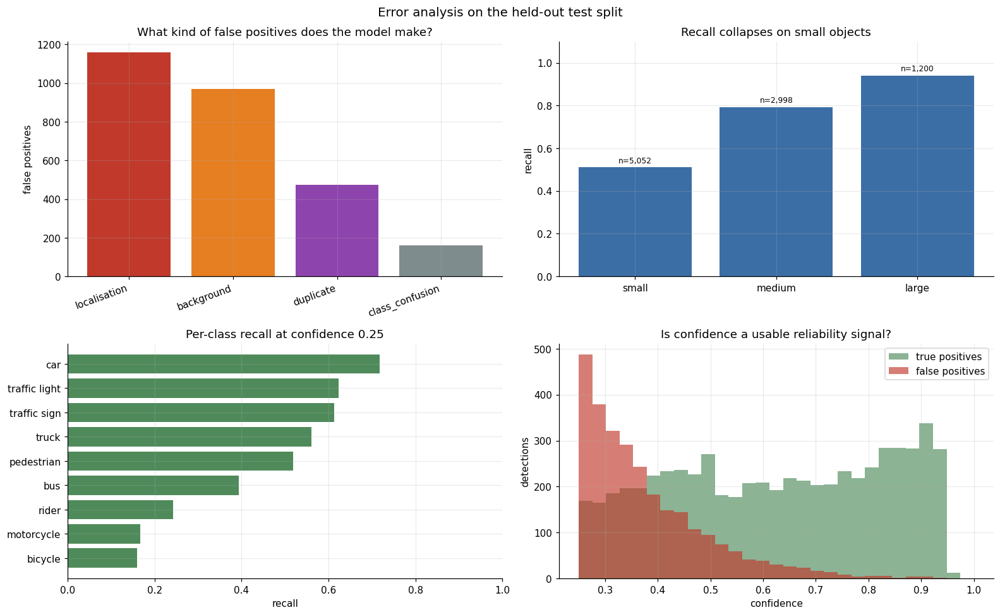

Saved: /content/bdd100k_yolo_project/visualizations/error_analysis_bdd100k_yolo26s_640px_full.png
Saved: /content/bdd100k_yolo_project/results/error_analysis_bdd100k_yolo26s_640px_full.json


In [22]:
"""Report and plot the error taxonomy."""


def report_error_analysis(analysis, class_names, config):
    errors = analysis["error_counts"]
    total_fp = sum(errors.values())
    total_fn = sum(analysis["fn_by_class"].values())
    total_tp = sum(analysis["tp_by_class"].values())

    print("=" * 74)
    print(f"ERROR TAXONOMY  ({analysis['n_images']} held-out images, "
          f"IoU match >= {config.EVAL_IOU_MATCH}, conf >= {config.CONFIDENCE_THRESHOLD})")
    print("=" * 74)
    print(f"  true positives : {total_tp:,}")
    print(f"  false positives: {total_fp:,}")
    print(f"  misses (FN)    : {total_fn:,}")
    overall_precision = total_tp / max(total_tp + total_fp, 1)
    overall_recall = total_tp / max(total_tp + total_fn, 1)
    print(f"\n  precision @{config.CONFIDENCE_THRESHOLD} : {overall_precision:.3f}")
    print(f"  recall    @{config.CONFIDENCE_THRESHOLD} : {overall_recall:.3f}")

    print("\n  False positives by cause:")
    descriptions = {
        "background": "hallucination on empty scene content",
        "localisation": "object found, box not tight enough",
        "class_confusion": "box correct, label wrong",
        "duplicate": "NMS left a redundant box",
    }
    for error_type, count in errors.most_common():
        share = count / max(total_fp, 1)
        print(f"    {error_type:<16} {count:>7,}  {share:>7.1%}   {descriptions.get(error_type, '')}")

    print("\n  Recall by object size (the small-object problem, quantified):")
    for bucket, _, _ in SIZE_BUCKETS:
        gt_count = analysis["gt_by_size"].get(bucket, 0)
        missed = analysis["fn_by_size"].get(bucket, 0)
        if gt_count:
            print(f"    {bucket:<22} recall {1 - missed / gt_count:>6.1%}   "
                  f"({gt_count:,} ground-truth boxes, {missed:,} missed)")

    print("\n  Recall by class:")
    rows = []
    for class_id, name in enumerate(class_names):
        gt_count = analysis["gt_by_class"].get(class_id, 0)
        if not gt_count:
            continue
        tp = analysis["tp_by_class"].get(class_id, 0)
        fp = sum(analysis["fp_by_class"].get(class_id, {}).values())
        rows.append((name, tp / gt_count, tp / max(tp + fp, 1), gt_count))
    for name, recall, precision, gt_count in sorted(rows, key=lambda r: r[1]):
        print(f"    {name:<16} recall {recall:>6.1%}  precision {precision:>6.1%}  "
              f"({gt_count:,} GT boxes)")

    if analysis["confusion_pairs"]:
        print("\n  Most frequent class confusions (true -> predicted):")
        for (true_id, pred_id), count in analysis["confusion_pairs"].most_common(6):
            true_name = class_names[true_id] if true_id < len(class_names) else str(true_id)
            pred_name = class_names[pred_id] if pred_id < len(class_names) else str(pred_id)
            print(f"    {true_name:<16} -> {pred_name:<16} {count:>6,}")
    print("=" * 74)

    return {"precision_at_threshold": overall_precision, "recall_at_threshold": overall_recall,
            "total_tp": total_tp, "total_fp": total_fp, "total_fn": total_fn,
            "fp_breakdown": dict(errors)}


def plot_error_analysis(analysis, class_names, config, run_name):
    fig, axes = plt.subplots(2, 2, figsize=(14.5, 9))

    ax = axes[0, 0]
    errors = analysis["error_counts"]
    if errors:
        labels = [k for k, _ in errors.most_common()]
        values = [v for _, v in errors.most_common()]
        colors = ["#c0392b", "#e67e22", "#8e44ad", "#7f8c8d"][:len(labels)]
        ax.bar(range(len(labels)), values, color=colors)
        ax.set_xticks(range(len(labels)))
        ax.set_xticklabels(labels, rotation=20, ha="right")
        ax.set_ylabel("false positives")
    ax.set_title("What kind of false positives does the model make?")

    ax = axes[0, 1]
    buckets = [b for b, _, _ in SIZE_BUCKETS]
    recalls, counts = [], []
    for bucket in buckets:
        gt_count = analysis["gt_by_size"].get(bucket, 0)
        missed = analysis["fn_by_size"].get(bucket, 0)
        recalls.append(1 - missed / gt_count if gt_count else 0.0)
        counts.append(gt_count)
    bars = ax.bar(range(len(buckets)), recalls, color="#3b6ea5")
    for bar, count in zip(bars, counts):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.02,
                f"n={count:,}", ha="center", fontsize=8)
    ax.set_xticks(range(len(buckets)))
    ax.set_xticklabels([b.split(" ")[0] for b in buckets])
    ax.set_ylim(0, 1.1)
    ax.set_ylabel("recall")
    ax.set_title("Recall collapses on small objects")

    ax = axes[1, 0]
    rows = []
    for class_id, name in enumerate(class_names):
        gt_count = analysis["gt_by_class"].get(class_id, 0)
        if gt_count:
            rows.append((name, analysis["tp_by_class"].get(class_id, 0) / gt_count))
    rows.sort(key=lambda r: r[1])
    if rows:
        ax.barh([r[0] for r in rows], [r[1] for r in rows], color="#4f8a5b")
    ax.set_xlim(0, 1)
    ax.set_xlabel("recall")
    ax.set_title(f"Per-class recall at confidence {config.CONFIDENCE_THRESHOLD}")

    ax = axes[1, 1]
    if analysis["tp_confidences"] or analysis["fp_confidences"]:
        bins = np.linspace(config.CONFIDENCE_THRESHOLD, 1.0, 30)
        ax.hist(analysis["tp_confidences"], bins=bins, alpha=0.65,
                label="true positives", color="#4f8a5b")
        ax.hist(analysis["fp_confidences"], bins=bins, alpha=0.65,
                label="false positives", color="#c0392b")
        ax.set_xlabel("confidence")
        ax.set_ylabel("detections")
        ax.legend()
    ax.set_title("Is confidence a usable reliability signal?")

    fig.suptitle("Error analysis on the held-out test split", fontsize=13)
    fig.tight_layout()
    output_path = config.visualizations_dir / f"error_analysis_{run_name}.png"
    fig.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")


if have("error_analysis", "class_names"):
    ERROR_SUMMARY = report_error_analysis(STATE["error_analysis"], STATE["class_names"], CONFIG)
    plot_error_analysis(STATE["error_analysis"], STATE["class_names"], CONFIG, CONFIG.run_name)
    STATE["error_summary"] = ERROR_SUMMARY

    summary_path = CONFIG.results_dir / f"error_analysis_{CONFIG.run_name}.json"
    with open(summary_path, "w") as handle:
        json.dump(ERROR_SUMMARY, handle, indent=2)
    STATE["error_analysis"]["per_image"].to_csv(
        CONFIG.results_dir / f"per_image_errors_{CONFIG.run_name}.csv", index=False)
    print(f"Saved: {summary_path}")


### 21.1 Representative failure cases

The images below are the ones the detector handled *worst*, selected automatically as the held-out
images with the lowest per-image recall among those containing a reasonable number of objects. Ground
truth is on the left, predictions on the right.

Reading these is the most useful thing in the notebook. Look for whether the misses are concentrated
in the far field (a resolution problem), among occluded objects in dense traffic (a fundamentally hard
problem for a single-frame detector), or in poor lighting (a domain problem).


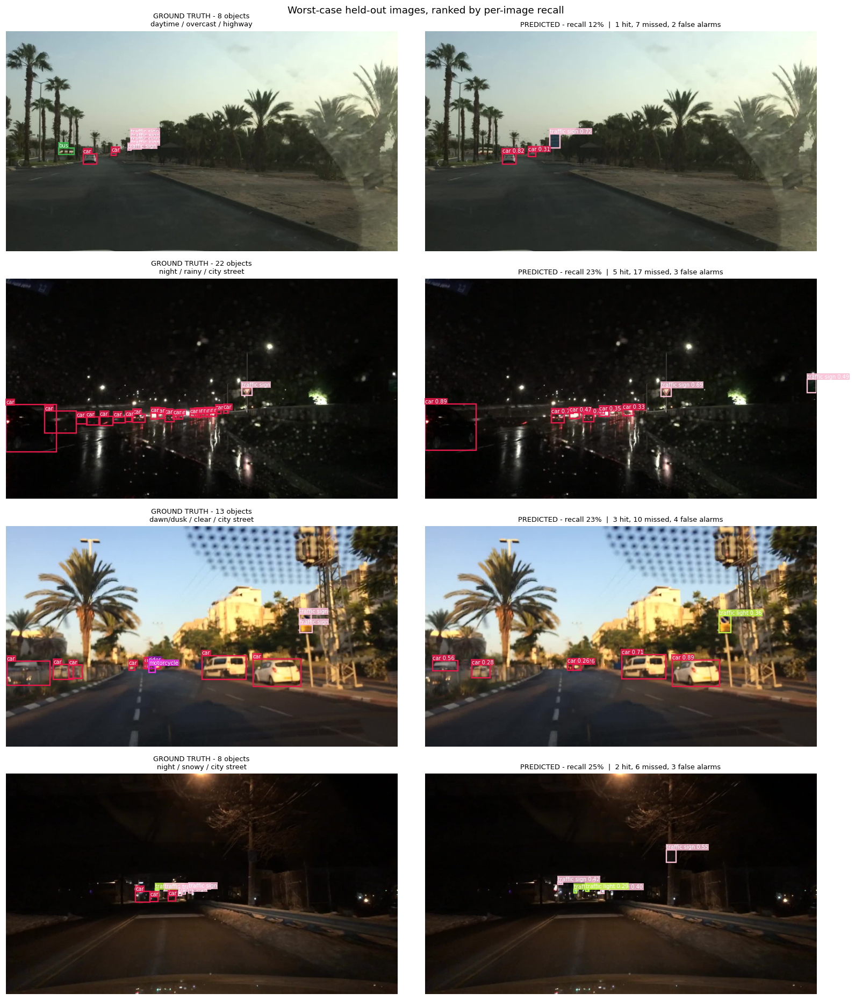

Saved: /content/bdd100k_yolo_project/visualizations/failure_cases_bdd100k_yolo26s_640px_full.png

  Conditions of the worst cases:
    c25a8eea-5c0d75f6.jpg      recall   12%  daytime/overcast/highway  (8 objects)
    bbfcd002-865258a4.jpg      recall   23%  night/rainy/city street  (22 objects)
    c8d0d179-15d8ce52.jpg      recall   23%  dawn/dusk/clear/city street  (13 objects)
    bbff5146-6ab95f34.jpg      recall   25%  night/snowy/city street  (8 objects)


In [23]:
"""Visualise the worst-performing held-out images: ground truth beside predictions."""


def show_failure_cases(config, model, analysis, annotation_index, class_names, device,
                       n_cases=4, min_objects=6):
    frame = analysis["per_image"]
    candidates = frame[(frame["n_gt"] >= min_objects) & frame["recall"].notna()]
    if candidates.empty:
        print("No suitable failure cases found in the analysed sample.")
        return

    worst = candidates.nsmallest(n_cases, "recall")
    image_dir = config.yolo_dataset_dir / "images" / "test"
    label_dir = config.yolo_dataset_dir / "labels" / "test"
    paths = [image_dir / name for name in worst["name"]]
    results = predict_on_images(model, paths, config, device)

    fig, axes = plt.subplots(len(worst), 2, figsize=(15, 4.3 * len(worst)))
    axes = np.array(axes).reshape(len(worst), 2)

    for row_index, ((_, row), path, result) in enumerate(zip(worst.iterrows(), paths, results)):
        image = Image.open(path).convert("RGB")
        gt_boxes = read_yolo_label(label_dir / (Path(row["name"]).stem + ".txt"))

        ax = axes[row_index, 0]
        ax.imshow(image)
        draw_boxes_on_axis(ax, gt_boxes, class_names, image.width, image.height)
        ax.set_title(f"GROUND TRUTH - {row['n_gt']} objects\n"
                     f"{row['timeofday']} / {row['weather']} / {row['scene']}", fontsize=8.5)
        ax.axis("off")

        ax = axes[row_index, 1]
        ax.imshow(image)
        pred_boxes, _, confidences = result_to_normalised_boxes(result)
        draw_boxes_on_axis(ax, pred_boxes, class_names, image.width, image.height,
                           scores=confidences)
        ax.set_title(f"PREDICTED - recall {row['recall']:.0%}  |  "
                     f"{row['tp']} hit, {row['fn']} missed, {row['fp']} false alarms", fontsize=8.5)
        ax.axis("off")

    fig.suptitle("Worst-case held-out images, ranked by per-image recall", fontsize=12)
    fig.tight_layout()
    output_path = config.visualizations_dir / f"failure_cases_{config.run_name}.png"
    fig.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")

    print("\n  Conditions of the worst cases:")
    for _, row in worst.iterrows():
        print(f"    {row['name']:<26} recall {row['recall']:>5.0%}  "
              f"{row['timeofday']}/{row['weather']}/{row['scene']}  "
              f"({row['n_gt']} objects)")


if have("error_analysis", "eval_model", "val_index", "class_names"):
    show_failure_cases(CONFIG, STATE["eval_model"], STATE["error_analysis"],
                       STATE["val_index"], STATE["class_names"], DEVICE)


## 22. Scene and condition robustness analysis

BDD100K's distinguishing feature is not its size — it is that every image carries metadata describing
the conditions it was captured in:

* **`timeofday`** — daytime, night, dawn/dusk
* **`weather`** — clear, overcast, partly cloudy, rainy, snowy, foggy
* **`scene`** — city street, highway, residential, parking lot, tunnel, gas stations

That makes a genuine robustness study possible instead of a single aggregate number. This section
partitions the **held-out test split** by each attribute value and runs a full, independent evaluation
on each partition.

### Why this matters more than overall mAP

A detector reporting 0.55 mAP might be uniformly mediocre, or it might be excellent in daylight and
poor at night. Those are very different systems, and only one of them is safe to deploy on a vehicle
that drives after dark. Aggregate metrics average that distinction away.

### Methodological caveats — read before interpreting the results

Partitions are **not** matched on anything except the attribute itself, so the comparisons are
observational, not controlled. Night-time images in BDD100K differ from daytime images in more than
illumination: they contain a different mix of scenes, fewer pedestrians, more highway driving, and a
different object-scale distribution. A night-vs-day mAP gap therefore reflects *everything* that
differs between those partitions, not lighting alone.

Additionally, mAP computed on a small partition is noisy, and partitions differ in size by an order of
magnitude. Conditions with fewer than `MIN_IMAGES_PER_CONDITION` images are excluded outright rather
than reported with misleading precision, and the image count is printed alongside every result so you
can weight your confidence accordingly.



TIMEOFDAY
Ultralytics 8.4.147 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26s summary (fused): 120 layers, 9,468,663 parameters, 0 gradients, 20.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1916.3±463.0 MB/s, size: 76.4 KB)
val: Scanning /content/bdd100k_work/conditions/timeofday__daytime/labels/val... 1277 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1277/1277 1.1Kit/s 1.1s
val: New cache created: /content/bdd100k_work/conditions/timeofday__daytime/labels/val.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 107/107 7.8it/s 13.7s
                   all       1277      25139      0.656      0.494      0.534      0.301
Speed: 0.6ms preprocess, 5.7ms inference, 0.0ms loss, 1.5ms postprocess per image
  daytime               1277 images  mAP@50 0.534  mAP@50-95 0.301  recall 0.494
Ultralytics 8.4.147 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26s summary (

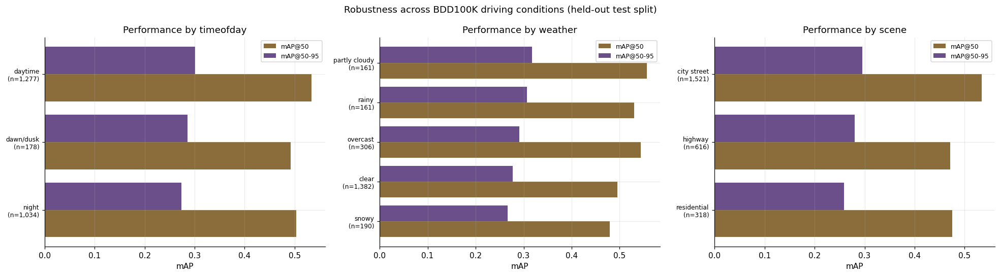

Saved: /content/bdd100k_yolo_project/visualizations/condition_analysis_bdd100k_yolo26s_640px_full.png
Saved: /content/bdd100k_yolo_project/results/condition_analysis_bdd100k_yolo26s_640px_full.csv

  Day mAP@50-95   : 0.3014
  Night mAP@50-95 : 0.2733
  Relative change : -9.3% at night
  (Observational: the night partition also differs in scene mix and object
   scale, so this gap is not attributable to illumination alone.)


In [24]:
"""Partition the held-out test split by scene metadata and evaluate each partition."""


def safe_directory_name(text):
    return re.sub(r"[^a-z0-9]+", "_", str(text).lower()).strip("_") or "undefined"


def build_condition_subset(config, condition_key, image_names):
    """Create a symlinked dataset directory for one condition and return its YAML path."""
    root = config.work_dir / "conditions" / condition_key
    image_dir = root / "images" / "val"
    label_dir = root / "labels" / "val"
    image_dir.mkdir(parents=True, exist_ok=True)
    label_dir.mkdir(parents=True, exist_ok=True)

    source_images = config.yolo_dataset_dir / "images" / "test"
    source_labels = config.yolo_dataset_dir / "labels" / "test"

    for name in image_names:
        stem = Path(name).stem
        for source, destination in [(source_images / name, image_dir / name),
                                    (source_labels / f"{stem}.txt", label_dir / f"{stem}.txt")]:
            if destination.exists() or not source.exists():
                continue
            try:
                os.symlink(source.resolve(), destination)
            except OSError:
                shutil.copy2(source, destination)

    yaml_path = root / "condition.yaml"
    with open(yaml_path, "w") as handle:
        yaml.safe_dump({
            "path": str(root),
            "train": "images/val",   # unused, but Ultralytics expects the key to exist
            "val": "images/val",
            "names": {index: name for index, name in enumerate(STATE["class_names"])},
        }, handle, sort_keys=False)
    return yaml_path


def group_test_images_by_condition(split_names, annotation_index, attribute):
    groups = defaultdict(list)
    for name in split_names:
        record = annotation_index.get(name)
        if record is None:
            continue
        groups[record["attributes"].get(attribute, "undefined")].append(name)
    return groups


def evaluate_conditions(config, weights_path, split_names, annotation_index, device, batch_size):
    """Evaluate the model separately on each sufficiently large condition partition."""
    model = YOLO(str(weights_path))
    rows = []

    for attribute in ["timeofday", "weather", "scene"]:
        groups = group_test_images_by_condition(split_names, annotation_index, attribute)
        print(f"\n{'=' * 74}\n{attribute.upper()}\n{'=' * 74}")
        for value, names in sorted(groups.items(), key=lambda kv: -len(kv[1])):
            if value in ("undefined", None):
                print(f"  {str(value):<20} {len(names):>5} images  -> skipped (no label)")
                continue
            if len(names) < config.MIN_IMAGES_PER_CONDITION:
                print(f"  {str(value):<20} {len(names):>5} images  -> skipped "
                      f"(below the {config.MIN_IMAGES_PER_CONDITION}-image minimum)")
                continue

            key = f"{attribute}__{safe_directory_name(value)}"
            yaml_path = build_condition_subset(config, key, names)
            try:
                metrics = model.val(
                    data=str(yaml_path), split="val", imgsz=config.IMAGE_SIZE,
                    batch=max(1, batch_size // 2), conf=0.001, iou=config.IOU_THRESHOLD,
                    max_det=config.MAX_DET, device=device, plots=False, verbose=False,
                    project=str(config.evaluation_dir / "conditions"), name=key, exist_ok=True)
            except Exception as exc:
                print(f"  {str(value):<20} evaluation failed: {type(exc).__name__}: {exc}")
                continue

            summary = extract_summary_metrics(metrics)
            rows.append({
                "attribute": attribute, "condition": value, "images": len(names),
                "mAP@50": summary["mAP50"], "mAP@50-95": summary["mAP50_95"],
                "precision": summary["precision"], "recall": summary["recall"],
            })
            print(f"  {str(value):<20} {len(names):>5} images  "
                  f"mAP@50 {summary['mAP50']:.3f}  mAP@50-95 {summary['mAP50_95']:.3f}  "
                  f"recall {summary['recall']:.3f}")

    return pd.DataFrame(rows)


def plot_condition_results(frame, config, run_name):
    attributes = [a for a in ["timeofday", "weather", "scene"]
                  if (frame["attribute"] == a).any()]
    if not attributes:
        return
    fig, axes = plt.subplots(1, len(attributes), figsize=(6 * len(attributes), 5), squeeze=False)

    for ax, attribute in zip(axes[0], attributes):
        subset = frame[frame["attribute"] == attribute].sort_values("mAP@50-95")
        positions = np.arange(len(subset))
        ax.barh(positions - 0.2, subset["mAP@50"], height=0.4, label="mAP@50", color="#8a6d3b")
        ax.barh(positions + 0.2, subset["mAP@50-95"], height=0.4, label="mAP@50-95",
                color="#6a4f8a")
        ax.set_yticks(positions)
        ax.set_yticklabels([f"{c}\n(n={n:,})" for c, n in
                            zip(subset["condition"], subset["images"])], fontsize=8)
        ax.set_xlabel("mAP")
        ax.set_title(f"Performance by {attribute}")
        ax.legend(fontsize=8)

    fig.suptitle("Robustness across BDD100K driving conditions (held-out test split)", fontsize=12)
    fig.tight_layout()
    output_path = config.visualizations_dir / f"condition_analysis_{run_name}.png"
    fig.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")


if have("best_weights", "splits", "val_index", "class_names"):
    CONDITION_RESULTS = evaluate_conditions(
        CONFIG, STATE["best_weights"], STATE["splits"]["test"], STATE["val_index"],
        DEVICE, STATE["batch_size"])

    if CONDITION_RESULTS.empty:
        print("\nNo condition partition met the minimum image count; nothing to compare.")
    else:
        print("\n" + "=" * 90)
        print("CONDITION COMPARISON (held-out test split)")
        print("=" * 90)
        formatted = CONDITION_RESULTS.copy()
        for column in ["mAP@50", "mAP@50-95", "precision", "recall"]:
            formatted[column] = formatted[column].map(lambda v: f"{v:.3f}")
        print(formatted.to_string(index=False))
        print("=" * 90)

        plot_condition_results(CONDITION_RESULTS, CONFIG, CONFIG.run_name)
        csv_path = CONFIG.results_dir / f"condition_analysis_{CONFIG.run_name}.csv"
        CONDITION_RESULTS.to_csv(csv_path, index=False)
        print(f"Saved: {csv_path}")
        STATE["condition_results"] = CONDITION_RESULTS

        # Headline robustness gaps, computed rather than asserted.
        timeofday = CONDITION_RESULTS[CONDITION_RESULTS["attribute"] == "timeofday"]
        day = timeofday[timeofday["condition"] == "daytime"]
        night = timeofday[timeofday["condition"] == "night"]
        if not day.empty and not night.empty:
            day_map = float(day["mAP@50-95"].iloc[0])
            night_map = float(night["mAP@50-95"].iloc[0])
            change = (night_map - day_map) / day_map if day_map else float("nan")
            print(f"\n  Day mAP@50-95   : {day_map:.4f}")
            print(f"  Night mAP@50-95 : {night_map:.4f}")
            print(f"  Relative change : {change:+.1%} at night")
            print("  (Observational: the night partition also differs in scene mix and object")
            print("   scale, so this gap is not attributable to illumination alone.)")
            STATE["day_night_gap"] = {"day": day_map, "night": night_map, "relative": change}


## 23. Inference on new images

This section runs the trained model the way it would be used in practice: point it at an image, get
back boxes with class names and confidences.

Set `CONFIG.USER_IMAGE_PATH` in the configuration cell to run on your own dashcam frame. If it is
left as `None`, the cell falls back to a held-out test image so the demo always produces output.


No user image configured; using a held-out test image: c663ebc6-46365c70.jpg
INFERENCE: c663ebc6-46365c70.jpg
  resolution     : 1280 x 720
  inference size : 640
  detections     : 38 at confidence >= 0.25
  wall time      : 73.7 ms (includes image loading and drawing)
  stage timings  : preprocess=1.5ms  inference=64.8ms  postprocess=1.5ms

  Objects found:
    pedestrian        17   mean confidence 0.40
    traffic light     11   mean confidence 0.52
    car                6   mean confidence 0.65
    traffic sign       3   mean confidence 0.55
    truck              1   mean confidence 0.88


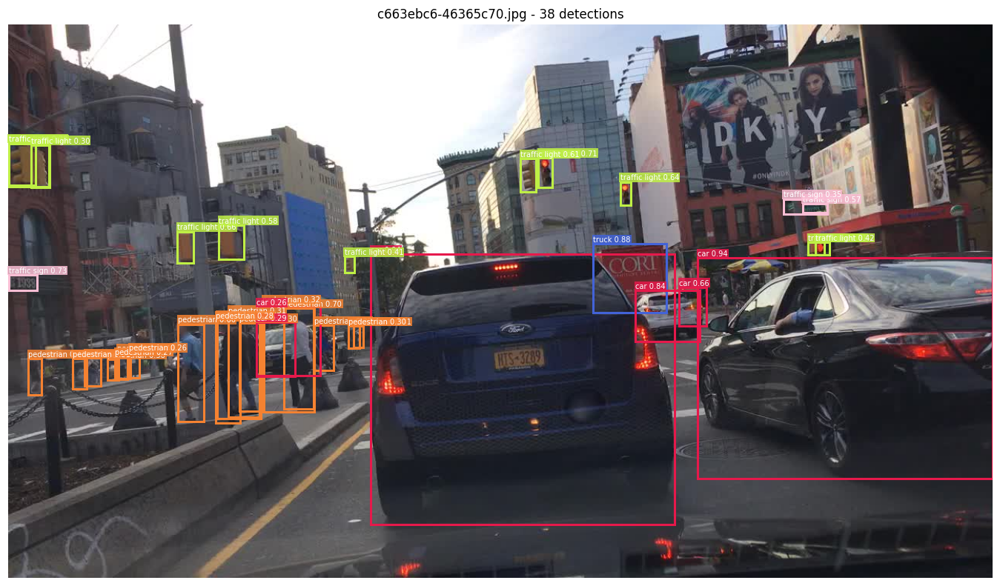

Saved: /content/bdd100k_yolo_project/predictions/inference_c663ebc6-46365c70.png


In [25]:
"""Deployment-style single-image inference, on a user-supplied image or a held-out fallback."""


def run_image_inference(config, model, image_path, class_names, device, save_name=None):
    """Detect objects in one image, print a detection table, and save the annotated result."""
    image_path = Path(image_path)
    if not image_path.exists():
        print(f"Image not found: {image_path}")
        return None

    started = time.perf_counter()
    results = model.predict(source=str(image_path), imgsz=config.IMAGE_SIZE,
                            conf=config.CONFIDENCE_THRESHOLD, iou=config.IOU_THRESHOLD,
                            max_det=config.MAX_DET, device=device, verbose=False)
    elapsed_ms = (time.perf_counter() - started) * 1000
    result = results[0]

    boxes, class_ids, confidences = result_to_normalised_boxes(result)
    counts = Counter(class_names[int(c)] for c in class_ids) if len(class_ids) else Counter()

    print("=" * 74)
    print(f"INFERENCE: {image_path.name}")
    print("=" * 74)
    print(f"  resolution     : {result.orig_shape[1]} x {result.orig_shape[0]}")
    print(f"  inference size : {config.IMAGE_SIZE}")
    print(f"  detections     : {len(boxes)} at confidence >= {config.CONFIDENCE_THRESHOLD}")
    print(f"  wall time      : {elapsed_ms:.1f} ms (includes image loading and drawing)")
    if hasattr(result, "speed") and isinstance(result.speed, dict):
        parts = "  ".join(f"{k}={v:.1f}ms" for k, v in result.speed.items())
        print(f"  stage timings  : {parts}")
    if counts:
        print("\n  Objects found:")
        for name, count in counts.most_common():
            class_confidences = [confidences[i] for i, c in enumerate(class_ids)
                                 if class_names[int(c)] == name]
            print(f"    {name:<16} {count:>3}   mean confidence {np.mean(class_confidences):.2f}")
    else:
        print("\n  No objects above the confidence threshold.")
    print("=" * 74)

    image = Image.open(image_path).convert("RGB")
    fig, ax = plt.subplots(figsize=(13, 7.3))
    ax.imshow(image)
    draw_boxes_on_axis(ax, boxes, class_names, image.width, image.height,
                       scores=confidences, linewidth=2.0)
    ax.axis("off")
    ax.set_title(f"{image_path.name} - {len(boxes)} detections", fontsize=11)
    fig.tight_layout()

    output_path = config.predictions_dir / (save_name or f"inference_{image_path.stem}.png")
    fig.savefig(output_path, bbox_inches="tight")
    plt.show()
    print(f"Saved: {output_path}")
    return {"detections": len(boxes), "counts": dict(counts), "wall_ms": elapsed_ms}


if have("eval_model", "class_names"):
    if CONFIG.USER_IMAGE_PATH and Path(CONFIG.USER_IMAGE_PATH).exists():
        INFERENCE_IMAGE = Path(CONFIG.USER_IMAGE_PATH)
        print(f"Using your image: {INFERENCE_IMAGE}")
    else:
        if CONFIG.USER_IMAGE_PATH:
            print(f"CONFIG.USER_IMAGE_PATH was set to '{CONFIG.USER_IMAGE_PATH}' "
                  f"but that file does not exist.")
        rng = random.Random(CONFIG.SEED + 1)
        INFERENCE_IMAGE = (CONFIG.yolo_dataset_dir / "images" / "test" /
                           rng.choice(STATE["splits"]["test"]))
        print(f"No user image configured; using a held-out test image: {INFERENCE_IMAGE.name}")

    run_image_inference(CONFIG, STATE["eval_model"], INFERENCE_IMAGE,
                        STATE["class_names"], DEVICE)


## 24. Driving video inference

```text
input video → decode frames → YOLO detection → boxes + class + confidence → annotated output video
```

Set `CONFIG.USER_VIDEO_PATH` to run on your own driving footage. The output is written to
`predictions/` on Drive as an MP4.

**If you do not supply a video**, the cell builds a short synthetic clip by sequencing held-out test
frames and runs the full pipeline on that instead. To be clear about what that is: it exercises the
complete decode → detect → annotate → encode path, but it is a **slideshow of unrelated frames**, not
real driving footage. It demonstrates the plumbing, not temporal behaviour. BDD100K's 100K image set
contains one keyframe per 40-second clip, so consecutive real frames are not available here — for
genuine temporal results you would need the BDD100K video release or your own dashcam recording.


In [26]:
"""Run detection over a video, writing an annotated MP4 to Drive."""


def build_demo_video(config, image_names, output_path, n_frames=60, fps=10, hold=2):
    """Sequence held-out frames into a synthetic clip so the video path can be demonstrated."""
    image_dir = config.yolo_dataset_dir / "images" / "test"
    rng = random.Random(config.SEED)
    chosen = rng.sample(image_names, min(n_frames // hold, len(image_names)))

    writer, size = None, None
    for name in chosen:
        frame = cv2.imread(str(image_dir / name))
        if frame is None:
            continue
        if writer is None:
            size = (frame.shape[1], frame.shape[0])
            writer = cv2.VideoWriter(str(output_path),
                                     cv2.VideoWriter_fourcc(*"mp4v"), fps, size)
        if (frame.shape[1], frame.shape[0]) != size:
            frame = cv2.resize(frame, size)
        for _ in range(hold):
            writer.write(frame)
    if writer is not None:
        writer.release()
        return output_path
    return None


def run_video_inference(config, model, source_path, output_path, class_names, device):
    """Detect frame by frame and write an annotated video. Returns timing statistics."""
    capture = cv2.VideoCapture(str(source_path))
    if not capture.isOpened():
        print(f"Could not open video: {source_path}")
        return None

    fps = capture.get(cv2.CAP_PROP_FPS) or 25.0
    width = int(capture.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(capture.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(capture.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
    max_frames = int(fps * config.MAX_VIDEO_SECONDS)

    print(f"  source     : {source_path}")
    print(f"  resolution : {width}x{height} @ {fps:.1f} fps")
    print(f"  frames     : {total_frames if total_frames else 'unknown'} "
          f"(processing at most {max_frames})")

    writer = cv2.VideoWriter(str(output_path), cv2.VideoWriter_fourcc(*"mp4v"),
                             fps, (width, height))

    inference_times, detection_counts = [], []
    frame_index = 0
    started = time.time()

    while frame_index < max_frames:
        ok, frame = capture.read()
        if not ok:
            break

        if device.startswith("cuda"):
            torch.cuda.synchronize()
        tick = time.perf_counter()
        results = model.predict(source=frame, imgsz=config.IMAGE_SIZE,
                                conf=config.CONFIDENCE_THRESHOLD, iou=config.IOU_THRESHOLD,
                                max_det=config.MAX_DET, device=device, verbose=False)
        if device.startswith("cuda"):
            torch.cuda.synchronize()
        inference_times.append((time.perf_counter() - tick) * 1000)

        result = results[0]
        annotated = result.plot()
        detection_counts.append(0 if result.boxes is None else len(result.boxes))

        overlay = (f"frame {frame_index + 1} | {detection_counts[-1]} objects | "
                   f"{1000 / max(inference_times[-1], 1e-6):.0f} FPS")
        cv2.putText(annotated, overlay, (12, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7,
                    (0, 0, 0), 4, cv2.LINE_AA)
        cv2.putText(annotated, overlay, (12, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7,
                    (255, 255, 255), 2, cv2.LINE_AA)

        if annotated.shape[1] != width or annotated.shape[0] != height:
            annotated = cv2.resize(annotated, (width, height))
        writer.write(annotated)
        frame_index += 1

        if frame_index % 50 == 0:
            print(f"    processed {frame_index} frames ...")

    capture.release()
    writer.release()
    elapsed = time.time() - started

    if not inference_times:
        print("  No frames were processed.")
        return None

    stats = {
        "frames": frame_index,
        "mean_inference_ms": float(np.mean(inference_times)),
        "median_inference_ms": float(np.median(inference_times)),
        "detection_fps": float(1000 / np.mean(inference_times)),
        "end_to_end_fps": frame_index / elapsed,
        "mean_detections_per_frame": float(np.mean(detection_counts)),
        "output": str(output_path),
    }
    print(f"\n  frames processed        : {stats['frames']}")
    print(f"  mean detection latency  : {stats['mean_inference_ms']:.1f} ms")
    print(f"  detection-only FPS      : {stats['detection_fps']:.1f}")
    print(f"  end-to-end FPS          : {stats['end_to_end_fps']:.1f} "
          f"(includes decode, drawing and encode)")
    print(f"  mean objects per frame  : {stats['mean_detections_per_frame']:.1f}")
    print(f"  written to              : {output_path}")
    return stats


if have("eval_model", "class_names", "splits"):
    OUTPUT_VIDEO = CONFIG.predictions_dir / f"annotated_drive_{CONFIG.run_name}.mp4"

    if CONFIG.USER_VIDEO_PATH and Path(CONFIG.USER_VIDEO_PATH).exists():
        SOURCE_VIDEO = Path(CONFIG.USER_VIDEO_PATH)
        print("Running on your driving video.\n")
    else:
        if CONFIG.USER_VIDEO_PATH:
            print(f"CONFIG.USER_VIDEO_PATH '{CONFIG.USER_VIDEO_PATH}' does not exist.")
        print("No driving video supplied. Building a SYNTHETIC clip from held-out frames.")
        print("This exercises the full video pipeline but is a sequence of unrelated")
        print("keyframes, not continuous footage - treat it as a plumbing demo only.\n")
        SOURCE_VIDEO = build_demo_video(CONFIG, STATE["splits"]["test"],
                                        CONFIG.work_dir / "demo_clip.mp4")

    if SOURCE_VIDEO is None:
        print("Could not prepare a video source; skipping video inference.")
    else:
        VIDEO_STATS = run_video_inference(CONFIG, STATE["eval_model"], SOURCE_VIDEO,
                                          OUTPUT_VIDEO, STATE["class_names"], DEVICE)
        STATE["video_stats"] = VIDEO_STATS


No driving video supplied. Building a SYNTHETIC clip from held-out frames.
This exercises the full video pipeline but is a sequence of unrelated
keyframes, not continuous footage - treat it as a plumbing demo only.

  source     : /content/bdd100k_work/demo_clip.mp4
  resolution : 1280x720 @ 10.0 fps
  frames     : 60 (processing at most 200)
    processed 50 frames ...

  frames processed        : 60
  mean detection latency  : 19.4 ms
  detection-only FPS      : 51.6
  end-to-end FPS          : 25.9 (includes decode, drawing and encode)
  mean objects per frame  : 17.2
  written to              : /content/bdd100k_yolo_project/predictions/annotated_drive_bdd100k_yolo26s_640px_full.mp4


## 25. Inference speed benchmark

### How this is measured

Naive timing of a detector is almost always wrong, for three reasons this benchmark controls for:

1. **CUDA is asynchronous.** A kernel launch returns immediately; without
   `torch.cuda.synchronize()` you time the launch, not the computation. Every measurement below is
   synchronised on both sides.
2. **The first calls are not representative.** cuDNN autotuning, memory-pool warm-up and lazy module
   initialisation make early iterations several times slower. A warm-up phase is discarded.
3. **Data loading is not inference.** Reading a JPEG from disk can cost more than the forward pass. The
   image is decoded once and held in memory, so what is measured is the model.

The breakdown separates **preprocess** (resize, normalise, to-GPU), **inference** (the forward pass)
and **postprocess** (NMS, box decoding), because they scale differently: preprocess is resolution-bound,
postprocess grows with the number of detections, and only inference scales with model size.

### On interpreting the FPS number

The figure below is measured on a Colab GPU, in Python, at batch size 1, in PyTorch eager mode. It is
a reasonable *relative* benchmark and a poor *absolute* one. A production deployment would export to
TensorRT with INT8 or FP16 quantisation on embedded automotive hardware, which changes the number
substantially — usually upward on throughput, but on a device with a far smaller power budget.


In [27]:
"""Benchmark inference latency with correct CUDA synchronisation and warm-up."""


def benchmark_inference(config, model, image_path, device, iterations=None, warmup=10):
    """Measure per-stage latency at batch size 1 on a pre-loaded image."""
    iterations = iterations or config.BENCHMARK_ITERATIONS
    frame = cv2.imread(str(image_path))
    if frame is None:
        print(f"Could not read benchmark image: {image_path}")
        return None

    predict_kwargs = dict(imgsz=config.IMAGE_SIZE, conf=config.CONFIDENCE_THRESHOLD,
                          iou=config.IOU_THRESHOLD, max_det=config.MAX_DET,
                          device=device, verbose=False)

    for _ in range(warmup):
        model.predict(source=frame, **predict_kwargs)
    if device.startswith("cuda"):
        torch.cuda.synchronize()

    total_times = []
    stage_totals = defaultdict(list)
    for _ in range(iterations):
        if device.startswith("cuda"):
            torch.cuda.synchronize()
        tick = time.perf_counter()
        results = model.predict(source=frame, **predict_kwargs)
        if device.startswith("cuda"):
            torch.cuda.synchronize()
        total_times.append((time.perf_counter() - tick) * 1000)
        speed = getattr(results[0], "speed", None)
        if isinstance(speed, dict):
            for stage, value in speed.items():
                stage_totals[stage].append(float(value))

    total_times = np.array(total_times)
    stats = {
        "device": torch.cuda.get_device_name(0) if device.startswith("cuda") else platform.processor() or "CPU",
        "model": STATE.get("resolved_model_name", config.MODEL_NAME),
        "image_size": config.IMAGE_SIZE,
        "source_resolution": f"{frame.shape[1]}x{frame.shape[0]}",
        "batch_size": 1,
        "precision": "fp32 (PyTorch eager, unexported)",
        "iterations": int(iterations),
        "mean_ms": float(total_times.mean()),
        "median_ms": float(np.median(total_times)),
        "p95_ms": float(np.percentile(total_times, 95)),
        "std_ms": float(total_times.std()),
        "fps_mean": float(1000 / total_times.mean()),
        "stage_ms": {k: float(np.mean(v)) for k, v in stage_totals.items()},
    }

    print("=" * 74)
    print("INFERENCE SPEED BENCHMARK")
    print("=" * 74)
    print(f"  device            : {stats['device']}")
    print(f"  model             : {stats['model']}")
    print(f"  source resolution : {stats['source_resolution']}")
    print(f"  inference size    : {stats['image_size']} px")
    print(f"  batch size        : 1")
    print(f"  precision         : {stats['precision']}")
    print(f"  iterations        : {stats['iterations']} (after {warmup} warm-up passes)")
    print()
    print(f"  mean latency      : {stats['mean_ms']:.2f} ms")
    print(f"  median latency    : {stats['median_ms']:.2f} ms")
    print(f"  p95 latency       : {stats['p95_ms']:.2f} ms")
    print(f"  std deviation     : {stats['std_ms']:.2f} ms")
    print(f"  throughput        : {stats['fps_mean']:.1f} FPS")
    if stats["stage_ms"]:
        print("\n  Stage breakdown (Ultralytics internal timers):")
        for stage, value in stats["stage_ms"].items():
            print(f"    {stage:<14} {value:>7.2f} ms")
    print("=" * 74)
    return stats


def discuss_real_time(stats, video_stats):
    """State plainly what the measured latency does and does not imply."""
    fps = stats["fps_mean"]
    print("\nIs this fast enough for real-time perception?")
    print(f"  Measured: {fps:.1f} FPS ({stats['mean_ms']:.1f} ms per frame) on {stats['device']}.")

    if fps >= 30:
        verdict = ("comfortably above a 30 FPS camera rate, with headroom for the rest of a "
                   "perception stack")
    elif fps >= 15:
        verdict = ("adequate for a 15 FPS pipeline but leaves little headroom once tracking, "
                   "fusion and planning are added")
    else:
        verdict = "below typical camera frame rates; it would need optimisation or a smaller model"
    print(f"  Assessment: this is {verdict}.")

    if video_stats:
        print(f"  End-to-end video throughput was {video_stats['end_to_end_fps']:.1f} FPS, "
              f"lower than the {video_stats['detection_fps']:.1f} FPS detection-only figure")
        print("  because decoding, annotation drawing and re-encoding are included there.")

    print("\n  What this number does NOT establish:")
    print("   - This is a Colab datacentre GPU, not automotive hardware. Embedded targets have a")
    print("     fraction of the power budget, and the relevant figure there is latency under")
    print("     a sustained thermal load, not a peak burst in a notebook.")
    print("   - Latency for one model is not latency for a perception system. A real stack runs")
    print("     detection alongside tracking, depth, lane estimation and fusion within one budget.")
    print("   - Safety-critical perception is judged on worst-case latency and failure behaviour,")
    print("     not mean throughput. The p95 figure above is closer to the right question.")
    print("\n  This is a fast detector, benchmarked honestly. It is not evidence that the system")
    print("  is ready to drive a car.")


if have("eval_model", "splits"):
    rng = random.Random(CONFIG.SEED)
    BENCHMARK_IMAGE = (CONFIG.yolo_dataset_dir / "images" / "test" /
                       rng.choice(STATE["splits"]["test"]))
    SPEED_STATS = benchmark_inference(CONFIG, STATE["eval_model"], BENCHMARK_IMAGE, DEVICE)
    if SPEED_STATS:
        discuss_real_time(SPEED_STATS, STATE.get("video_stats"))
        STATE["speed_stats"] = SPEED_STATS
        with open(CONFIG.results_dir / f"speed_benchmark_{CONFIG.run_name}.json", "w") as handle:
            json.dump(SPEED_STATS, handle, indent=2)


INFERENCE SPEED BENCHMARK
  device            : Tesla T4
  model             : yolo26s.pt
  source resolution : 1280x720
  inference size    : 640 px
  batch size        : 1
  precision         : fp32 (PyTorch eager, unexported)
  iterations        : 60 (after 10 warm-up passes)

  mean latency      : 12.72 ms
  median latency    : 12.30 ms
  p95 latency       : 15.36 ms
  std deviation     : 1.37 ms
  throughput        : 78.6 FPS

  Stage breakdown (Ultralytics internal timers):
    preprocess        1.15 ms
    inference         9.96 ms
    postprocess       1.24 ms

Is this fast enough for real-time perception?
  Measured: 78.6 FPS (12.7 ms per frame) on Tesla T4.
  Assessment: this is comfortably above a 30 FPS camera rate, with headroom for the rest of a perception stack.
  End-to-end video throughput was 25.9 FPS, lower than the 51.6 FPS detection-only figure
  because decoding, annotation drawing and re-encoding are included there.

  What this number does NOT establish:
   - Th

## 26. Model comparison

The accuracy/latency trade-off is the central engineering decision in deployed perception, so the
comparison framework is implemented in full. Whether it *trains* a second model is controlled by
`CONFIG.RUN_MODEL_COMPARISON`, which defaults to `False`.

### What runs by default

With the flag off, the comparison still reports everything that can be measured **without** training:

* parameter count and checkpoint size for both architectures
* measured inference latency and FPS for both, benchmarked identically

Speed is a property of the architecture, not of the fine-tuning, so those figures are real and
directly comparable. Accuracy columns are populated **only** for models actually trained on BDD100K —
they are shown as `not trained` otherwise rather than filled with a plausible-looking guess.

### Enabling the full comparison

Set `CONFIG.RUN_MODEL_COMPARISON = True` and re-run from Section 14. This trains
`COMPARISON_MODEL_NAME` on the identical splits, with identical hyperparameters and the identical
seed, and evaluates it on the same held-out test split — roughly doubling total runtime. Holding
everything but the model constant is what makes the resulting comparison attributable to model
capacity rather than to experimental drift.


In [28]:
"""Compare model variants on size, speed and (when trained) accuracy."""


def measure_model_size(model_name, cache_dir):
    """Load a checkpoint just far enough to count parameters and measure its size."""
    model, resolved = resolve_model(model_name, cache_dir)
    parameters = sum(p.numel() for p in model.model.parameters())
    weight_path = Path(cache_dir) / resolved
    size_mb = weight_path.stat().st_size / 1e6 if weight_path.exists() else float("nan")
    return model, resolved, int(parameters), float(size_mb)


def train_and_evaluate_variant(config, model_name, data_yaml, batch_size, device):
    """Train one comparison variant under identical settings and evaluate it on the test split."""
    run_name = f"bdd100k_{Path(model_name).stem}_{config.IMAGE_SIZE}px_compare"
    model, resolved = resolve_model(model_name, config.cache_dir)
    weights, run_dir, _ = train_detector(config, model, data_yaml, batch_size, device, run_name)
    metrics, _ = evaluate_model(config, weights, data_yaml, "test", device, batch_size,
                                f"test_eval_{run_name}")
    return resolved, extract_summary_metrics(metrics), weights


def build_comparison_table(config, primary_summary, primary_info, speed_stats,
                           data_yaml, batch_size, device, benchmark_image):
    rows = []

    # --- primary model (trained) ---------------------------------------------
    rows.append({
        "model": primary_info["name"],
        "params (M)": primary_info["parameters"] / 1e6,
        "checkpoint (MB)": primary_info["size_mb"],
        "trained on BDD100K": "yes",
        "mAP@50": primary_summary["mAP50"] if primary_summary else float("nan"),
        "mAP@50-95": primary_summary["mAP50_95"] if primary_summary else float("nan"),
        "precision": primary_summary["precision"] if primary_summary else float("nan"),
        "recall": primary_summary["recall"] if primary_summary else float("nan"),
        "latency (ms)": speed_stats["mean_ms"] if speed_stats else float("nan"),
        "FPS": speed_stats["fps_mean"] if speed_stats else float("nan"),
    })

    # --- comparison model ------------------------------------------------------
    if config.RUN_MODEL_COMPARISON:
        print(f"Training the comparison model '{config.COMPARISON_MODEL_NAME}' "
              f"under identical settings ...\n")
        resolved, summary, weights = train_and_evaluate_variant(
            config, config.COMPARISON_MODEL_NAME, data_yaml, batch_size, device)
        comparison_model = YOLO(str(weights))
        comparison_speed = benchmark_inference(config, comparison_model, benchmark_image, device)
        parameters = sum(p.numel() for p in comparison_model.model.parameters())
        weight_size = Path(weights).stat().st_size / 1e6 if Path(weights).exists() else float("nan")
        rows.append({
            "model": resolved,
            "params (M)": parameters / 1e6,
            "checkpoint (MB)": weight_size,
            "trained on BDD100K": "yes",
            "mAP@50": summary["mAP50"],
            "mAP@50-95": summary["mAP50_95"],
            "precision": summary["precision"],
            "recall": summary["recall"],
            "latency (ms)": comparison_speed["mean_ms"] if comparison_speed else float("nan"),
            "FPS": comparison_speed["fps_mean"] if comparison_speed else float("nan"),
        })
    else:
        print(f"CONFIG.RUN_MODEL_COMPARISON is False.")
        print(f"Measuring architecture size and speed for '{config.COMPARISON_MODEL_NAME}' "
              f"without training it.\n")
        try:
            model, resolved, parameters, size_mb = measure_model_size(
                config.COMPARISON_MODEL_NAME, config.cache_dir)
            speed = benchmark_inference(config, model, benchmark_image, device,
                                        iterations=max(20, config.BENCHMARK_ITERATIONS // 2))
            rows.append({
                "model": resolved,
                "params (M)": parameters / 1e6,
                "checkpoint (MB)": size_mb,
                "trained on BDD100K": "no",
                "mAP@50": float("nan"),
                "mAP@50-95": float("nan"),
                "precision": float("nan"),
                "recall": float("nan"),
                "latency (ms)": speed["mean_ms"] if speed else float("nan"),
                "FPS": speed["fps_mean"] if speed else float("nan"),
            })
        except Exception as exc:
            print(f"Could not benchmark the comparison model: {type(exc).__name__}: {exc}")

    return pd.DataFrame(rows)


def print_comparison_table(frame):
    display = frame.copy()
    for column in ["mAP@50", "mAP@50-95", "precision", "recall"]:
        display[column] = display[column].map(
            lambda v: "not trained" if v != v else f"{v:.4f}")
    for column, fmt in [("params (M)", "{:.2f}"), ("checkpoint (MB)", "{:.1f}"),
                        ("latency (ms)", "{:.2f}"), ("FPS", "{:.1f}")]:
        display[column] = display[column].map(lambda v, f=fmt: "n/a" if v != v else f.format(v))
    print("=" * 118)
    print("MODEL COMPARISON")
    print("=" * 118)
    print(display.to_string(index=False))
    print("=" * 118)
    print("Accuracy columns are populated only for models actually fine-tuned on BDD100K.")
    print("Latency is architecture-dependent and measured identically for every row.")


if have("test_summary", "model_info", "data_yaml"):
    COMPARISON_TABLE = build_comparison_table(
        CONFIG, STATE["test_summary"], STATE["model_info"], STATE.get("speed_stats"),
        STATE["data_yaml"], STATE["batch_size"], DEVICE, BENCHMARK_IMAGE)
    print()
    print_comparison_table(COMPARISON_TABLE)

    comparison_path = CONFIG.results_dir / f"model_comparison_{CONFIG.run_name}.csv"
    COMPARISON_TABLE.to_csv(comparison_path, index=False)
    print(f"\nSaved: {comparison_path}")
    STATE["comparison_table"] = COMPARISON_TABLE

    trained_rows = COMPARISON_TABLE[COMPARISON_TABLE["trained on BDD100K"] == "yes"]
    if len(trained_rows) >= 2:
        strongest = trained_rows.loc[trained_rows["mAP@50-95"].idxmax()]
        fastest = trained_rows.loc[trained_rows["FPS"].idxmax()]
        if strongest["model"] != fastest["model"]:
            map_gain = strongest["mAP@50-95"] - fastest["mAP@50-95"]
            fps_cost = fastest["FPS"] - strongest["FPS"]
            print(f"\n  Trade-off: {strongest['model']} gains {map_gain:+.4f} mAP@50-95 over "
                  f"{fastest['model']}, at a cost of {fps_cost:.1f} FPS.")
        else:
            print(f"\n  {strongest['model']} was both the most accurate and the fastest "
                  f"in this run.")


CONFIG.RUN_MODEL_COMPARISON is False.
Measuring architecture size and speed for 'yolo26n.pt' without training it.

INFERENCE SPEED BENCHMARK
  device            : Tesla T4
  model             : yolo26s.pt
  source resolution : 1280x720
  inference size    : 640 px
  batch size        : 1
  precision         : fp32 (PyTorch eager, unexported)
  iterations        : 30 (after 10 warm-up passes)

  mean latency      : 12.79 ms
  median latency    : 12.18 ms
  p95 latency       : 16.44 ms
  std deviation     : 2.08 ms
  throughput        : 78.2 FPS

  Stage breakdown (Ultralytics internal timers):
    preprocess        1.10 ms
    inference        10.13 ms
    postprocess       1.21 ms

MODEL COMPARISON
     model params (M) checkpoint (MB) trained on BDD100K      mAP@50   mAP@50-95   precision      recall latency (ms)  FPS
yolo26s.pt      10.01            20.4                yes      0.5217      0.2887      0.6485      0.4822        12.72 78.6
yolo26n.pt       2.57             5.5         

## 27. Final results

Everything below is read back from the artifacts produced by the runs above. No number in this section
is typed in by hand.


In [29]:
"""Assemble and persist the final experiment summary."""


def build_experiment_summary(config, state):
    summary = state.get("test_summary") or {}
    speed = state.get("speed_stats") or {}
    model_info = state.get("model_info") or {}
    splits = state.get("splits") or {}

    lines = []
    lines.append("=" * 74)
    lines.append("EXPERIMENT SUMMARY")
    lines.append("=" * 74)
    lines.append(f"Run name          : {config.run_name}")
    lines.append(f"Model             : {state.get('resolved_model_name', config.MODEL_NAME)}")
    lines.append(f"Parameters        : {model_info.get('parameters', 0) / 1e6:.2f} M")
    lines.append(f"Dataset           : BDD100K (Berkeley DeepDrive), detection labels")
    lines.append(f"Classes           : {len(state.get('class_names', []))} "
                 f"-> {', '.join(state.get('class_names', []))}")
    lines.append(f"Image size        : {config.IMAGE_SIZE}")
    lines.append(f"Batch size        : {state.get('batch_size', 'n/a')}")
    lines.append("")
    lines.append(f"Train images      : {len(splits.get('train', [])):,}  (official train split)")
    lines.append(f"Val images        : {len(splits.get('val', [])):,}  (official train, disjoint)")
    lines.append(f"Test images       : {len(splits.get('test', [])):,}  (official val, HELD OUT)")
    lines.append("")
    lines.append(f"Epochs configured : {config.EPOCHS}")
    lines.append(f"Epochs completed  : {state.get('epochs_completed', 'n/a')}")
    best_epoch = state.get("best_epoch")
    lines.append(f"Best epoch        : {best_epoch:.0f}" if best_epoch is not None
                 else "Best epoch        : n/a")
    elapsed = state.get("train_elapsed_s")
    lines.append(f"Training time     : {elapsed / 60:.1f} min" if elapsed
                 else "Training time     : n/a (cached weights were reused)")
    lines.append("")
    lines.append("HELD-OUT TEST METRICS")
    for label, key in [("mAP@50", "mAP50"), ("mAP@50-95", "mAP50_95"),
                       ("Precision", "precision"), ("Recall", "recall"), ("F1", "f1")]:
        value = summary.get(key, float("nan"))
        lines.append(f"  {label:<16}: {value:.4f}" if value == value
                     else f"  {label:<16}: n/a")
    lines.append("")
    lines.append("INFERENCE")
    if speed:
        lines.append(f"  Device          : {speed.get('device', 'n/a')}")
        lines.append(f"  Latency (mean)  : {speed.get('mean_ms', float('nan')):.2f} ms")
        lines.append(f"  Latency (p95)   : {speed.get('p95_ms', float('nan')):.2f} ms")
        lines.append(f"  FPS             : {speed.get('fps_mean', float('nan')):.1f}")
    else:
        lines.append("  not benchmarked")
    lines.append("")
    lines.append(f"Seed              : {config.SEED}")
    lines.append(f"Ultralytics       : {ultralytics.__version__}")
    lines.append(f"PyTorch           : {torch.__version__}")
    if QUICK_TEST_MODE:
        lines.append("")
        lines.append("*** QUICK_TEST_MODE was enabled - these metrics are a smoke test only. ***")
    lines.append("=" * 74)
    return "\n".join(lines)


if have("test_summary"):
    SUMMARY_TEXT = build_experiment_summary(CONFIG, STATE)
    print(SUMMARY_TEXT)

    summary_path = CONFIG.results_dir / f"experiment_summary_{CONFIG.run_name}.txt"
    summary_path.write_text(SUMMARY_TEXT)

    summary_json = {
        "run_name": CONFIG.run_name,
        "model": STATE.get("resolved_model_name"),
        "config": CONFIG.to_dict(),
        "class_names": STATE.get("class_names"),
        "split_sizes": {k: len(v) for k, v in (STATE.get("splits") or {}).items()},
        "test_metrics": STATE.get("test_summary"),
        "speed": STATE.get("speed_stats"),
        "error_summary": STATE.get("error_summary"),
        "best_epoch": STATE.get("best_epoch"),
        "epochs_completed": STATE.get("epochs_completed"),
        "ultralytics_version": ultralytics.__version__,
        "torch_version": torch.__version__,
        "quick_test_mode": QUICK_TEST_MODE,
    }
    json_path = CONFIG.results_dir / f"experiment_summary_{CONFIG.run_name}.json"
    with open(json_path, "w") as handle:
        json.dump(summary_json, handle, indent=2, default=str)

    print(f"\nSaved: {summary_path}")
    print(f"Saved: {json_path}")


EXPERIMENT SUMMARY
Run name          : bdd100k_yolo26s_640px_full
Model             : yolo26s.pt
Parameters        : 10.01 M
Dataset           : BDD100K (Berkeley DeepDrive), detection labels
Classes           : 9 -> car, bus, truck, pedestrian, rider, bicycle, motorcycle, traffic light, traffic sign
Image size        : 640
Batch size        : 24

Train images      : 6,428  (official train split)
Val images        : 1,071  (official train, disjoint)
Test images       : 2,500  (official val, HELD OUT)

Epochs configured : 25
Epochs completed  : 25
Best epoch        : 20
Training time     : 60.4 min

HELD-OUT TEST METRICS
  mAP@50          : 0.5217
  mAP@50-95       : 0.2887
  Precision       : 0.6485
  Recall          : 0.4822
  F1              : 0.5532

INFERENCE
  Device          : Tesla T4
  Latency (mean)  : 12.72 ms
  Latency (p95)   : 15.36 ms
  FPS             : 78.6

Seed              : 42
Ultralytics       : 8.4.147
PyTorch           : 2.11.0+cu128

Saved: /content/bdd100k_yolo

## 28. Answers to the research questions

The cell below composes answers from the measured results. It is written to degrade gracefully — any
section that was skipped simply reports that its evidence is unavailable rather than inventing a
conclusion.


In [30]:
"""Answer the research questions using only measured results."""


def answer_research_questions(config, state):
    summary = state.get("test_summary") or {}
    per_class = state.get("per_class")
    errors = state.get("error_summary") or {}
    analysis = state.get("error_analysis") or {}
    speed = state.get("speed_stats") or {}
    conditions = state.get("condition_results")

    print("=" * 78)
    print("RQ1 - How accurately can YOLO detect road users and infrastructure?")
    print("=" * 78)
    if summary:
        print(f"  On {len((state.get('splits') or {}).get('test', [])):,} held-out images the model")
        print(f"  reaches mAP@50 = {summary['mAP50']:.3f} and mAP@50-95 = {summary['mAP50_95']:.3f}")
        print(f"  across {len(state.get('class_names', []))} classes.")
        print()
        print("  Interpretation: mAP@50-95 is the strict metric, and the sizeable gap between it")
        print(f"  and mAP@50 ({summary['mAP50'] - summary['mAP50_95']:.3f}) says the model finds")
        print("  objects more reliably than it localises them tightly - typical for a detector")
        print("  trained at reduced resolution on a small-object-heavy dataset.")
    else:
        print("  No evaluation results available.")

    print("\n" + "=" * 78)
    print("RQ2 - Which object categories are hardest, and why?")
    print("=" * 78)
    if per_class is not None and not per_class.empty:
        best = per_class.iloc[0]
        worst = per_class.iloc[-1]
        print(f"  Easiest: {best['class']} (AP@50-95 = {best['AP@50-95']:.3f}, "
              f"{best['train_instances']:,} training instances, "
              f"median size {best['median_box_side_px']:.0f} px)")
        print(f"  Hardest: {worst['class']} (AP@50-95 = {worst['AP@50-95']:.3f}, "
              f"{worst['train_instances']:,} training instances, "
              f"median size {worst['median_box_side_px']:.0f} px)")
        valid = per_class.dropna(subset=["AP@50-95", "train_instances", "median_box_side_px"])
        if len(valid) >= 4:
            freq_corr = np.corrcoef(np.log10(valid["train_instances"].clip(lower=1)),
                                    valid["AP@50-95"])[0, 1]
            size_corr = np.corrcoef(valid["median_box_side_px"], valid["AP@50-95"])[0, 1]
            print()
            print(f"  Correlation of AP@50-95 with log training frequency : {freq_corr:+.2f}")
            print(f"  Correlation of AP@50-95 with median object size     : {size_corr:+.2f}")
            print()
            if abs(size_corr) > abs(freq_corr):
                print("  Object scale is the stronger predictor here. That points at input")
                print("  resolution rather than data volume as the binding constraint: more")
                print("  examples of an object that is 12 px across will not make it visible.")
            else:
                print("  Training frequency is the stronger predictor here, which points at class")
                print("  imbalance. Class weighting (cls_pw) or targeted oversampling would be")
                print("  the first thing to try.")
            print(f"  With only {len(valid)} classes these correlations are indicative, not")
            print("  conclusive - the two factors are also confounded with each other.")
    else:
        print("  Per-class results unavailable.")

    print("\n" + "=" * 78)
    print("RQ3 - How does performance vary across driving conditions?")
    print("=" * 78)
    if conditions is not None and not conditions.empty:
        for attribute in ["timeofday", "weather"]:
            subset = conditions[conditions["attribute"] == attribute]
            if subset.empty:
                continue
            best = subset.loc[subset["mAP@50-95"].idxmax()]
            worst = subset.loc[subset["mAP@50-95"].idxmin()]
            spread = best["mAP@50-95"] - worst["mAP@50-95"]
            print(f"  {attribute}: best = {best['condition']} ({best['mAP@50-95']:.3f}, "
                  f"n={best['images']:,}), worst = {worst['condition']} "
                  f"({worst['mAP@50-95']:.3f}, n={worst['images']:,})")
            print(f"    spread = {spread:.3f} mAP@50-95")
        gap = state.get("day_night_gap")
        if gap:
            print(f"\n  Night vs day: {gap['relative']:+.1%} relative change in mAP@50-95.")
        print("\n  These partitions are observational. Night images differ from day images in")
        print("  scene mix and object scale as well as illumination, so the gap bounds the")
        print("  combined effect rather than isolating lighting.")
    else:
        print("  Condition analysis unavailable.")

    print("\n" + "=" * 78)
    print("RQ4 - What is the accuracy / speed trade-off?")
    print("=" * 78)
    if speed and summary:
        print(f"  {speed['model']} at {speed['image_size']}px: {speed['mean_ms']:.1f} ms mean "
              f"({speed['fps_mean']:.0f} FPS), p95 {speed['p95_ms']:.1f} ms,")
        print(f"  for mAP@50-95 = {summary['mAP50_95']:.3f} on {speed['device']}.")
        comparison = state.get("comparison_table")
        if comparison is not None and len(comparison) >= 2:
            print("\n  Architecture comparison (see Section 26 for the full table):")
            for _, row in comparison.iterrows():
                accuracy = ("not trained" if row["mAP@50-95"] != row["mAP@50-95"]
                            else f"{row['mAP@50-95']:.3f}")
                print(f"    {row['model']:<14} {row['params (M)']:>6.2f} M params  "
                      f"{row['FPS']:>6.1f} FPS  mAP@50-95 {accuracy}")
        print("\n  The practical point: latency scales with model capacity, but so does the")
        print("  cost of every other module sharing the same budget. The right operating point")
        print("  depends on what else runs on that compute, not on the detector alone.")
    else:
        print("  Speed or accuracy results unavailable.")

    print("\n" + "=" * 78)
    print("RQ5 - Which failure modes matter most for driving?")
    print("=" * 78)
    if errors:
        breakdown = errors.get("fp_breakdown", {})
        total_fp = sum(breakdown.values()) or 1
        dominant = max(breakdown.items(), key=lambda kv: kv[1]) if breakdown else None
        print(f"  At confidence {config.CONFIDENCE_THRESHOLD}: "
              f"precision {errors['precision_at_threshold']:.3f}, "
              f"recall {errors['recall_at_threshold']:.3f}")
        if dominant:
            print(f"  Dominant false-positive cause: {dominant[0]} "
                  f"({dominant[1] / total_fp:.0%} of all false positives)")
        if analysis.get("gt_by_size"):
            print("\n  Recall by object size:")
            for bucket, _, _ in SIZE_BUCKETS:
                gt_count = analysis["gt_by_size"].get(bucket, 0)
                missed = analysis["fn_by_size"].get(bucket, 0)
                if gt_count:
                    print(f"    {bucket:<22} {1 - missed / gt_count:>6.1%}  "
                          f"({gt_count:,} boxes)")
        print("\n  Safety framing: mAP treats every miss identically, but driving does not.")
        print("  A missed distant traffic sign costs little; a missed pedestrian at close range")
        print("  is a collision. The small-object recall figures above are dominated by distant")
        print("  signs and lights, so they understate performance on the objects that would")
        print("  actually trigger a braking decision - and a deployed system would be evaluated")
        print("  on distance-stratified, safety-weighted metrics rather than plain mAP.")
    else:
        print("  Error analysis unavailable.")
    print("=" * 78)


if have("test_summary"):
    answer_research_questions(CONFIG, STATE)


RQ1 - How accurately can YOLO detect road users and infrastructure?
  On 2,500 held-out images the model
  reaches mAP@50 = 0.522 and mAP@50-95 = 0.289
  across 9 classes.

  Interpretation: mAP@50-95 is the strict metric, and the sizeable gap between it
  and mAP@50 (0.233) says the model finds
  objects more reliably than it localises them tightly - typical for a detector
  trained at reduced resolution on a small-object-heavy dataset.

RQ2 - Which object categories are hardest, and why?
  Easiest: car (AP@50-95 = 0.470, 65,859 training instances, median size 37 px)
  Hardest: motorcycle (AP@50-95 = 0.172, 290 training instances, median size 53 px)

  Correlation of AP@50-95 with log training frequency : +0.55
  Correlation of AP@50-95 with median object size     : +0.33

  Training frequency is the stronger predictor here, which points at class
  imbalance. Class weighting (cls_pw) or targeted oversampling would be
  the first thing to try.
  With only 9 classes these correlations a

## 29. Conclusions

**A COCO-pretrained YOLO fine-tunes onto the driving domain efficiently.** A few tens of minutes of
GPU time on a modest subset of BDD100K produces a detector that handles common road users
competently. Transfer learning is doing most of the work: the pretrained backbone already knows what
a car looks like, and fine-tuning teaches it the driving-camera viewpoint and BDD100K's scale
distribution.

**Aggregate mAP is the least informative number produced here.** The per-class, per-size and
per-condition breakdowns all show variation far larger than the differences that typically separate
published methods on the same benchmark. Any single headline number averages over a model that behaves
very differently on a nearby car than on a distant traffic light.

**Small objects are the binding constraint, and it is largely a resolution problem.** Running at 640px
on 1280×720 source imagery discards exactly the high-frequency detail that distant signs and lights
consist of. The size-stratified recall in Section 21 quantifies the cost, and it is the single change
most likely to move the metric.

**The class taxonomy contributes its own irreducible error.** `pedestrian` versus `rider` is not a
property of the person; it depends on what they are sitting on. `car` versus `truck` versus `bus`
blurs at distance and from behind. Some of the confusion matrix's off-diagonal mass reflects genuine
label ambiguity rather than model failure — which is worth knowing before optimising against it.

**Detection latency is not the system's latency.** The benchmark measures one model, at batch size 1,
in eager PyTorch, on a datacentre GPU. It is a useful relative measure and a weak absolute one.

**What this is.** A carefully evaluated monocular 2D object detector — one component of a perception
stack. Read the limitations below before drawing any conclusion beyond that.


## 30. Limitations

These are ordered roughly by how much they should temper the results above.

### Dataset and evaluation

**Geographic and distributional bias.** BDD100K was collected in New York, the San Francisco Bay Area
and surrounding regions. Vehicle fleets, signage conventions, road furniture, lane markings and
pedestrian behaviour all differ substantially elsewhere. A model trained here will degrade on
European, Indian or Chinese roads, and that degradation is a domain-shift failure the metrics in this
notebook cannot predict.

**Subsampled training data.** The defaults use 12,000 of the 70,000 available training images. Absolute
numbers are therefore lower than a full-split run would achieve, and rare classes suffer
disproportionately.

**The official test split is unusable locally.** Its labels are withheld. This notebook reports on the
official `val` split with a leakage-free model-selection set carved out of `train`, which is the
honest alternative — but the numbers are not directly comparable to leaderboard entries scored on the
real test server.

**Imperfect annotations.** BDD100K is human-annotated at scale and contains missing boxes,
inconsistent occlusion handling and ambiguous class assignments. Some measured "false positives" are
correct detections of unlabelled objects. This puts a ceiling on measurable precision that no model
improvement can exceed.

**Condition comparisons are observational.** Section 22 partitions on metadata without controlling for
anything else. The partitions differ in scene composition and object scale as well as in the attribute
of interest.

### Model and method

**Small-object detection is weak,** for the resolution reasons discussed above. In driving, small
usually means far away, and far away means the object matters *soon* — this is not a benign failure.

**Occlusion and crowding degrade recall.** In dense traffic, partially visible vehicles are missed or
merged. A single-frame detector has no mechanism to reason about an object it can only partly see;
temporal tracking is the standard remedy and is absent here.

**Night and adverse weather remain hard.** Motion blur, glare, low dynamic range, wet-road reflections
and reduced contrast all degrade performance, and the training distribution is daytime-dominated.

**A single camera has hard physical limits.** Rolling shutter, limited dynamic range, lens flare,
rain and dirt on the lens, and complete failure in fog or direct low sun. No amount of model quality
compensates for information the sensor did not capture — which is why production systems fuse camera
with radar and often lidar.

**Single seed, single run.** Every result comes from one training run at one seed. Run-to-run variance
in detection training is not negligible, and no confidence intervals are reported.

### Scope — the important one

**Detection is not driving.** This system outputs 2D boxes on single frames. It has:

* **no depth or 3D understanding** — no idea whether a detected car is 5 m or 50 m away, which is the
  single most decision-relevant quantity in the scene;
* **no temporal reasoning** — no object identity across frames, no velocity, no trajectory;
* **no scene understanding** — no lanes, no drivable area, no traffic-light *state* (it detects that a
  light exists, not whether it is red);
* **no prediction** — no model of where any agent is going;
* **no planning or control** — nothing that converts perception into action;
* **no safety case** — no redundancy, no failure detection, no operational design domain, no
  validation against any automotive safety standard (ISO 26262, ISO 21448/SOTIF).

Real autonomous driving systems are validated over millions of miles against formal safety
requirements, with redundant sensing and explicit failure handling. **This notebook is a perception
component and an evaluation methodology, not a self-driving system, and its outputs should not be
used to control a vehicle.**


## 31. Future work

Roughly ordered by effort-to-value, informed by the failure modes actually measured above.

**Directly addressing what the error analysis found**

* **Higher input resolution.** `IMAGE_SIZE = 960` or 1280, or a high-resolution detection head. This
  targets the dominant failure mode identified in Section 21 and is the single highest-value change.
* **Class-imbalance handling.** Ultralytics' `cls_pw` inverse-frequency weighting, or oversampling
  images containing rare classes, aimed at `rider`, `motorcycle` and `bus`.
* **Full-split training with a longer schedule** and the MuSGD optimizer, which Ultralytics selects
  automatically for longer runs.
* **Tiled or multi-scale inference** on the upper-central image region, where distant small objects
  concentrate.

**Extending the perception stack**

* **Multi-object tracking** (ByteTrack/BoT-SORT, both built into Ultralytics via `model.track()`).
  Temporal association recovers objects missed in individual frames and supplies the velocity estimates
  that downstream planning needs. This is the highest-value *architectural* addition.
* **Monocular depth estimation** to lift 2D boxes toward metric distance — the missing quantity that
  makes detections actionable.
* **Lane and drivable-area segmentation.** BDD100K already ships both annotation types, so the data is
  in hand.
* **3D object detection** (FCOS3D, BEVFormer-style methods) for true spatial reasoning, and
  **stereo vision** where a second camera is available.
* **BEV perception**, projecting multi-camera features into a shared bird's-eye-view space — the
  dominant paradigm in modern production stacks.

**Toward a system**

* **Sensor fusion** with radar (robust in weather, gives direct radial velocity) and lidar (direct
  depth), addressing the camera limitations enumerated above.
* **Trajectory prediction** and **collision-risk estimation** built on tracked, depth-aware detections.
* **Planning and control integration**, at which point the safety-engineering questions — redundancy,
  failure detection, operational design domain, formal validation — become the dominant concern rather
  than an afterthought.

**Engineering and deployment**

* **TensorRT / ONNX export with INT8 quantisation**, benchmarked on embedded hardware under sustained
  thermal load rather than in a notebook.
* **Distillation** from a larger teacher (`distill_model` in Ultralytics) to recover accuracy at a small
  model's latency.
* **Domain-shift evaluation** on Cityscapes, nuScenes or KITTI to measure how far the model actually
  generalises beyond its collection geography.
* **Multi-seed runs with confidence intervals**, so differences between configurations can be
  distinguished from noise.


In [31]:
"""Inventory every artifact written to Drive."""


def list_artifacts(config):
    print("=" * 78)
    print(f"ARTIFACTS IN {config.project_root}")
    print("=" * 78)
    total_bytes, total_files = 0, 0

    for directory in config.drive_dirs:
        if not directory.exists():
            continue
        files = sorted(p for p in directory.rglob("*") if p.is_file()
                       and not p.name.startswith("."))
        if not files:
            continue
        print(f"\n  {directory.name}/")
        for path in files:
            size = path.stat().st_size
            total_bytes += size
            total_files += 1
            relative = path.relative_to(directory)
            if size > 1e6:
                shown = f"{size / 1e6:7.1f} MB"
            else:
                shown = f"{size / 1e3:7.1f} KB"
            print(f"    {shown}  {relative}")

    print("\n" + "=" * 78)
    print(f"  {total_files} files, {total_bytes / 1e6:.1f} MB total")
    print("=" * 78)


def print_run_status(state):
    """State unambiguously whether this run produced a trained, evaluated model."""
    stages = [
        ("BDD100K located", bool(state.get("discovery"))),
        ("Dataset converted to YOLO format", bool(state.get("splits"))),
        ("Model trained", bool(state.get("best_weights"))),
        ("Evaluated on held-out test split", bool(state.get("test_summary"))),
        ("Error analysis completed", bool(state.get("error_analysis"))),
        ("Condition analysis completed", state.get("condition_results") is not None),
        ("Speed benchmarked", bool(state.get("speed_stats"))),
    ]
    complete = all(done for _, done in stages)

    print("\n" + "=" * 78)
    print("RUN STATUS")
    print("=" * 78)
    for label, done in stages:
        print(f"  [{'x' if done else ' '}] {label}")
    print("=" * 78)

    if complete:
        summary = state.get("test_summary", {})
        print("  RUN COMPLETE - a trained model was evaluated on held-out data.")
        print(f"  mAP@50 = {summary.get('mAP50', float('nan')):.4f}   "
              f"mAP@50-95 = {summary.get('mAP50_95', float('nan')):.4f}")
        if QUICK_TEST_MODE:
            print("  (QUICK_TEST_MODE was on - these are smoke-test numbers, not results.)")
    else:
        print("  RUN INCOMPLETE - NO RESULTS WERE PRODUCED.")
        failed_at = next(label for label, done in stages if not done)
        print(f"  First stage that did not complete: {failed_at}")
        if not state.get("discovery"):
            print("\n  BDD100K was never found, so nothing downstream could run. Follow the")
            print("  setup instructions in Section 6, then re-run the notebook from the top.")
        print("\n  Do not report any metric from this run - there are none.")
    print("=" * 78)
    return complete


list_artifacts(CONFIG)
RUN_COMPLETE = print_run_status(STATE)


ARTIFACTS IN /content/bdd100k_yolo_project

  cache/
        3.6 MB  bdd_index_train_v3.json.gz
        1.2 MB  bdd_index_val_v3.json.gz
        0.8 KB  dataset_manifest_v3.json
        5.5 MB  yolo26n.pt
       20.4 MB  yolo26s.pt

  models/
       20.3 MB  bdd100k_yolo26s_640px_full_best.pt
       20.3 MB  bdd100k_yolo26s_640px_full_last.pt

  results/
        1.1 KB  condition_analysis_bdd100k_yolo26s_640px_full.csv
        0.9 KB  confusion_matrix_bdd100k_yolo26s_640px_full.npy
        0.3 KB  error_analysis_bdd100k_yolo26s_640px_full.json
        3.9 KB  experiment_summary_bdd100k_yolo26s_640px_full.json
        1.2 KB  experiment_summary_bdd100k_yolo26s_640px_full.txt
        0.3 KB  model_comparison_bdd100k_yolo26s_640px_full.csv
        1.4 KB  per_class_metrics_bdd100k_yolo26s_640px_full.csv
       44.7 KB  per_image_errors_bdd100k_yolo26s_640px_full.csv
        0.5 KB  speed_benchmark_bdd100k_yolo26s_640px_full.json
        0.3 KB  test_metrics_bdd100k_yolo26s_640px_full.json

---

## Citation and licence

If you use BDD100K, cite the original paper:

```bibtex
@inproceedings{bdd100k,
  title     = {BDD100K: A Diverse Driving Dataset for Heterogeneous Multitask Learning},
  author    = {Yu, Fisher and Chen, Haofeng and Wang, Xin and Xian, Wenqi and Chen, Yingying
               and Liu, Fangchen and Madhavan, Vashisht and Darrell, Trevor},
  booktitle = {IEEE/CVF Conference on Computer Vision and Pattern Recognition (CVPR)},
  year      = {2020}
}
```

BDD100K is released for non-commercial research use under the terms you accepted when downloading it;
review them before any other use. Ultralytics YOLO is AGPL-3.0 licensed, with commercial licences
available separately — worth checking before building anything commercial on this.

**Reproducing these results:** `seed = 42`, and the exact configuration for every run is written to
`logs/config_<run_name>.json` alongside `results/experiment_summary_<run_name>.json`. Point a fresh
Colab session at the same Drive folder and re-run to reproduce, or delete `models/` to retrain from
scratch.
